# Dental

In [1]:
import shutil
import os

# Remove the old mount point contents
shutil.rmtree('/content/gdrive', ignore_errors=True)

# Recreate the directory
os.makedirs('/content/gdrive', exist_ok=True)

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [3]:
# Step 2: Remove all contents inside MyDrive
import os
import shutil

# Path to your MyDrive root
mydrive_path = '/content/gdrive'

# List everything in MyDrive (before deletion)
print("Current contents in MyDrive:")
print(os.listdir(mydrive_path))

# Delete each item in MyDrive
for item in os.listdir(mydrive_path):
    item_path = os.path.join(mydrive_path, item)
    try:
        if os.path.isfile(item_path) or os.path.islink(item_path):
            os.unlink(item_path)  # Remove file or link
        elif os.path.isdir(item_path):
            shutil.rmtree(item_path)  # Remove directory and all contents
        print(f"Deleted: {item}")
    except Exception as e:
        print(f"Failed to delete {item}: {e}")

print("Cleanup complete.")

Current contents in MyDrive:
['.shortcut-targets-by-id', 'MyDrive', '.Trash-0', '.Encrypted']
Failed to delete .shortcut-targets-by-id: [Errno 125] Operation canceled: '/content/gdrive/.shortcut-targets-by-id'
Failed to delete MyDrive: [Errno 125] Operation canceled: '/content/gdrive/MyDrive'
Failed to delete .Trash-0: [Errno 2] No such file or directory: '/content/gdrive/.Trash-0/info'
Failed to delete .Encrypted: [Errno 125] Operation canceled: '/content/gdrive/.Encrypted/MyDrive'
Cleanup complete.


In [4]:
# Import the necessary library
import os
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import precision_recall_curve, average_precision_score

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
from torchvision.models import resnet18

In [5]:
pip install --upgrade kagglehub

In [6]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("salmansajid05/oral-diseases")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'oral-diseases' dataset.
Path to dataset files: /kaggle/input/oral-diseases


In [7]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define the original directories and their corresponding class names
original_dirs = {
    'Caries': '/kaggle/input/oral-diseases/Data caries/Data caries/caries augmented data set/preview',
    'Gingivitis': '/kaggle/input/oral-diseases/Gingivitis/Gingivitis',
    'Ulcers': '/kaggle/input/oral-diseases/Mouth Ulcer/Mouth Ulcer/Mouth_Ulcer_augmented_DataSet/preview',
    'Tooth Discoloration': '/kaggle/input/oral-diseases/Tooth Discoloration/Tooth Discoloration /Tooth_discoloration_augmented_dataser/preview',
    'Hypodontia': '/kaggle/input/oral-diseases/hypodontia/hypodontia'
}

# Define the target base directory
base_dir = '/kaggle/working/dataset'

# Define the target structure
splits = ['train', 'val', 'test']
classes = list(original_dirs.keys())

# Create target directories
for split in splits:
    for class_name in classes:
        os.makedirs(os.path.join(base_dir, split, class_name), exist_ok=True)

# Initialize dictionaries to hold the counts for train, val, and test sets
class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in classes}

# Function to copy images to the target directory and count them
def copy_and_count_images(class_name, image_paths):
    if not image_paths:
        print(f"No images found for class: {class_name}")
        return

    # Split the data
    train_paths, test_paths = train_test_split(image_paths, test_size=0.1, random_state=42)
    train_paths, val_paths = train_test_split(train_paths, test_size=0.2, random_state=42)  # 0.2 * 0.9 = 0.18

    # Check for empty splits
    if not train_paths or not val_paths or not test_paths:
        print(f"Warning: Empty split for {class_name}")
        return

    # Define split mappings
    split_paths = {
        'train': train_paths,
        'val': val_paths,
        'test': test_paths
    }

    # Copy images to their respective directories and count them
    for split, paths in split_paths.items():
        class_split_counts[class_name][split] = len(paths)
        for img_path in paths:
            target_path = os.path.join(base_dir, split, class_name, os.path.basename(img_path))
            shutil.copy(img_path, target_path)

# Traverse the original directories and gather image paths
for class_name, original_dir in original_dirs.items():
    if not os.path.exists(original_dir):
        print(f"Skipping {class_name}: Directory not found - {original_dir}")
        continue

    image_paths = []
    for root, dirs, files in os.walk(original_dir):
        image_paths.extend([os.path.join(root, file) for file in files if file.endswith(('.jpg', '.jpeg', '.png'))])

    print(f"{class_name}: Found {len(image_paths)} images.")
    if image_paths:
        copy_and_count_images(class_name, image_paths)

print("\nImages have been copied and organized successfully.")
print("\nNumber of images per class:")
for class_name, counts in class_split_counts.items():
    print(f"\n{class_name}:")
    print(f"  Train: {counts['train']}")
    print(f"  Val:   {counts['val']}")
    print(f"  Test:  {counts['test']}")


Caries: Found 2382 images.
Gingivitis: Found 2340 images.
Ulcers: Found 2541 images.
Tooth Discoloration: Found 1834 images.
Hypodontia: Found 342 images.

Images have been copied and organized successfully.

Number of images per class:

Caries:
  Train: 1714
  Val:   429
  Test:  239

Gingivitis:
  Train: 1684
  Val:   422
  Test:  234

Ulcers:
  Train: 1828
  Val:   458
  Test:  255

Tooth Discoloration:
  Train: 1320
  Val:   330
  Test:  184

Hypodontia:
  Train: 245
  Val:   62
  Test:  35


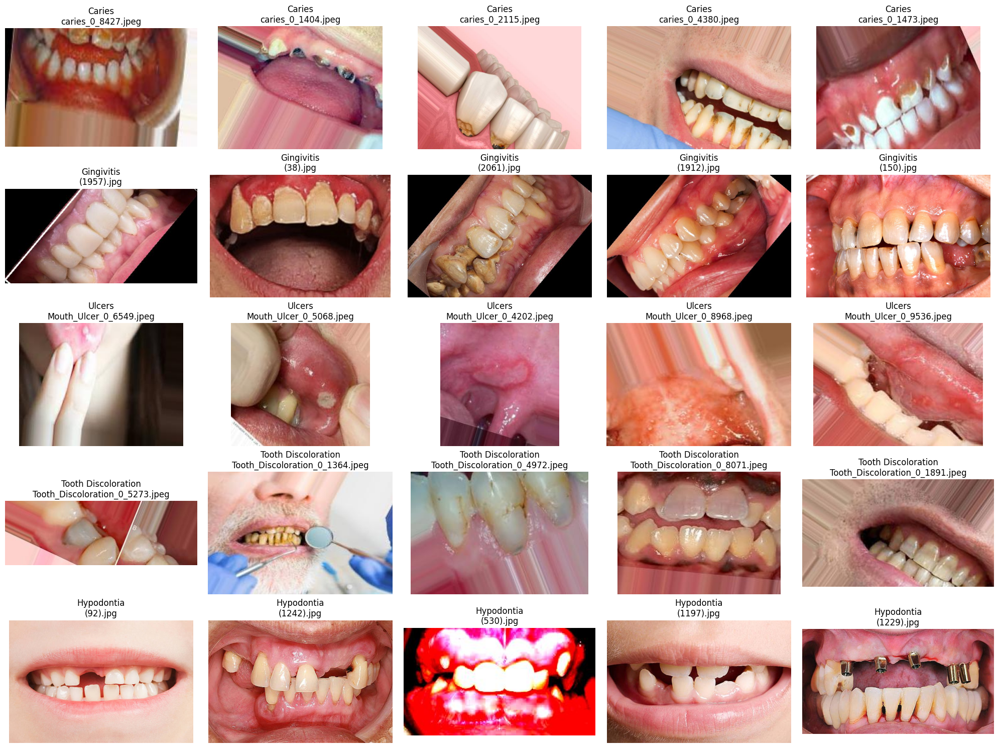

In [8]:
import matplotlib.pyplot as plt
import os

# Define the base directory where the dataset is organized
base_dir = '/kaggle/working/dataset'

# Define the classes
classes = [ 'Caries', 'Gingivitis', 'Ulcers', 'Tooth Discoloration', 'Hypodontia']

# Set up the plot
plt.figure(figsize=(20, 15))
num_samples = 5  # Number of images to display per class

# Loop through each class and display 5 images
for class_idx, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, 'train', class_name)  # Use the 'train' split
    image_files = os.listdir(class_path)[:num_samples]  # Get the first 5 images

    for img_idx, img_file in enumerate(image_files):
        img_path = os.path.join(class_path, img_file)
        img = plt.imread(img_path)

        # Plot the image
        plt.subplot(len(classes), num_samples, class_idx * num_samples + img_idx + 1)
        plt.imshow(img)
        plt.title(f"{class_name}\n{img_file}")
        plt.axis('off')

plt.tight_layout()
plt.show()

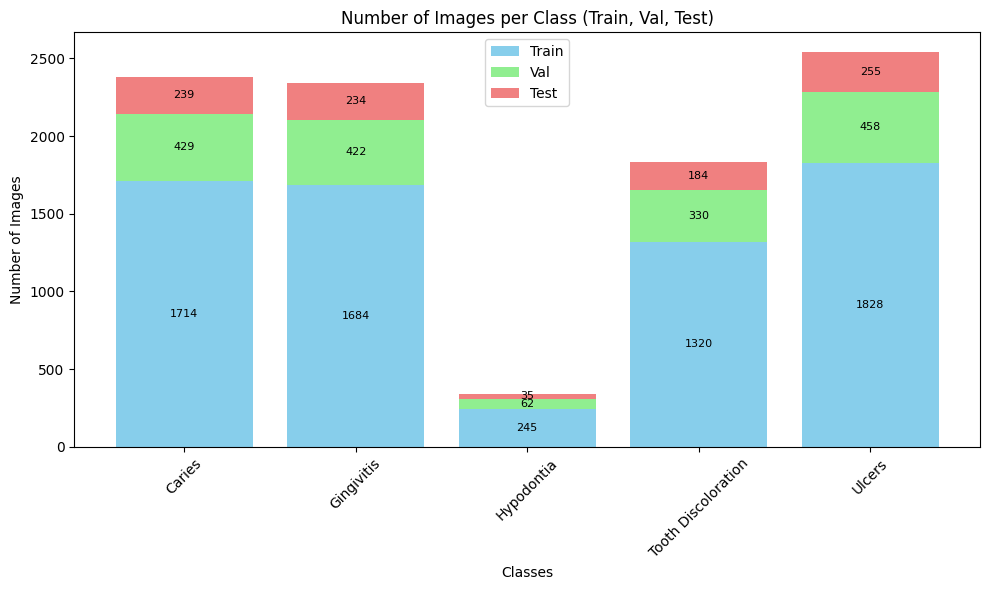

In [10]:
import os
import matplotlib.pyplot as plt

# Define class labels without 'Calculus'
classes = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']

# Define base directory
base_dir = '/kaggle/working/dataset'  # Update this path

# Initialize dictionaries to hold the counts for train, val, and test sets
class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in classes}

# Function to count images in each split
def count_images(base_dir, class_name):
    counts = {}
    for split in ['train', 'val', 'test']:
        split_dir = os.path.join(base_dir, split, class_name)
        if os.path.exists(split_dir):  # Check if directory exists
            counts[split] = len(os.listdir(split_dir))
        else:
            counts[split] = 0
    return counts

# Calculate counts for each class and split
for class_name in classes:
    class_split_counts[class_name] = count_images(base_dir, class_name)

# Create lists for the bar plot
labels = classes
train_counts = [class_split_counts[class_name]['train'] for class_name in classes]
val_counts = [class_split_counts[class_name]['val'] for class_name in classes]
test_counts = [class_split_counts[class_name]['test'] for class_name in classes]

x = range(len(classes))

# Create the stacked bar plot
fig, ax = plt.subplots(figsize=(10, 6))

bar1 = ax.bar(x, train_counts, label='Train', color='skyblue')
bar2 = ax.bar(x, val_counts, bottom=train_counts, label='Val', color='lightgreen')
bar3 = ax.bar(x, test_counts, bottom=[i+j for i,j in zip(train_counts, val_counts)], label='Test', color='lightcoral')

ax.set_xlabel('Classes')
ax.set_ylabel('Number of Images')
ax.set_title('Number of Images per Class (Train, Val, Test)')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend()

# Add data labels with corrected positions
for bar in bar1:
    height = bar.get_height()
    if height > 0:  # Only label if height is greater than 0
        ax.text(bar.get_x() + bar.get_width()/2, height / 2, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

for bar in bar2:
    height = bar.get_height()
    if height > 0:
        y_pos = bar.get_y() + height / 2  # Middle of the current segment
        ax.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

for bar in bar3:
    height = bar.get_height()
    if height > 0:
        y_pos = bar.get_y() + height / 2  # Middle of the current segment
        ax.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

plt.tight_layout()
plt.show()

# 1- Dental 

In [ ]:
import os
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.metrics import (accuracy_score, balanced_accuracy_score,
                             precision_score, recall_score, f1_score,
                             confusion_matrix, classification_report,
                             cohen_kappa_score, matthews_corrcoef, log_loss,
                             roc_curve, roc_auc_score, precision_recall_curve,
                             average_precision_score, brier_score_loss)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingLR
import albumentations as A
from albumentations.pytorch import ToTensorV2
import timm
from tqdm import tqdm

# ------------------------------------------------------------------
# 0‒ CONFIG & GLOBALS
# ------------------------------------------------------------------
SEED = 42
EPOCHS = 50
PATIENCE = 5
BATCH = 32
LR = 5e-4
IMG_SIZE = 128
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

DATASET_BASE_DIR = '/kaggle/working/dataset'
if not os.path.isdir(DATASET_BASE_DIR):
    print(f"Error: Specified DATASET_BASE_DIR not found at '{DATASET_BASE_DIR}'")
    print("Please check the path and ensure your dental dataset is mounted/located correctly.")

SAVE_DIR = '/content/gdrive/MyDrive/dental_models'
RESULTS_DIR = os.path.join(SAVE_DIR, 'results')
os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)

CLASSES = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
N_CLASSES = len(CLASSES)
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
TTA_STEPS = 5
LABEL_SMOOTHING = 0.1

# Added a list of beautiful colormaps for the confusion matrices
CMAP_LIST = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'YlGnBu', 'BuPu', 'GnBu', 'OrRd', 'PuBuGn']

# --- Seed everything for reproducibility ---
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# ------------------------------------------------------------------
# 1‒ Adjacency Matrix Definitions
# ------------------------------------------------------------------
def compute_cooccurrence_matrix(labels, n_classes, min_samples=10):
    """
    Compute adjacency matrix based on co-occurrence statistics from multi-label data.
    Args:
        labels: List or tensor of multi-label annotations (shape: [n_samples, n_classes]).
        n_classes: Number of classes.
        min_samples: Minimum co-occurrence count to consider a connection valid.
    Returns:
        torch.Tensor: Normalized adjacency matrix.
    """
    cooccur = torch.zeros(n_classes, n_classes)
    labels = torch.tensor(labels, dtype=torch.float32) if not isinstance(labels, torch.Tensor) else labels
    for i in range(n_classes):
        for j in range(i, n_classes):
            co_count = torch.sum((labels[:, i] == 1) & (labels[:, j] == 1)).item()
            if co_count >= min_samples:
                cooccur[i, j] = co_count
                cooccur[j, i] = co_count
    # Add self-loops
    cooccur += torch.eye(n_classes) * torch.max(cooccur)
    # Normalize rows
    cooccur = cooccur / (cooccur.sum(1).unsqueeze(1) + 1e-9)
    return cooccur

def get_clinical_adjacency_matrix(n_classes):
    """
    Define a clinically informed adjacency matrix as a fallback.
    Returns:
        torch.Tensor: Normalized adjacency matrix with weighted edges.
    """
    adj = torch.eye(n_classes)
    # Weighted connections based on clinical literature
    adj[0,1] = adj[1,0] = 0.8  # Caries ↔ Gingivitis (strong correlation)
    adj[0,3] = adj[3,0] = 0.5  # Caries ↔ Tooth Discoloration (moderate)
    adj[1,3] = adj[3,1] = 0.6  # Gingivitis ↔ Tooth Discoloration
    adj[0,4] = adj[4,0] = 0.7  # Caries ↔ Ulcers
    adj[1,4] = adj[4,1] = 0.7  # Gingivitis ↔ Ulcers
    adj[2,3] = adj[3,2] = 0.3  # Hypodontia ↔ Tooth Discoloration (weaker, developmental)
    adj[2,4] = adj[4,2] = 0.2  # Hypodontia ↔ Ulcers (weaker, rare co-occurrence)
    adj = adj / (adj.sum(1).unsqueeze(1) + 1e-9)
    return adj

class LearnableAdjacency(nn.Module):
    """
    Learnable adjacency matrix for GCN, initialized with clinical priors.
    """
    def __init__(self, n_classes, init_adj=None):
        super().__init__()
        if init_adj is None:
            init_adj = torch.eye(n_classes) + 0.1  # Small positive initial connections
        self.adj = nn.Parameter(init_adj.clone(), requires_grad=True)

    def forward(self):
        # Ensure non-negative weights and normalize
        adj = F.relu(self.adj)
        adj = (adj + adj.t()) / 2  # Ensure symmetry
        adj = adj / (adj.sum(1).unsqueeze(1) + 1e-9)
        return adj

# ------------------------------------------------------------------
# 2‒ TRANSFORMS
# ------------------------------------------------------------------
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=20, p=0.7),
    A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1, p=0.5),
    A.CoarseDropout(p=0.5),
    A.CLAHE(p=0.3),
    A.ElasticTransform(alpha=1, sigma=50, p=0.3),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2(),
])

tta_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2(),
])

# ------------------------------------------------------------------
# 3‒ DATASET
# ------------------------------------------------------------------
class MedicalDataset(Dataset):
    def __init__(self, source_dir, transform=None, is_tta=False):
        self.transform = transform
        self.is_tta = is_tta
        self.class_to_idx = {cls: i for i, cls in enumerate(CLASSES)}
        self.samples = []

        if not os.path.isdir(source_dir):
            print(f"Warning: Data directory '{source_dir}' not found.")
            return

        for lbl_idx, cls_name in enumerate(CLASSES):
            cls_path = os.path.join(source_dir, cls_name)
            if not os.path.isdir(cls_path):
                print(f"Warning: Class directory '{cls_name}' not found at '{cls_path}'.")
                continue
            for fn in os.listdir(cls_path):
                if fn.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(cls_path, fn)
                    self.samples.append((img_path, lbl_idx))

        if not self.samples:
            print(f"Warning: No valid image samples found in '{source_dir}'.")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = np.array(Image.open(path).convert('RGB'))
        if self.is_tta:
            images = [self.transform(image=img)['image'] for _ in range(TTA_STEPS)]
            return torch.stack(images), F.one_hot(torch.tensor(label), N_CLASSES).float()
        if self.transform:
            img = self.transform(image=img)['image']
        return img, F.one_hot(torch.tensor(label), N_CLASSES).float()

# ------------------------------------------------------------------
# 4‒ MODEL ARCHITECTURE
# ------------------------------------------------------------------
class SEBlock(nn.Module):
    def __init__(self, c, r=16):
        super().__init__()
        self.squeeze = nn.AdaptiveAvgPool2d(1)
        self.excitation = nn.Sequential(
            nn.Linear(c, c // r, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(c // r, c, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        bs, c, _, _ = x.shape
        y = self.squeeze(x).view(bs, c)
        y = self.excitation(y).view(bs, c, 1, 1)
        return x * y.expand_as(x)

class CustomModel(nn.Module):
    def __init__(self, model_name='densenet121', pretrained=True, adj=None, use_se=True, use_gcn=True,
                 use_multi_task=True, learnable_adj=False):
        super().__init__()
        self.model = timm.create_model(
            model_name,
            pretrained=pretrained,
            num_classes=0,
            global_pool=''
        )
        with torch.no_grad():
            dummy_input = torch.randn(2, 3, IMG_SIZE, IMG_SIZE)
            self.n_features = self.model(dummy_input).shape[1]
        self.use_se = use_se
        self.attention = SEBlock(self.n_features) if use_se else nn.Identity()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.use_multi_task = use_multi_task
        if use_multi_task:
            self.heads = nn.ModuleList([
                nn.Sequential(
                    nn.Linear(self.n_features, 512),
                    nn.BatchNorm1d(512),
                    nn.ReLU(inplace=True),
                    nn.Dropout(0.6),
                    nn.Linear(512, 1)
                ) for _ in range(N_CLASSES)
            ])
        else:
            self.classifier = nn.Sequential(
                nn.Linear(self.n_features, 512),
                nn.BatchNorm1d(512),
                nn.ReLU(inplace=True),
                nn.Dropout(0.6),
                nn.Linear(512, N_CLASSES)
            )
        self.use_gcn = use_gcn
        self.learnable_adj = learnable_adj
        if use_gcn:
            if learnable_adj:
                self.adj = LearnableAdjacency(N_CLASSES, init_adj=adj)
            else:
                self.adj = adj if adj is not None else torch.eye(N_CLASSES)

    def forward(self, x):
        features = self.model(x)
        features = self.attention(features)
        pooled = self.pool(features)
        flattened = torch.flatten(pooled, 1)
        if self.use_multi_task:
            heads_out = [head(flattened) for head in self.heads]
            logits = torch.cat(heads_out, dim=1)
        else:
            logits = self.classifier(flattened)
        if self.use_gcn:
            adj_matrix = self.adj() if self.learnable_adj else self.adj.to(logits.device)
            gcn_out = F.relu(torch.matmul(adj_matrix, logits.t())).t()
            logits = logits + gcn_out
        return logits

    def extract_features(self, x):
        features = self.model(x)
        features = self.attention(features)
        pooled = self.pool(features)
        return torch.flatten(pooled, 1)

# ------------------------------------------------------------------
# 5‒ LOSS FUNCTION
# ------------------------------------------------------------------
class FocalLoss(nn.Module):
    def __init__(self, alpha=.25, gamma=2, label_smoothing=0.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.smoothing = label_smoothing

    def forward(self, logits, targets):
        if self.smoothing > 0:
            targets = targets * (1 - self.smoothing) + self.smoothing / N_CLASSES
        bce_loss = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        pt = torch.exp(-bce_loss)
        loss = self.alpha * (1 - pt) ** self.gamma * bce_loss
        return loss.mean()

# ------------------------------------------------------------------
# 6‒ HELPER FUNCTIONS
# ------------------------------------------------------------------
def save_latex_to_file(content, filename):
    """Saves a string to a .tex file in the RESULTS_DIR."""
    path = os.path.join(RESULTS_DIR, filename)
    try:
        with open(path, 'w') as f:
            f.write(content)
        print(f"Successfully saved LaTeX file to: {path}")
    except Exception as e:
        print(f"Error saving LaTeX file to {path}: {e}")

def validate_epoch(model, loader, criterion, device, desc="Validation"):
    model.eval()
    loss_sum, correct, total = 0., 0, 0
    true_labels_list, predicted_labels_list, probabilities_list = [], [], []
    val_criterion = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)
    with torch.no_grad():
        for x, y in tqdm(loader, desc=desc):
            x, y = x.to(device), y.to(device)
            out = model(x)
            loss = val_criterion(out, y)
            loss_sum += loss.item() * x.size(0)
            prob = F.softmax(out, 1)
            pred = prob.argmax(1)
            correct += (pred == y.argmax(1)).sum().item()
            total += x.size(0)
            true_labels_list.append(y.cpu())
            predicted_labels_list.append(pred.cpu())
            probabilities_list.append(prob.cpu())
    avg_loss = loss_sum / total if total > 0 else 0
    accuracy = correct / total if total > 0 else 0
    true_labels_np = torch.cat(true_labels_list).numpy() if true_labels_list else np.array([])
    predicted_labels_np = torch.cat(predicted_labels_list).numpy() if predicted_labels_list else np.array([])
    probabilities_np = torch.cat(probabilities_list).numpy() if probabilities_list else np.array([])
    return avg_loss, accuracy, true_labels_np, predicted_labels_np, probabilities_np

@torch.no_grad()
def validate_tta(model, loader, criterion, device):
    model.eval()
    loss_sum, correct, total = 0., 0, 0
    true_labels_list, predicted_labels_list, probabilities_list = [], [], []
    val_criterion = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)
    for x_tta, y in tqdm(loader, desc="TTA Validation"):
        y = y.to(device)
        batch_size, n_tta, c, h, w = x_tta.shape
        x_tta = x_tta.view(-1, c, h, w).to(device)
        out = model(x_tta)
        prob_tta = F.softmax(out, 1).view(batch_size, n_tta, -1).mean(1)
        pred = prob_tta.argmax(1)
        avg_logits = torch.log(prob_tta.clamp(min=1e-9))
        loss = val_criterion(avg_logits, y)
        loss_sum += loss.item() * batch_size
        correct += (pred == y.argmax(1)).sum().item()
        total += batch_size
        true_labels_list.append(y.cpu())
        predicted_labels_list.append(pred.cpu())
        probabilities_list.append(prob_tta.cpu())
    avg_loss = loss_sum / total if total > 0 else 0
    accuracy = correct / total if total > 0 else 0
    true_labels_np = torch.cat(true_labels_list).numpy() if true_labels_list else np.array([])
    predicted_labels_np = torch.cat(predicted_labels_list).numpy() if predicted_labels_list else np.array([])
    probabilities_np = torch.cat(probabilities_list).numpy() if probabilities_list else np.array([])
    return avg_loss, accuracy, true_labels_np, predicted_labels_np, probabilities_np

def train_model(model, name, train_loader, val_loader, criterion, device):
    optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
    scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)
    scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))
    best_val_loss = float('inf')
    patience_counter = 0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
    print(f"\n=== Starting training for {name} for {EPOCHS} epochs ===")
    train_start_time = time.time()
    for epoch in range(1, EPOCHS + 1):
        model.train()
        running_loss = 0.0
        running_correct = 0
        total_samples = 0
        for x, y in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS} (Train)"):
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad(set_to_none=True)
            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                out = model(x)
                loss = criterion(out, y)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            running_loss += loss.item() * x.size(0)
            pred = F.softmax(out, 1).argmax(1)
            running_correct += (pred == y.argmax(1)).sum().item()
            total_samples += x.size(0)
        train_epoch_loss = running_loss / total_samples
        train_epoch_acc = running_correct / total_samples
        val_loss, val_acc, _, _, _ = validate_epoch(model, val_loader, criterion, device, desc=f"Epoch {epoch}/{EPOCHS} (Val)")
        history['train_loss'].append(train_epoch_loss)
        history['train_acc'].append(train_epoch_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        print(f"[{name}] Ep{epoch:02d} | Train Loss: {train_epoch_loss:.4f} Acc: {train_epoch_acc:.2%} | "
              f"Val Loss: {val_loss:.4f} Acc: {val_acc:.2%}")
        scheduler.step()
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            save_path = os.path.join(SAVE_DIR, f'best_model_{name}.pth')
            torch.save(model.state_dict(), save_path)
            print(f"    -> Model saved to {save_path}")
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print(f"    -> Early stopping triggered for {name} after {epoch} epochs.")
                break
    train_end_time = time.time()
    total_training_time = train_end_time - train_start_time
    epochs_completed = len(history['train_loss'])
    avg_runtime_per_epoch = total_training_time / epochs_completed if epochs_completed > 0 else 0
    return history, avg_runtime_per_epoch

def compute_macro_specificity(cm: np.ndarray) -> float:
    n_classes = cm.shape[0]
    total_samples = cm.sum()
    specificities = []
    for i in range(n_classes):
        true_positives = cm[i, i]
        false_positives = cm[:, i].sum() - true_positives
        false_negatives = cm[i, :].sum() - true_positives
        true_negatives = total_samples - (true_positives + false_positives + false_negatives)
        denominator = true_negatives + false_positives
        specificity_i = true_negatives / denominator if denominator > 0 else 0.0
        specificities.append(specificity_i)
    return float(np.mean(specificities))

def plot_roc(y_true, y_prob, title_prefix=""):
    plt.figure(figsize=(8, 6))
    sns.set_style("whitegrid")
    if N_CLASSES == 2:
        fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])
        roc_auc = roc_auc_score(y_true, y_prob[:, 1])
        plt.plot(fpr, tpr, label=f'{CLASSES[1]} (AUC = {roc_auc:.2f})', color='blue')
        plt.plot([0, 1], [0, 1], 'k--', label='Chance Line')
    else:
        y_true_binarized = label_binarize(y_true, classes=np.arange(N_CLASSES))
        colors = sns.color_palette("husl", N_CLASSES)
        for i in range(N_CLASSES):
            fpr, tpr, _ = roc_curve(y_true_binarized[:, i], y_prob[:, i])
            roc_auc = roc_auc_score(y_true_binarized[:, i], y_prob[:, i])
            plt.plot(fpr, tpr, label=f'{CLASSES[i]} (AUC = {roc_auc:.2f})', color=colors[i])
        macro_auc = roc_auc_score(y_true_binarized, y_prob, multi_class="ovo", average="macro")
        plt.plot([0, 1], [0, 1], 'k--', label=f'Macro AUC = {macro_auc:.2f}')
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title(f'{title_prefix} ROC Curve', fontsize=14)
    plt.legend(loc='lower right', fontsize=10)
    plt.grid(alpha=0.3)
    plt.savefig(os.path.join(RESULTS_DIR, f'{title_prefix.lower()}_roc.png'), dpi=300, bbox_inches='tight')
    plt.close()

def plot_prc(y_true, y_prob, title_prefix=""):
    plt.figure(figsize=(8, 6))
    sns.set_style("whitegrid")
    colors = sns.color_palette("husl", N_CLASSES)
    if N_CLASSES == 2:
        precision, recall, _ = precision_recall_curve(y_true, y_prob[:, 1])
        ap = average_precision_score(y_true, y_prob[:, 1])
        plt.plot(recall, precision, label=f'{CLASSES[1]} (AP = {ap:.2f})', color='blue')
    else:
        for i in range(N_CLASSES):
            precision, recall, _ = precision_recall_curve(y_true == i, y_prob[:, i])
            ap = average_precision_score(y_true == i, y_prob[:, i])
            plt.plot(recall, precision, label=f'{CLASSES[i]} (AP = {ap:.2f})', color=colors[i])
    plt.xlabel('Recall', fontsize=12)
    plt.ylabel('Precision', fontsize=12)
    plt.title(f'{title_prefix} Precision-Recall Curve', fontsize=14)
    plt.legend(loc='lower left', fontsize=10)
    plt.grid(alpha=0.3)
    plt.savefig(os.path.join(RESULTS_DIR, f'{title_prefix.lower()}_prc.png'), dpi=300, bbox_inches='tight')
    plt.close()

def plot_cm(y_true, y_pred, model_name="", cmap='Blues'):
    """
    Plots a confusion matrix with a customizable color map.
    """
    cm = confusion_matrix(y_true, y_pred)
    misclassified_count = cm.sum() - np.diag(cm).sum()
    plt.figure(figsize=(8, 6))
    sns.set_style("whitegrid")
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=CLASSES, yticklabels=CLASSES,
                annot_kws={"size": 10}, cbar_kws={'label': 'Count'})
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title(f'Confusion Matrix: {model_name}\n({misclassified_count} misclassified)', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)
    plt.savefig(os.path.join(RESULTS_DIR, f'{model_name.lower().replace(" ", "_")}_cm.png'), dpi=300, bbox_inches='tight')
    plt.close()

def get_target_layer(model_instance, model_name):
    model_backbone = model_instance.model
    if 'densenet' in model_name:
        return model_backbone.features.denseblock4.denselayer16.conv2
    elif 'efficientnet' in model_name:
        return model_backbone.conv_head
    elif 'resnet' in model_name:
        return model_backbone.layer4[-1]
    elif 'inception' in model_name:
        return model_backbone.Mixed_7c
    try:
        for module in reversed(list(model_backbone.modules())):
            if isinstance(module, nn.Conv2d):
                return module
    except Exception as e:
        print(f"Error finding target layer for {model_name}: {e}")
    return None

def compute_gradcam(model, target_layer, input_tensor, class_idx, model_name):
    if target_layer is None:
        return np.zeros((IMG_SIZE, IMG_SIZE))
    model.eval()
    feature_maps = []
    gradients = []
    def forward_hook(module, input, output):
        feature_maps.append(output.detach())
    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())
    hook_fwd = target_layer.register_forward_hook(forward_hook)
    hook_bwd = target_layer.register_full_backward_hook(backward_hook)
    output = model(input_tensor)
    score = output[:, class_idx].sum()
    model.zero_grad()
    score.backward(retain_graph=True)
    hook_fwd.remove()
    hook_bwd.remove()
    if not feature_maps or not gradients:
        return np.zeros((IMG_SIZE, IMG_SIZE))
    activations = feature_maps[0]
    grads = gradients[0]
    weights = grads.mean(dim=[2, 3], keepdim=True)
    cam = (weights * activations).sum(dim=1, keepdim=True).relu()
    cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
    cam = cam.squeeze().cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-9)
    return cam

def denormalize(img_tensor):
    mean = torch.tensor(MEAN).view(3, 1, 1).to(img_tensor.device)
    std = torch.tensor(STD).view(3, 1, 1).to(img_tensor.device)
    if img_tensor.dim() == 4:
        img_tensor = img_tensor.squeeze(0)
    img = img_tensor.cpu() * std.cpu() + mean.cpu()
    return img.permute(1, 2, 0).clamp(0, 1).numpy()

def plot_misclassified_images(dataset, true_labels, predicted_labels, probabilities, classes, num_cols=5):
    idxs = np.where(true_labels != predicted_labels)[0]
    if len(idxs) == 0:
        print("No misclassified images to display.")
        return
    display_idxs = idxs[:min(10, len(idxs))]
    rows = (len(display_idxs) + num_cols - 1) // num_cols
    fig, axes = plt.subplots(rows, num_cols, figsize=(15, 3 * rows))
    if rows == 1:
        axes = axes.reshape(1, -1) # Ensure axes is 2D array
    sns.set_style("whitegrid")

    for i, idx in enumerate(display_idxs):
        img_tensor, true_lbl_one_hot = dataset[idx]
        ax = axes.flatten()[i]
        ax.imshow(denormalize(img_tensor))
        ax.axis('off')
        pred_lbl = predicted_labels[idx]
        confidence = probabilities[idx, pred_lbl]
        ax.set_title(f"True: {classes[true_lbl_one_hot.argmax()]}\nPred: {classes[pred_lbl]} ({confidence:.2f})", fontsize=9)
    for j in range(len(display_idxs), len(axes.flatten())):
        fig.delaxes(axes.flatten()[j])
    plt.suptitle("Misclassified Samples (Backbone-Diverse Ensemble)", fontsize=14, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(os.path.join(RESULTS_DIR, 'misclassified_samples.png'), dpi=300, bbox_inches='tight')
    plt.close()

def plot_correctly_classified_images(dataset, true_labels, predicted_labels, probabilities, classes, n_display=10, num_cols=5):
    idxs = np.where(true_labels == predicted_labels)[0]
    if len(idxs) == 0:
        print("No correctly classified images to display.")
        return
    n_to_plot = min(n_display, len(idxs))
    sampled_idxs = random.sample(list(idxs), n_to_plot)
    rows = (n_to_plot + num_cols - 1) // num_cols
    fig, axes = plt.subplots(rows, num_cols, figsize=(15, 3 * rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    sns.set_style("whitegrid")

    for i, idx in enumerate(sampled_idxs):
        img_tensor, true_lbl_one_hot = dataset[idx]
        ax = axes.flatten()[i]
        ax.imshow(denormalize(img_tensor))
        ax.axis('off')
        confidence = probabilities[idx, true_lbl_one_hot.argmax()]
        ax.set_title(f"True/Pred: {classes[true_lbl_one_hot.argmax()]} ({confidence:.2f})", fontsize=9)
    for j in range(n_to_plot, len(axes.flatten())):
        fig.delaxes(axes.flatten()[j])
    plt.suptitle("Correctly Classified Samples (Backbone-Diverse Ensemble)", fontsize=14, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(os.path.join(RESULTS_DIR, 'correctly_classified_samples.png'), dpi=300, bbox_inches='tight')
    plt.close()

@torch.no_grad()
def extract_features(model, loader, device):
    model.eval()
    all_features, all_labels = [], []
    batch_count = 0
    try:
        for x, y in tqdm(loader, desc="Extracting Features"):
            x = x.to(device)
            features = model.extract_features(x)
            all_features.append(features.cpu().numpy())
            all_labels.append(y.argmax(1).cpu().numpy())
            batch_count += 1
    except Exception as e:
        print(f"Error during feature extraction: {e}")
    if not all_features:
        print(f"Warning: No features extracted. Processed {batch_count} batches. Check if data loader is empty or images are accessible.")
        return None, None
    print(f"Extracted features from {batch_count} batches.")
    return np.concatenate(all_features, axis=0), np.concatenate(all_labels, axis=0)

def plot_sample_images(dataset, title, n_per_class=5, num_cols=5):
    all_images_to_plot = []
    for class_idx in range(N_CLASSES):
        class_samples = [s for s in dataset.samples if s[1] == class_idx]
        if len(class_samples) < n_per_class:
            all_images_to_plot.extend(class_samples)
        else:
            all_images_to_plot.extend(random.sample(class_samples, n_per_class))
    if not all_images_to_plot:
        print(f"No samples found for '{title}'.")
        return
    all_images_to_plot.sort(key=lambda x: x[1])
    total_images_to_plot = len(all_images_to_plot)
    rows = (total_images_to_plot + num_cols - 1) // num_cols
    fig, axes = plt.subplots(rows, num_cols, figsize=(15, 3 * rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    sns.set_style("whitegrid")

    for i, (path, lbl) in enumerate(all_images_to_plot):
        ax = axes.flatten()[i]
        img = np.array(Image.open(path).convert('RGB'))
        ax.imshow(img)
        ax.set_title(f"Class: {CLASSES[lbl]}", fontsize=9)
        ax.axis('off')
    for j in range(total_images_to_plot, len(axes.flatten())):
        fig.delaxes(axes.flatten()[j])
    plt.suptitle(title, fontsize=14, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(os.path.join(RESULTS_DIR, f'{title.lower().replace(" ", "_")}.png'), dpi=300, bbox_inches='tight')
    plt.close()

def plot_test_metrics(results, ensemble_results, dataset_name, save_path=None):
    metrics = ['Accuracy', 'Balanced Acc', 'Precision', 'Recall', 'F1-Score',
               'Specificity', "Cohen's Kappa", 'MCC', 'AUC','Log Loss', 'Brier Score']
    metric_names = ['Accuracy', 'Balanced Accuracy', 'Precision', 'Recall', 'F1-Score',
                    'Specificity', "Cohen's Kappa", 'MCC', 'AUC','Log Loss', 'Brier Score']
    model_names = list(results.keys()) + ['Backbone Diverse Ensemble']
    all_results = {**results, 'Backbone Diverse Ensemble': ensemble_results}

    plt.figure(figsize=(16, 8))
    sns.set_style("whitegrid")
    bar_width = 0.075
    x = np.arange(len(model_names))
    colors = sns.color_palette("husl", len(metrics))

    max_value = 1.0
    for metric in metrics:
        values = [all_results[model].get(metric, 0) for model in model_names]
        if metric in ['Log Loss', 'Test Loss']:
            if values:
                max_value = max(max_value, max(values) * 1.1)
        else:
            max_value = max(max_value, 1.1)

    for i, metric in enumerate(metrics):
        values = [all_results[model].get(metric, 0) for model in model_names]
        plt.bar(x + i * bar_width, values, width=bar_width, color=colors[i], label=metric_names[i])

    plt.xlabel('Model', fontsize=12)
    plt.ylabel('Score', fontsize=12)
    plt.title(f'{dataset_name} - Test Metrics Comparison', fontsize=16)
    plt.xticks(x + bar_width * (len(metrics) / 2 - 0.5), model_names, rotation=45, ha="right", fontsize=10)
    plt.ylim(0, max_value)
    plt.legend(fontsize=10, loc='upper left', bbox_to_anchor=(1, 1))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved test metrics plot to {save_path}")
    plt.close()

# ------------------------------------------------------------------
# 7‒ MAIN EXECUTION SCRIPT
# ------------------------------------------------------------------
def main():
    # --- Data Setup ---
    os.makedirs(SAVE_DIR, exist_ok=True)
    train_data_dir = os.path.join(DATASET_BASE_DIR, 'train')
    val_data_dir = os.path.join(DATASET_BASE_DIR, 'val')
    test_data_dir = os.path.join(DATASET_BASE_DIR, 'test')

    if not (os.path.isdir(train_data_dir) and os.path.isdir(val_data_dir) and os.path.isdir(test_data_dir)):
        print(f"Error: One or more data directories not found under '{DATASET_BASE_DIR}'. Halting.")
        return

    # --- Initialize Adjacency Matrix ---
    # This logic is moved here to ensure MedicalDataset is defined before use.
    learnable_adj = False # Set to True to use learnable adjacency
    try:
        # Create a temporary dataset without transforms to efficiently get labels
        train_dataset_for_adj = MedicalDataset(train_data_dir, transform=None)
        if not train_dataset_for_adj.samples:
             raise ValueError("Temporary training dataset for adjacency matrix is empty.")

        # Optimized label conversion
        labels_one_hot = [F.one_hot(torch.tensor(sample[1]), N_CLASSES) for sample in train_dataset_for_adj.samples]
        labels = torch.stack(labels_one_hot)
        adj = compute_cooccurrence_matrix(labels, N_CLASSES)
        print("Successfully computed data-driven adjacency matrix.")
    except Exception as e:
        print(f"Failed to compute data-driven adjacency: {e}. Using clinical adjacency matrix.")
        adj = get_clinical_adjacency_matrix(N_CLASSES)


    # Dataset distribution visualization
    class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in CLASSES}
    def count_images(base_dir, class_name):
        counts = {}
        for split in ['train', 'val', 'test']:
            split_dir = os.path.join(base_dir, split, class_name)
            counts[split] = len(os.listdir(split_dir)) if os.path.exists(split_dir) else 0
        return counts

    for class_name in CLASSES:
        class_split_counts[class_name] = count_images(DATASET_BASE_DIR, class_name)

    labels = CLASSES
    train_counts = [class_split_counts[class_name]['train'] for class_name in CLASSES]
    val_counts = [class_split_counts[class_name]['val'] for class_name in CLASSES]
    test_counts = [class_split_counts[class_name]['test'] for class_name in CLASSES]

    plt.figure(figsize=(10, 6))
    sns.set_style("whitegrid")
    x = np.arange(len(CLASSES))
    bar1 = plt.bar(x, train_counts, label='Train', color='skyblue')
    bar2 = plt.bar(x, val_counts, bottom=train_counts, label='Val', color='lightgreen')
    bar3 = plt.bar(x, test_counts, bottom=[i+j for i,j in zip(train_counts, val_counts)], label='Test', color='lightcoral')
    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Number of Images', fontsize=12)
    plt.title('Dataset Distribution per Class', fontsize=14)
    plt.xticks(x, labels, rotation=45, ha='right', fontsize=10)
    plt.legend(fontsize=10)

    def add_bar_labels(bars):
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                y_pos = bar.get_y() + height / 2
                plt.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                         ha='center', va='center', color='black', fontsize=8)

    add_bar_labels(bar1)
    add_bar_labels(bar2)
    add_bar_labels(bar3)

    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, 'dataset_distribution.png'), dpi=300, bbox_inches='tight')
    plt.close()

    train_dataset = MedicalDataset(train_data_dir, transform=train_transform)
    val_dataset = MedicalDataset(val_data_dir, transform=val_transform)
    test_dataset_tta = MedicalDataset(test_data_dir, transform=tta_transform, is_tta=True)
    test_dataset = MedicalDataset(test_data_dir, transform=val_transform)
    eval_train_dataset = MedicalDataset(train_data_dir, transform=val_transform)

    # Debug dataset sizes
    print(f"\n--- Debug Dataset Sizes ---")
    print(f"Train dataset samples: {len(train_dataset.samples)}")
    print(f"Validation dataset samples: {len(val_dataset.samples)}")
    print(f"Test dataset samples: {len(test_dataset.samples)}")

    if not train_dataset.samples or not val_dataset.samples or not test_dataset.samples:
        print("Halting execution: One or more datasets are empty.")
        return

    train_loader = DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)
    test_loader_tta = DataLoader(test_dataset_tta, batch_size=BATCH // 2, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)
    eval_train_loader = DataLoader(eval_train_dataset, batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)

    print(f"\n--- Dataset Statistics ---")
    print(f"Classes: {CLASSES}")
    print(f"Training samples: {len(train_dataset)}")
    print(f"Validation samples: {len(val_dataset)}")
    print(f"Testing samples: {len(test_dataset)}")
    print("-" * 25)

    plot_sample_images(train_dataset, "Sample Training Images", n_per_class=5)

    # --- Model Training ---
    criterion = FocalLoss(label_smoothing=LABEL_SMOOTHING)
    model_configs = [
        #DenseNet121
        {'name': 'densenet121', 'backbone': 'densenet121', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'densenet121_no_se', 'backbone': 'densenet121', 'use_se': False, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'densenet121_no_gcn', 'backbone': 'densenet121', 'use_se': True, 'use_gcn': False, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'densenet121_no_mt', 'backbone': 'densenet121', 'use_se': True, 'use_gcn': True, 'use_multi_task': False, 'learnable_adj': learnable_adj},
        # EfficientNetV2
        {'name': 'tf_efficientnetv2_s', 'backbone': 'tf_efficientnetv2_s.in21k', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'tf_efficientnetv2_s_no_se', 'backbone': 'tf_efficientnetv2_s.in21k', 'use_se': False, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'tf_efficientnetv2_s_no_gcn', 'backbone': 'tf_efficientnetv2_s.in21k', 'use_se': True, 'use_gcn': False, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'tf_efficientnetv2_s_no_mt', 'backbone': 'tf_efficientnetv2_s.in21k', 'use_se': True, 'use_gcn': True, 'use_multi_task': False, 'learnable_adj': learnable_adj},
        # ResNet50
        {'name': 'resnet50', 'backbone': 'resnet50', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'resnet50_no_se', 'backbone': 'resnet50', 'use_se': False, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'resnet50_no_gcn', 'backbone': 'resnet50', 'use_se': True, 'use_gcn': False, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'resnet50_no_mt', 'backbone': 'resnet50', 'use_se': True, 'use_gcn': True, 'use_multi_task': False, 'learnable_adj': learnable_adj},
        # InceptionV3
        {'name': 'inception_v3', 'backbone': 'inception_v3', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'inception_v3_no_se', 'backbone': 'inception_v3', 'use_se': False, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'inception_v3_no_gcn', 'backbone': 'inception_v3', 'use_se': True, 'use_gcn': False, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'inception_v3_no_mt', 'backbone': 'inception_v3', 'use_se': True, 'use_gcn': True, 'use_multi_task': False, 'learnable_adj': learnable_adj},
        # Additional config for learnable adjacency
        {'name': 'densenet121_learnable_adj', 'backbone': 'densenet121', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': True},
        {'name': 'tf_efficientnetv2_s_learnable_adj', 'backbone': 'tf_efficientnetv2_s', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': True},
        {'name': 'resnet50_learnable_adj', 'backbone': 'resnet50', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': True},
        {'name': 'inception_v3_learnable_adj', 'backbone': 'inception_v3', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': True},
    ]

    histories = {}
    runtimes = {}
    for config in model_configs:
        model = CustomModel(model_name=config['backbone'], pretrained=True, adj=adj,
                            use_se=config['use_se'], use_gcn=config['use_gcn'],
                            use_multi_task=config['use_multi_task'], learnable_adj=config['learnable_adj']).to(DEVICE)
        history, avg_runtime = train_model(model, config['name'], train_loader, val_loader, criterion, DEVICE)
        histories[config['name']] = history
        runtimes[config['name']] = avg_runtime

    # --- Plotting Training Curves ---
    print("\n=== Plotting Model Training Curves ===")
    for model_name, history in histories.items():
        if not history['train_loss']:
            print(f"No history data for {model_name}.")
            continue
        epochs_ran = len(history['train_loss'])
        x_axis = np.arange(1, epochs_ran + 1)
        plt.figure(figsize=(12, 5))
        sns.set_style("whitegrid")
        plt.subplot(1, 2, 1)
        plt.plot(x_axis, history['train_loss'], 'o-', label='Train Loss', color='blue')
        plt.plot(x_axis, history['val_loss'], 'o-', label='Val Loss', color='orange')
        plt.xlabel('Epoch', fontsize=12)
        plt.ylabel('Loss', fontsize=12)
        plt.title('Loss', fontsize=12)
        plt.legend(fontsize=10)
        plt.grid(True, alpha=0.3)
        plt.subplot(1, 2, 2)
        plt.plot(x_axis, [acc * 100 for acc in history['train_acc']], 'o-', label='Train Acc', color='blue')
        plt.plot(x_axis, [acc * 100 for acc in history['val_acc']], 'o-', label='Val Acc', color='orange')
        plt.xlabel('Epoch', fontsize=12)
        plt.ylabel('Accuracy (%)', fontsize=12)
        plt.title('Accuracy', fontsize=12)
        plt.legend(fontsize=10)
        plt.grid(True, alpha=0.3)
        plt.suptitle(f'Training History: {model_name}', fontsize=14)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.savefig(os.path.join(RESULTS_DIR, f'{model_name}_training_curves.png'), dpi=300, bbox_inches='tight')
        plt.close()

    # --- Individual Model Evaluation & Ensemble ---
    print("\n" + "="*20 + " Evaluating Models " + "="*20)
    model_files_exist = any(os.path.exists(os.path.join(SAVE_DIR, f'best_model_{config["name"]}.pth')) for config in model_configs)
    if not model_files_exist:
        print(f"No trained model checkpoints found in '{SAVE_DIR}'.")
        return

    individual_results = {}
    all_train_probs, all_val_probs, all_test_probs = [], [], []
    train_true, val_true, test_true = None, None, None
    val_accuracies_for_weights = []
    model_results = []

    for i, config in enumerate(model_configs):
        model_name = config['name']
        model_path = os.path.join(SAVE_DIR, f'best_model_{model_name}.pth')
        if not os.path.exists(model_path):
            print(f"Skipping evaluation for {model_name}: Model checkpoint not found.")
            val_accuracies_for_weights.append(0)
            continue
        print(f"\n--- Evaluating Model: {model_name} ---")
        model = CustomModel(model_name=config['backbone'], pretrained=False, adj=adj,
                            use_se=config['use_se'], use_gcn=config['use_gcn'],
                            use_multi_task=config['use_multi_task'], learnable_adj=config['learnable_adj']).to(DEVICE)
        model.load_state_dict(torch.load(model_path, map_location=DEVICE))
        model.eval()
        _, _, train_true_temp, _, train_prob_temp = validate_epoch(model, eval_train_loader, criterion, DEVICE, desc=f"{model_name} Train Eval")
        val_loss_temp, val_acc_temp, val_true_temp, _, val_prob_temp = validate_epoch(model, val_loader, criterion, DEVICE, desc=f"{model_name} Val Eval")
        test_loss_temp, test_acc_temp, test_true_temp, test_pred_temp, test_prob_temp = validate_tta(model, test_loader_tta, criterion, DEVICE)
        if train_true is None: train_true = train_true_temp
        if val_true is None: val_true = val_true_temp
        if test_true is None: test_true = test_true_temp
        all_train_probs.append(train_prob_temp)
        all_val_probs.append(val_prob_temp)
        all_test_probs.append(test_prob_temp)
        val_accuracies_for_weights.append(val_acc_temp)
        model_results.append({
            'name': model_name,
            'backbone': config['backbone'],
            'val_acc': val_acc_temp,
            'train_prob': train_prob_temp,
            'val_prob': val_prob_temp,
            'test_prob': test_prob_temp,
            'test_pred': test_pred_temp,
            'config': config
        })
        print(f"   -> Test Accuracy (TTA): {test_acc_temp:.2%}")
        y_test_true_idx = np.argmax(test_true_temp, axis=1)

        # Select a cmap from the list and pass it to the plot function
        cmap_choice = CMAP_LIST[i % len(CMAP_LIST)]
        plot_cm(y_test_true_idx, test_pred_temp, model_name, cmap=cmap_choice)

        cm_individual = confusion_matrix(y_test_true_idx, test_pred_temp)
        y_test_binarized = label_binarize(y_test_true_idx, classes=np.arange(N_CLASSES))
        auc_ind = roc_auc_score(y_test_binarized, test_prob_temp, multi_class="ovo", average="macro")
        brier_ind = np.mean([brier_score_loss((y_test_true_idx == i).astype(int), test_prob_temp[:, i]) for i in range(N_CLASSES)])
        mcc_ind = matthews_corrcoef(y_test_true_idx, test_pred_temp)
        logloss_ind = log_loss(y_test_binarized, test_prob_temp)
        individual_results[model_name] = {
            'Test Loss': float(test_loss_temp),
            'Accuracy': accuracy_score(y_test_true_idx, test_pred_temp),
            'Balanced Acc': balanced_accuracy_score(y_test_true_idx, test_pred_temp),
            'Precision': precision_score(y_test_true_idx, test_pred_temp, average='weighted'),
            'Recall': recall_score(y_test_true_idx, test_pred_temp, average='weighted'),
            'F1-Score': f1_score(y_test_true_idx, test_pred_temp, average='weighted'),
            'Specificity': compute_macro_specificity(cm_individual),
            "Cohen's Kappa": cohen_kappa_score(y_test_true_idx, test_pred_temp),
            "MCC": mcc_ind,
            "Log Loss": logloss_ind,
            "Brier Score": brier_ind,
            "AUC": auc_ind
        }

    # Address Reviewer 1: Ablation study
    print("\n=== Ablation Study Results ===")
    print("Ablation studies for SE, GCN, multi-task learning, and learnable adjacency conducted across all backbones to evaluate component contributions.")

    # --- Weighted Ensemble Analysis (Top Configuration per Backbone) ---
    if not all_test_probs:
        print("No model outputs collected for ensemble.")
        return
    print("\n" + "="*20 + " Weighted Ensemble Evaluation (Top Configuration per Backbone) " + "="*20)

    # Group models by backbone and select the top configuration for each
    backbone_groups = {}
    for result in model_results:
        backbone = result['backbone']
        if backbone not in backbone_groups:
            backbone_groups[backbone] = []
        backbone_groups[backbone].append(result)

    selected_models = []
    for backbone, results in backbone_groups.items():
        if results:
            # Select the configuration with the highest validation accuracy
            best_model = max(results, key=lambda x: x['val_acc'])
            selected_models.append(best_model)
            print(f"Selected {best_model['name']} for backbone {backbone} with Val Acc = {best_model['val_acc']:.2%}")

    # Prepare ensemble
    if selected_models:
        print(f"\nSelected {len(selected_models)} configurations (one per backbone):")
        for model in selected_models:
            print(f"   - {model['name']} ({model['backbone']}): Val Acc = {model['val_acc']:.2%}")
        selected_configs = [model['config'] for model in selected_models]
        selected_train_probs = [model['train_prob'] for model in selected_models]
        selected_val_probs = [model['val_prob'] for model in selected_models]
        selected_test_probs = [model['test_prob'] for model in selected_models]
        selected_weights = [model['val_acc'] for model in selected_models]
        total_val_acc = sum(selected_weights)
        if total_val_acc == 0:
            print("Warning: Sum of validation accuracies for selected configurations is zero. Using equal weights.")
            model_weights = [1.0 / len(selected_models)] * len(selected_models)
        else:
            model_weights = [acc / total_val_acc for acc in selected_weights]
    else:
        print("Warning: No valid configurations available for ensemble. Skipping ensemble evaluation.")
        return

    print("\nModel Weights for Ensemble:")
    for config, weight in zip(selected_configs, model_weights):
        print(f"   - {config['name']}: {weight:.4f}")

    def evaluate_ensemble(probs_list, y_true_ens, weights_ens):
        avg_probs_ens = np.average(np.array(probs_list), axis=0, weights=weights_ens)
        normalized_probs_ens = avg_probs_ens / np.sum(avg_probs_ens, axis=1, keepdims=True)
        preds_ens = np.argmax(normalized_probs_ens, axis=1)
        avg_logits_ens = torch.log(torch.tensor(normalized_probs_ens, dtype=torch.float32, device=DEVICE).clamp(min=1e-9))
        labels_ens = torch.tensor(y_true_ens, dtype=torch.float32, device=DEVICE)
        val_criterion_ens = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)
        with torch.no_grad():
            loss_ens = val_criterion_ens(avg_logits_ens, labels_ens).item()
        y_true_idx = np.argmax(y_true_ens, axis=1)
        acc_ens = accuracy_score(y_true_idx, preds_ens)
        return loss_ens, acc_ens, normalized_probs_ens, preds_ens

    ens_train_loss, ens_train_acc, _, _ = evaluate_ensemble(selected_train_probs, train_true, model_weights)
    ens_val_loss, ens_val_acc, _, _ = evaluate_ensemble(selected_val_probs, val_true, model_weights)
    ens_test_loss, ens_test_acc, ens_test_probs, ens_test_preds = evaluate_ensemble(selected_test_probs, test_true, model_weights)

    test_true_idx = np.argmax(test_true, axis=1)
    balanced_acc_ens = balanced_accuracy_score(test_true_idx, ens_test_preds)
    precision_val_ens = precision_score(test_true_idx, ens_test_preds, average='weighted')
    recall_val_ens = recall_score(test_true_idx, ens_test_preds, average='weighted')
    f1_val_ens = f1_score(test_true_idx, ens_test_preds, average='weighted')
    kappa_ens = cohen_kappa_score(test_true_idx, ens_test_preds)
    mcc_ens = matthews_corrcoef(test_true_idx, ens_test_preds)
    logloss_val_ens = log_loss(label_binarize(test_true_idx, classes=np.arange(N_CLASSES)), ens_test_probs)
    cm_ensemble_final = confusion_matrix(test_true_idx, ens_test_preds)
    specificity_ens = compute_macro_specificity(cm_ensemble_final)
    brier_score_val_ens = np.mean([brier_score_loss((test_true_idx == i).astype(int), ens_test_probs[:, i]) for i in range(N_CLASSES)])
    auc_val_ens = roc_auc_score(label_binarize(test_true_idx, classes=np.arange(N_CLASSES)), ens_test_probs, multi_class="ovo", average="macro")
    fn_ensemble = cm_ensemble_final.sum(axis=1) - np.diag(cm_ensemble_final)
    tp_ensemble = np.diag(cm_ensemble_final)
    fnr_ensemble = np.array([fn_ensemble[i] / (fn_ensemble[i] + tp_ensemble[i]) if (fn_ensemble[i] + tp_ensemble[i]) > 0 else 0.0 for i in range(N_CLASSES)])

    print("\n=== Final Ensemble Evaluation Results (Backbone-Diverse Ensemble) ===")
    print(f"Accuracy: {ens_test_acc:.4f}")
    print(f"Balanced Accuracy: {balanced_acc_ens:.4f}")
    print(f"Precision: {precision_val_ens:.4f}")
    print(f"Recall: {recall_val_ens:.4f}")
    print(f"F1-Score: {f1_val_ens:.4f}")
    print(f"Specificity: {specificity_ens:.4f}")
    print(f"Cohen's Kappa: {kappa_ens:.4f}")
    print(f"MCC: {mcc_ens:.4f}")
    print(f"Log Loss: {logloss_val_ens:.4f}")
    print(f"Brier Score: {brier_score_val_ens:.4f}")
    print(f"AUC: {auc_val_ens:.4f}")
    print("\nFalse-Negative Rate per Class:")
    for i, cls_name in enumerate(CLASSES):
        print(f"{cls_name}: {fnr_ensemble[i]:.4f}")
    print("\nClassification Report:")
    print(classification_report(test_true_idx, ens_test_preds, target_names=CLASSES, digits=4))

    plot_roc(test_true_idx, ens_test_probs, title_prefix="Backbone_Diverse_Ensemble")
    plot_prc(test_true_idx, ens_test_probs, title_prefix="Backbone_Diverse_Ensemble")
    plot_cm(test_true_idx, ens_test_preds, "Backbone Diverse Ensemble", cmap='Greens')

    # --- Generate and Save Ensemble Report and LaTeX Tables ---
    # Build the summary string for the ensemble report
    ensemble_summary_content = "==================== Weighted Ensemble Evaluation (Top Configuration per Backbone) ====================\n"
    for model in selected_models:
        ensemble_summary_content += f"Selected {model['name']} for backbone {model['backbone']} with Val Acc = {model['val_acc']:.2%}\n"
    ensemble_summary_content += f"\nSelected {len(selected_models)} configurations (one per backbone):\n"
    for model in selected_models:
        ensemble_summary_content += f"   - {model['name']} ({model['backbone']}): Val Acc = {model['val_acc']:.2%}\n"
    ensemble_summary_content += "\nModel Weights for Ensemble:\n"
    for config, weight in zip(selected_configs, model_weights):
        ensemble_summary_content += f"   - {config['name']}: {weight:.4f}\n"
    ensemble_summary_content += "\n=== Final Ensemble Evaluation Results (Backbone-Diverse Ensemble) ===\n"
    ensemble_summary_content += f"Accuracy: {ens_test_acc:.4f}\n"
    ensemble_summary_content += f"Balanced Accuracy: {balanced_acc_ens:.4f}\n"
    ensemble_summary_content += f"Precision: {precision_val_ens:.4f}\n"
    ensemble_summary_content += f"Recall: {recall_val_ens:.4f}\n"
    ensemble_summary_content += f"F1-Score: {f1_val_ens:.4f}\n"
    ensemble_summary_content += f"Specificity: {specificity_ens:.4f}\n"
    ensemble_summary_content += f"Cohen's Kappa: {kappa_ens:.4f}\n"
    ensemble_summary_content += f"MCC: {mcc_ens:.4f}\n"
    ensemble_summary_content += f"Log Loss: {logloss_val_ens:.4f}\n"
    ensemble_summary_content += f"Brier Score: {brier_score_val_ens:.4f}\n"
    ensemble_summary_content += f"AUC: {auc_val_ens:.4f}\n"
    ensemble_summary_content += "\nFalse-Negative Rate per Class:\n"
    for i, cls_name in enumerate(CLASSES):
        ensemble_summary_content += f"{cls_name}: {fnr_ensemble[i]:.4f}\n"
    ensemble_summary_content += "\nClassification Report:\n"
    ensemble_summary_content += classification_report(test_true_idx, ens_test_preds, target_names=CLASSES, digits=4)

    # Wrap the summary in a compilable LaTeX document
    latex_summary_doc = (
        "\\documentclass{article}\n"
        "\\usepackage[utf8]{inputenc}\n"
        "\\usepackage{geometry}\n"
        "\\geometry{a4paper, margin=1in}\n"
        "\\begin{document}\n"
        "\\section*{Ensemble Evaluation Summary}\n"
        "\\begin{verbatim}\n"
        f"{ensemble_summary_content}"
        "\\end{verbatim}\n"
        "\\end{document}\n"
    )
    save_latex_to_file(latex_summary_doc, 'ensemble_summary_report.tex')


    # --- LaTeX Tables ---
    df_results = pd.DataFrame.from_dict(individual_results, orient='index').reset_index().rename(columns={'index':'Model'})
    ensemble_results_entry = {
        'Model': '**Backbone Diverse Ensemble**',
        'Test Loss': ens_test_loss,
        'Accuracy': ens_test_acc,
        'Balanced Acc': balanced_acc_ens,
        'Precision': precision_val_ens,
        'Recall': recall_val_ens,
        'F1-Score': f1_val_ens,
        'Specificity': specificity_ens,
        "Cohen's Kappa": kappa_ens,
        "MCC": mcc_ens,
        "Log Loss": logloss_val_ens,
        'Brier Score': brier_score_val_ens,
        'AUC': auc_val_ens
    }
    ensemble_results_df = pd.DataFrame([ensemble_results_entry])
    df_results = pd.concat([df_results, ensemble_results_df], ignore_index=True)
    for col in ['Accuracy', 'Balanced Acc', 'Precision', 'Recall', 'F1-Score', 'Specificity']:
        df_results[col] = df_results[col] * 100
    results_col_order = [
        'Model', 'Test Loss', 'Accuracy', 'Balanced Acc', 'Precision', 'Recall',
        'F1-Score', 'Specificity', "Cohen's Kappa", "MCC", "Log Loss", 'Brier Score', 'AUC'
    ]
    df_results = df_results[results_col_order]

    # Generate and save the performance table
    test_performance_latex = df_results.to_latex(index=False,
                              caption="Test set performance metrics (with TTA) across all models and backbone-diverse ensemble.",
                              label="tab:model_performance",
                              float_format="%.2f",
                              column_format="|l|r|rrrrrrrrrr|")
    print("\n\n=== LaTeX Table: Test Performance ===")
    print(test_performance_latex)
    save_latex_to_file(test_performance_latex, 'test_performance_table.tex')


    training_summary_results = {}
    for config in model_configs:
        model_name = config['name']
        history = histories.get(model_name, {})
        if not history['train_loss']: continue
        training_summary_results[model_name] = {
            'Train Loss': history['train_loss'][-1],
            'Val Loss': history['val_loss'][-1],
            'Train Acc': history['train_acc'][-1] * 100,
            'Val Acc': history['val_acc'][-1] * 100,
            'Avg Runtime (s)': runtimes.get(model_name, 0)
        }
    df_summary = pd.DataFrame.from_dict(training_summary_results, orient='index').reset_index().rename(columns={'index':'Model'})
    ensemble_summary_entry = {
        'Model': '**Backbone Diverse Ensemble**',
        'Train Loss': ens_train_loss,
        'Val Loss': ens_val_loss,
        'Train Acc': ens_train_acc * 100,
        'Val Acc': ens_val_acc * 100,
        'Avg Runtime (s)': 'N/A'
    }
    ensemble_summary_df = pd.DataFrame([ensemble_summary_entry])
    df_summary = pd.concat([df_summary, ensemble_summary_df], ignore_index=True)

    # Generate and save the training summary table
    training_summary_latex = df_summary.to_latex(index=False,
                              caption="Training and validation performance with runtime.",
                              label="tab:training_summary",
                              float_format="%.2f",
                              column_format="|l|rr|rr|r|")
    print("\n\n=== LaTeX Table: Training Summary ===")
    print(training_summary_latex)
    save_latex_to_file(training_summary_latex, 'training_summary_table.tex')


    # --- Plot final test metrics ---
    # The 'Model' key is not a metric, so remove it for plotting
    ensemble_results_for_plot = ensemble_results_entry.copy()
    if 'Model' in ensemble_results_for_plot:
        del ensemble_results_for_plot['Model']
    plot_test_metrics(
        individual_results,
        ensemble_results_for_plot,
        "Dental Conditions Dataset",
        save_path=os.path.join(RESULTS_DIR, 'test_metrics_comparison.png')
    )

    # --- t-SNE Visualization ---
    print("\nGenerating t-SNE Visualization...")
    tsne_features_list = []
    tsne_labels = None
    current_ensemble_models_for_tsne = []
    for config in model_configs:
        model_path = os.path.join(SAVE_DIR, f'best_model_{config["name"]}.pth')
        if os.path.exists(model_path):
            model_instance = CustomModel(model_name=config['backbone'], pretrained=False, adj=adj,
                                         use_se=config['use_se'], use_gcn=config['use_gcn'],
                                         use_multi_task=config['use_multi_task'], learnable_adj=config['learnable_adj']).to(DEVICE)
            model_instance.load_state_dict(torch.load(model_path, map_location=DEVICE))
            model_instance.eval()
            current_ensemble_models_for_tsne.append({'name': config['name'], 'model': model_instance})
    if current_ensemble_models_for_tsne:
        for model_info in current_ensemble_models_for_tsne:
            model_instance = model_info['model']
            feats, lbls = extract_features(model_instance, test_loader, DEVICE)
            if feats is None or lbls is None:
                print(f"Skipping t-SNE for {model_info['name']}: No features extracted.")
                continue
            tsne_features_list.append(feats)
            if tsne_labels is None:
                tsne_labels = lbls
        if not tsne_features_list:
            print("Skipping t-SNE: No features collected from any model.")
        else:
            ensemble_features_concat = np.concatenate(tsne_features_list, axis=1)
            perplexity_val = min(30, len(ensemble_features_concat) - 1)
            if perplexity_val <= 1:
                print("Not enough samples for t-SNE.")
            else:
                tsne_results = TSNE(n_components=2, random_state=SEED, perplexity=perplexity_val).fit_transform(ensemble_features_concat)
                plt.figure(figsize=(8, 6))
                sns.set_style("whitegrid")
                sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=[CLASSES[l] for l in tsne_labels],
                                palette='husl', s=50, alpha=0.8)
                plt.title('t-SNE of Ensemble Test Features', fontsize=14)
                plt.xlabel('t-SNE Component 1', fontsize=12)
                plt.ylabel('t-SNE Component 2', fontsize=12)
                plt.legend(title='Class', fontsize=10)
                plt.grid(alpha=0.3)
                plt.savefig(os.path.join(RESULTS_DIR, 'tsne_visualization.png'), dpi=300, bbox_inches='tight')
                plt.close()
    else:
        print("Skipping t-SNE: No models loaded.")

    # --- Grad-CAM Visualization ---
    print("\n" + "="*20 + " Grad-CAM Visualization (Ensemble) " + "="*20)
    current_ensemble_models_for_gradcam = []
    for config in model_configs:
        model_path = os.path.join(SAVE_DIR, f'best_model_{config["name"]}.pth')
        if os.path.exists(model_path):
            model_instance = CustomModel(model_name=config['backbone'], pretrained=False, adj=adj,
                                         use_se=config['use_se'], use_gcn=config['use_gcn'],
                                         use_multi_task=config['use_multi_task'], learnable_adj=config['learnable_adj']).to(DEVICE)
            model_instance.load_state_dict(torch.load(model_path, map_location=DEVICE))
            model_instance.eval()
            current_ensemble_models_for_gradcam.append({'name': config['name'], 'model': model_instance})
    if not current_ensemble_models_for_gradcam:
        print("No models loaded for Grad-CAM.")
    else:
        test_true_idx = np.argmax(test_true, axis=1)
        mis_idx_ens = np.where(test_true_idx != ens_test_preds)[0].tolist()
        cor_idx_ens = np.where(test_true_idx == ens_test_preds)[0].tolist()
        random.shuffle(mis_idx_ens)
        random.shuffle(cor_idx_ens)
        mis_idx_display = mis_idx_ens[:min(5, len(mis_idx_ens))]
        cor_idx_display = cor_idx_ens[:min(5, len(cor_idx_ens))]
        def gradcam_panel_ensemble(indices_to_plot, title_prefix, models_info, avg_probs_ens, preds_ens):
            if not indices_to_plot:
                print(f"No samples to plot for {title_prefix}")
                return
            rows = (len(indices_to_plot) + 4) // 5
            plt.figure(figsize=(15, 3.5 * rows))
            sns.set_style("whitegrid")
            axes = plt.subplots(rows, 5, figsize=(15, 3.5 * rows))[1].flatten()
            plt.suptitle(f"{title_prefix} (Backbone-Diverse Ensemble Grad-CAM)", fontsize=14, y=1.02)
            for i, idx in enumerate(indices_to_plot):
                ax = axes[i]
                img_tensor, true_lbl = test_dataset[idx]
                input_tensor_for_gradcam = img_tensor.unsqueeze(0).to(DEVICE)
                pred_label_idx = preds_ens[idx]
                confidence = avg_probs_ens[idx, pred_label_idx]
                heatmaps_from_models = []
                for model_info in models_info:
                    model_instance = model_info['model']
                    model_name = model_info['name']
                    target_layer = get_target_layer(model_instance, model_name)
                    if target_layer:
                        heatmap = compute_gradcam(model_instance, target_layer, input_tensor_for_gradcam, pred_label_idx, model_name)
                        heatmaps_from_models.append(heatmap)
                ax.imshow(denormalize(img_tensor))
                if heatmaps_from_models:
                    ensemble_heatmap_avg = np.mean(heatmaps_from_models, axis=0)
                    ax.imshow(ensemble_heatmap_avg, cmap='jet', alpha=0.4, extent=(0, IMG_SIZE, IMG_SIZE, 0))
                    ax.set_title(f"True: {CLASSES[true_lbl.argmax()]}\nPred: {CLASSES[pred_label_idx]} ({confidence:.2f})", fontsize=9)
                else:
                    ax.set_title(f"True: {CLASSES[true_lbl.argmax()]}\nPred: {CLASSES[pred_label_idx]}\n(CAM FAILED)", fontsize=9)
                ax.axis('off')
            for j in range(len(indices_to_plot), len(axes)):
                plt.delaxes(axes[j])
            plt.tight_layout(rect=[0, 0, 1, 0.98], h_pad=3)
            plt.savefig(os.path.join(RESULTS_DIR, f'{title_prefix.lower().replace(" ", "_")}_gradcam.png'), dpi=300, bbox_inches='tight')
            plt.close()
        gradcam_panel_ensemble(mis_idx_display, "Grad-CAM on Misclassified Samples", current_ensemble_models_for_gradcam, ens_test_probs, ens_test_preds)
        gradcam_panel_ensemble(cor_idx_display, "Grad-CAM on Correctly Classified Samples", current_ensemble_models_for_gradcam, ens_test_probs, ens_test_preds)

    # --- Final Visualizations ---
    print("\n" + "="*20 + " Visualizing Samples (Backbone-Diverse Ensemble) " + "="*20)
    plot_misclassified_images(test_dataset, test_true_idx, ens_test_preds, ens_test_probs, CLASSES)
    plot_correctly_classified_images(test_dataset, test_true_idx, ens_test_preds, ens_test_probs, CLASSES, n_display=5)


if __name__ == "__main__":
    main()



Successfully computed data-driven adjacency matrix.

--- Debug Dataset Sizes ---
Train dataset samples: 6791
Validation dataset samples: 1701
Test dataset samples: 947

--- Dataset Statistics ---
Classes: ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
Training samples: 6791
Validation samples: 1701
Testing samples: 947
-------------------------

=== Starting training for densenet121 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.68it/s]


[densenet121] Ep01 | Train Loss: 0.0236 Acc: 69.39% | Val Loss: 0.0091 Acc: 89.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.44it/s]


[densenet121] Ep02 | Train Loss: 0.0105 Acc: 86.60% | Val Loss: 0.0043 Acc: 95.41%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.51it/s]


[densenet121] Ep03 | Train Loss: 0.0075 Acc: 91.71% | Val Loss: 0.0033 Acc: 95.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.18it/s]


[densenet121] Ep04 | Train Loss: 0.0058 Acc: 93.86% | Val Loss: 0.0024 Acc: 97.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.90it/s]


[densenet121] Ep05 | Train Loss: 0.0050 Acc: 94.80% | Val Loss: 0.0021 Acc: 97.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.27it/s]


[densenet121] Ep06 | Train Loss: 0.0048 Acc: 95.35% | Val Loss: 0.0018 Acc: 98.41%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.39it/s]


[densenet121] Ep07 | Train Loss: 0.0046 Acc: 95.73% | Val Loss: 0.0016 Acc: 98.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.17it/s]


[densenet121] Ep08 | Train Loss: 0.0038 Acc: 96.72% | Val Loss: 0.0034 Acc: 98.24%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.24it/s]


[densenet121] Ep09 | Train Loss: 0.0035 Acc: 97.22% | Val Loss: 0.0013 Acc: 98.35%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.83it/s]


[densenet121] Ep10 | Train Loss: 0.0036 Acc: 97.22% | Val Loss: 0.0018 Acc: 97.47%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.00it/s]


[densenet121] Ep11 | Train Loss: 0.0032 Acc: 97.42% | Val Loss: 0.0018 Acc: 98.41%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.46it/s]


[densenet121] Ep12 | Train Loss: 0.0031 Acc: 97.70% | Val Loss: 0.0019 Acc: 98.24%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.35it/s]


[densenet121] Ep13 | Train Loss: 0.0033 Acc: 97.50% | Val Loss: 0.0014 Acc: 98.59%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.85it/s]


[densenet121] Ep14 | Train Loss: 0.0028 Acc: 98.00% | Val Loss: 0.0013 Acc: 98.77%
    -> Early stopping triggered for densenet121 after 14 epochs.

=== Starting training for densenet121_no_se for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.99it/s]


[densenet121_no_se] Ep01 | Train Loss: 0.0235 Acc: 68.63% | Val Loss: 0.0093 Acc: 89.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.19it/s]


[densenet121_no_se] Ep02 | Train Loss: 0.0104 Acc: 86.70% | Val Loss: 0.0044 Acc: 94.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.66it/s]


[densenet121_no_se] Ep03 | Train Loss: 0.0074 Acc: 91.68% | Val Loss: 0.0027 Acc: 96.83%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.40it/s]


[densenet121_no_se] Ep04 | Train Loss: 0.0056 Acc: 94.36% | Val Loss: 0.0037 Acc: 95.36%


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.19it/s]


[densenet121_no_se] Ep05 | Train Loss: 0.0049 Acc: 95.23% | Val Loss: 0.0017 Acc: 97.82%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.89it/s]


[densenet121_no_se] Ep06 | Train Loss: 0.0043 Acc: 95.94% | Val Loss: 0.0017 Acc: 97.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.38it/s]


[densenet121_no_se] Ep07 | Train Loss: 0.0040 Acc: 96.48% | Val Loss: 0.0019 Acc: 97.77%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.49it/s]


[densenet121_no_se] Ep08 | Train Loss: 0.0037 Acc: 96.82% | Val Loss: 0.0020 Acc: 97.24%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.46it/s]


[densenet121_no_se] Ep09 | Train Loss: 0.0035 Acc: 97.01% | Val Loss: 0.0016 Acc: 98.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.97it/s]


[densenet121_no_se] Ep10 | Train Loss: 0.0032 Acc: 97.53% | Val Loss: 0.0018 Acc: 98.24%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.73it/s]


[densenet121_no_se] Ep11 | Train Loss: 0.0033 Acc: 97.19% | Val Loss: 0.0013 Acc: 98.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.35it/s]


[densenet121_no_se] Ep12 | Train Loss: 0.0030 Acc: 97.70% | Val Loss: 0.0012 Acc: 98.53%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.32it/s]


[densenet121_no_se] Ep13 | Train Loss: 0.0035 Acc: 97.16% | Val Loss: 0.0015 Acc: 98.30%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.94it/s]


[densenet121_no_se] Ep14 | Train Loss: 0.0028 Acc: 97.94% | Val Loss: 0.0013 Acc: 98.53%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.47it/s]


[densenet121_no_se] Ep15 | Train Loss: 0.0033 Acc: 97.39% | Val Loss: 0.0014 Acc: 98.47%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.32it/s]


[densenet121_no_se] Ep16 | Train Loss: 0.0033 Acc: 97.38% | Val Loss: 0.0007 Acc: 98.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_se.pth


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.76it/s]


[densenet121_no_se] Ep17 | Train Loss: 0.0027 Acc: 98.22% | Val Loss: 0.0008 Acc: 99.00%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.86it/s]


[densenet121_no_se] Ep18 | Train Loss: 0.0023 Acc: 98.59% | Val Loss: 0.0011 Acc: 98.59%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.59it/s]


[densenet121_no_se] Ep19 | Train Loss: 0.0023 Acc: 98.53% | Val Loss: 0.0008 Acc: 99.29%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.94it/s]


[densenet121_no_se] Ep20 | Train Loss: 0.0021 Acc: 98.82% | Val Loss: 0.0010 Acc: 99.06%


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.43it/s]


[densenet121_no_se] Ep21 | Train Loss: 0.0037 Acc: 97.10% | Val Loss: 0.0016 Acc: 99.29%
    -> Early stopping triggered for densenet121_no_se after 21 epochs.

=== Starting training for densenet121_no_gcn for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.64it/s]


[densenet121_no_gcn] Ep01 | Train Loss: 0.0182 Acc: 73.67% | Val Loss: 0.0071 Acc: 92.48%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.60it/s]


[densenet121_no_gcn] Ep02 | Train Loss: 0.0093 Acc: 88.18% | Val Loss: 0.0044 Acc: 93.83%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.49it/s]


[densenet121_no_gcn] Ep03 | Train Loss: 0.0066 Acc: 92.58% | Val Loss: 0.0041 Acc: 95.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.61it/s]


[densenet121_no_gcn] Ep04 | Train Loss: 0.0059 Acc: 93.79% | Val Loss: 0.0026 Acc: 96.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.99it/s]


[densenet121_no_gcn] Ep05 | Train Loss: 0.0049 Acc: 95.04% | Val Loss: 0.0029 Acc: 96.47%


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.46it/s]


[densenet121_no_gcn] Ep06 | Train Loss: 0.0046 Acc: 95.42% | Val Loss: 0.0022 Acc: 97.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.96it/s]


[densenet121_no_gcn] Ep07 | Train Loss: 0.0043 Acc: 96.11% | Val Loss: 0.0016 Acc: 97.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.64it/s]


[densenet121_no_gcn] Ep08 | Train Loss: 0.0041 Acc: 96.32% | Val Loss: 0.0014 Acc: 97.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.74it/s]


[densenet121_no_gcn] Ep09 | Train Loss: 0.0038 Acc: 96.64% | Val Loss: 0.0015 Acc: 98.47%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.59it/s]


[densenet121_no_gcn] Ep10 | Train Loss: 0.0032 Acc: 97.38% | Val Loss: 0.0040 Acc: 96.77%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.32it/s]


[densenet121_no_gcn] Ep11 | Train Loss: 0.0037 Acc: 96.73% | Val Loss: 0.0013 Acc: 98.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.35it/s]


[densenet121_no_gcn] Ep12 | Train Loss: 0.0032 Acc: 97.63% | Val Loss: 0.0016 Acc: 97.94%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.64it/s]


[densenet121_no_gcn] Ep13 | Train Loss: 0.0041 Acc: 96.38% | Val Loss: 0.0010 Acc: 99.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.60it/s]


[densenet121_no_gcn] Ep14 | Train Loss: 0.0029 Acc: 98.09% | Val Loss: 0.0013 Acc: 98.94%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.54it/s]


[densenet121_no_gcn] Ep15 | Train Loss: 0.0025 Acc: 98.37% | Val Loss: 0.0011 Acc: 98.82%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.43it/s]


[densenet121_no_gcn] Ep16 | Train Loss: 0.0030 Acc: 97.91% | Val Loss: 0.0012 Acc: 98.59%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.62it/s]


[densenet121_no_gcn] Ep17 | Train Loss: 0.0024 Acc: 98.51% | Val Loss: 0.0008 Acc: 99.00%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.58it/s]


[densenet121_no_gcn] Ep18 | Train Loss: 0.0026 Acc: 98.28% | Val Loss: 0.0008 Acc: 98.94%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.89it/s]


[densenet121_no_gcn] Ep19 | Train Loss: 0.0023 Acc: 98.63% | Val Loss: 0.0009 Acc: 98.88%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.10it/s]


[densenet121_no_gcn] Ep20 | Train Loss: 0.0027 Acc: 98.16% | Val Loss: 0.0008 Acc: 98.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.07it/s]


[densenet121_no_gcn] Ep21 | Train Loss: 0.0021 Acc: 98.85% | Val Loss: 0.0007 Acc: 98.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.24it/s]


[densenet121_no_gcn] Ep22 | Train Loss: 0.0021 Acc: 98.97% | Val Loss: 0.0009 Acc: 98.88%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.17it/s]


[densenet121_no_gcn] Ep23 | Train Loss: 0.0020 Acc: 98.91% | Val Loss: 0.0009 Acc: 98.94%


Epoch 24/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.63it/s]


[densenet121_no_gcn] Ep24 | Train Loss: 0.0020 Acc: 98.90% | Val Loss: 0.0009 Acc: 98.88%


Epoch 25/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.89it/s]


[densenet121_no_gcn] Ep25 | Train Loss: 0.0018 Acc: 99.22% | Val Loss: 0.0008 Acc: 98.82%


Epoch 26/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.36it/s]


[densenet121_no_gcn] Ep26 | Train Loss: 0.0016 Acc: 99.37% | Val Loss: 0.0005 Acc: 99.41%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 27/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.42it/s]


[densenet121_no_gcn] Ep27 | Train Loss: 0.0017 Acc: 99.25% | Val Loss: 0.0005 Acc: 99.24%


Epoch 28/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.34it/s]


[densenet121_no_gcn] Ep28 | Train Loss: 0.0016 Acc: 99.38% | Val Loss: 0.0004 Acc: 99.53%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_gcn.pth


Epoch 29/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.78it/s]


[densenet121_no_gcn] Ep29 | Train Loss: 0.0017 Acc: 99.35% | Val Loss: 0.0007 Acc: 99.24%


Epoch 30/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.20it/s]


[densenet121_no_gcn] Ep30 | Train Loss: 0.0017 Acc: 99.40% | Val Loss: 0.0014 Acc: 98.35%


Epoch 31/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.26it/s]


[densenet121_no_gcn] Ep31 | Train Loss: 0.0016 Acc: 99.37% | Val Loss: 0.0007 Acc: 99.18%


Epoch 32/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.57it/s]


[densenet121_no_gcn] Ep32 | Train Loss: 0.0015 Acc: 99.57% | Val Loss: 0.0005 Acc: 99.24%


Epoch 33/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.52it/s]


[densenet121_no_gcn] Ep33 | Train Loss: 0.0014 Acc: 99.62% | Val Loss: 0.0006 Acc: 99.12%
    -> Early stopping triggered for densenet121_no_gcn after 33 epochs.

=== Starting training for densenet121_no_mt for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.20it/s]


[densenet121_no_mt] Ep01 | Train Loss: 0.0245 Acc: 64.50% | Val Loss: 0.0087 Acc: 88.48%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.90it/s]


[densenet121_no_mt] Ep02 | Train Loss: 0.0115 Acc: 84.72% | Val Loss: 0.0052 Acc: 93.83%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.57it/s]


[densenet121_no_mt] Ep03 | Train Loss: 0.0088 Acc: 89.49% | Val Loss: 0.0034 Acc: 95.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.70it/s]


[densenet121_no_mt] Ep04 | Train Loss: 0.0073 Acc: 91.93% | Val Loss: 0.0032 Acc: 96.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.74it/s]


[densenet121_no_mt] Ep05 | Train Loss: 0.0058 Acc: 94.08% | Val Loss: 0.0021 Acc: 97.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.03it/s]


[densenet121_no_mt] Ep06 | Train Loss: 0.0049 Acc: 95.02% | Val Loss: 0.0023 Acc: 97.47%


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.07it/s]


[densenet121_no_mt] Ep07 | Train Loss: 0.0046 Acc: 95.52% | Val Loss: 0.0028 Acc: 96.36%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.41it/s]


[densenet121_no_mt] Ep08 | Train Loss: 0.0039 Acc: 96.36% | Val Loss: 0.0022 Acc: 97.59%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.03it/s]


[densenet121_no_mt] Ep09 | Train Loss: 0.0045 Acc: 95.99% | Val Loss: 0.0015 Acc: 98.30%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.96it/s]


[densenet121_no_mt] Ep10 | Train Loss: 0.0036 Acc: 96.89% | Val Loss: 0.0014 Acc: 98.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.56it/s]


[densenet121_no_mt] Ep11 | Train Loss: 0.0039 Acc: 96.57% | Val Loss: 0.0013 Acc: 98.35%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.62it/s]


[densenet121_no_mt] Ep12 | Train Loss: 0.0039 Acc: 96.29% | Val Loss: 0.0014 Acc: 98.65%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.64it/s]


[densenet121_no_mt] Ep13 | Train Loss: 0.0038 Acc: 96.69% | Val Loss: 0.0014 Acc: 98.30%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.61it/s]


[densenet121_no_mt] Ep14 | Train Loss: 0.0033 Acc: 97.38% | Val Loss: 0.0013 Acc: 98.53%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.05it/s]


[densenet121_no_mt] Ep15 | Train Loss: 0.0031 Acc: 97.64% | Val Loss: 0.0011 Acc: 98.53%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.43it/s]


[densenet121_no_mt] Ep16 | Train Loss: 0.0029 Acc: 98.07% | Val Loss: 0.0009 Acc: 99.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.91it/s]


[densenet121_no_mt] Ep17 | Train Loss: 0.0025 Acc: 98.34% | Val Loss: 0.0013 Acc: 98.88%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.21it/s]


[densenet121_no_mt] Ep18 | Train Loss: 0.0025 Acc: 98.47% | Val Loss: 0.0010 Acc: 98.71%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.91it/s]


[densenet121_no_mt] Ep19 | Train Loss: 0.0024 Acc: 98.41% | Val Loss: 0.0008 Acc: 99.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.02it/s]


[densenet121_no_mt] Ep20 | Train Loss: 0.0024 Acc: 98.60% | Val Loss: 0.0007 Acc: 99.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_no_mt.pth


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.97it/s]


[densenet121_no_mt] Ep21 | Train Loss: 0.0021 Acc: 98.82% | Val Loss: 0.0010 Acc: 99.00%


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.98it/s]


[densenet121_no_mt] Ep22 | Train Loss: 0.0023 Acc: 98.70% | Val Loss: 0.0008 Acc: 99.00%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.04it/s]


[densenet121_no_mt] Ep23 | Train Loss: 0.0023 Acc: 98.50% | Val Loss: 0.0013 Acc: 98.41%


Epoch 24/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.98it/s]


[densenet121_no_mt] Ep24 | Train Loss: 0.0024 Acc: 98.56% | Val Loss: 0.0008 Acc: 99.00%


Epoch 25/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.91it/s]


[densenet121_no_mt] Ep25 | Train Loss: 0.0022 Acc: 98.90% | Val Loss: 0.0008 Acc: 99.06%
    -> Early stopping triggered for densenet121_no_mt after 25 epochs.


model.safetensors:   0%|          | 0.00/193M [00:00<?, ?B/s]


=== Starting training for tf_efficientnetv2_s for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.36it/s]


[tf_efficientnetv2_s] Ep01 | Train Loss: 0.0183 Acc: 77.65% | Val Loss: 0.0043 Acc: 94.89%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.71it/s]


[tf_efficientnetv2_s] Ep02 | Train Loss: 0.0070 Acc: 92.37% | Val Loss: 0.0025 Acc: 97.41%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.99it/s]


[tf_efficientnetv2_s] Ep03 | Train Loss: 0.0053 Acc: 95.07% | Val Loss: 0.0014 Acc: 98.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.37it/s]


[tf_efficientnetv2_s] Ep04 | Train Loss: 0.0047 Acc: 95.73% | Val Loss: 0.0015 Acc: 98.12%


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.20it/s]


[tf_efficientnetv2_s] Ep05 | Train Loss: 0.0040 Acc: 96.75% | Val Loss: 0.0010 Acc: 98.82%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.02it/s]


[tf_efficientnetv2_s] Ep06 | Train Loss: 0.0033 Acc: 97.44% | Val Loss: 0.0009 Acc: 99.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.31it/s]


[tf_efficientnetv2_s] Ep07 | Train Loss: 0.0030 Acc: 97.84% | Val Loss: 0.0011 Acc: 98.53%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.29it/s]


[tf_efficientnetv2_s] Ep08 | Train Loss: 0.0030 Acc: 97.72% | Val Loss: 0.0011 Acc: 98.65%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.81it/s]


[tf_efficientnetv2_s] Ep09 | Train Loss: 0.0026 Acc: 98.09% | Val Loss: 0.0010 Acc: 98.88%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.68it/s]


[tf_efficientnetv2_s] Ep10 | Train Loss: 0.0039 Acc: 96.64% | Val Loss: 0.0010 Acc: 98.88%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.25it/s]


[tf_efficientnetv2_s] Ep11 | Train Loss: 0.0026 Acc: 98.28% | Val Loss: 0.0011 Acc: 98.53%
    -> Early stopping triggered for tf_efficientnetv2_s after 11 epochs.

=== Starting training for tf_efficientnetv2_s_no_se for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.17it/s]


[tf_efficientnetv2_s_no_se] Ep01 | Train Loss: 0.0180 Acc: 77.47% | Val Loss: 0.0050 Acc: 93.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.75it/s]


[tf_efficientnetv2_s_no_se] Ep02 | Train Loss: 0.0068 Acc: 92.58% | Val Loss: 0.0018 Acc: 97.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.92it/s]


[tf_efficientnetv2_s_no_se] Ep03 | Train Loss: 0.0055 Acc: 94.64% | Val Loss: 0.0013 Acc: 98.41%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.11it/s]


[tf_efficientnetv2_s_no_se] Ep04 | Train Loss: 0.0040 Acc: 96.73% | Val Loss: 0.0017 Acc: 97.71%


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.47it/s]


[tf_efficientnetv2_s_no_se] Ep05 | Train Loss: 0.0037 Acc: 97.16% | Val Loss: 0.0010 Acc: 98.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.03it/s]


[tf_efficientnetv2_s_no_se] Ep06 | Train Loss: 0.0036 Acc: 96.80% | Val Loss: 0.0010 Acc: 99.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.10it/s]


[tf_efficientnetv2_s_no_se] Ep07 | Train Loss: 0.0037 Acc: 96.69% | Val Loss: 0.0012 Acc: 98.59%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.24it/s]


[tf_efficientnetv2_s_no_se] Ep08 | Train Loss: 0.0032 Acc: 97.56% | Val Loss: 0.0017 Acc: 98.41%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.26it/s]


[tf_efficientnetv2_s_no_se] Ep09 | Train Loss: 0.0028 Acc: 98.01% | Val Loss: 0.0019 Acc: 97.24%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.35it/s]


[tf_efficientnetv2_s_no_se] Ep10 | Train Loss: 0.0026 Acc: 98.23% | Val Loss: 0.0010 Acc: 98.88%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.97it/s]


[tf_efficientnetv2_s_no_se] Ep11 | Train Loss: 0.0026 Acc: 98.19% | Val Loss: 0.0014 Acc: 98.30%
    -> Early stopping triggered for tf_efficientnetv2_s_no_se after 11 epochs.

=== Starting training for tf_efficientnetv2_s_no_gcn for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.00it/s]


[tf_efficientnetv2_s_no_gcn] Ep01 | Train Loss: 0.0145 Acc: 80.78% | Val Loss: 0.0058 Acc: 94.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.93it/s]


[tf_efficientnetv2_s_no_gcn] Ep02 | Train Loss: 0.0074 Acc: 91.84% | Val Loss: 0.0026 Acc: 97.41%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.23it/s]


[tf_efficientnetv2_s_no_gcn] Ep03 | Train Loss: 0.0052 Acc: 94.96% | Val Loss: 0.0024 Acc: 96.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.63it/s]


[tf_efficientnetv2_s_no_gcn] Ep04 | Train Loss: 0.0051 Acc: 95.02% | Val Loss: 0.0017 Acc: 98.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.21it/s]


[tf_efficientnetv2_s_no_gcn] Ep05 | Train Loss: 0.0036 Acc: 96.78% | Val Loss: 0.0010 Acc: 98.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.66it/s]


[tf_efficientnetv2_s_no_gcn] Ep06 | Train Loss: 0.0037 Acc: 97.16% | Val Loss: 0.0010 Acc: 99.00%


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.04it/s]


[tf_efficientnetv2_s_no_gcn] Ep07 | Train Loss: 0.0035 Acc: 97.45% | Val Loss: 0.0014 Acc: 98.18%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.86it/s]


[tf_efficientnetv2_s_no_gcn] Ep08 | Train Loss: 0.0030 Acc: 97.78% | Val Loss: 0.0012 Acc: 98.53%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.83it/s]


[tf_efficientnetv2_s_no_gcn] Ep09 | Train Loss: 0.0038 Acc: 96.61% | Val Loss: 0.0018 Acc: 98.00%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.72it/s]


[tf_efficientnetv2_s_no_gcn] Ep10 | Train Loss: 0.0028 Acc: 98.07% | Val Loss: 0.0007 Acc: 98.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.40it/s]


[tf_efficientnetv2_s_no_gcn] Ep11 | Train Loss: 0.0027 Acc: 98.23% | Val Loss: 0.0013 Acc: 98.77%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.75it/s]


[tf_efficientnetv2_s_no_gcn] Ep12 | Train Loss: 0.0025 Acc: 98.38% | Val Loss: 0.0013 Acc: 98.41%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.34it/s]


[tf_efficientnetv2_s_no_gcn] Ep13 | Train Loss: 0.0025 Acc: 98.35% | Val Loss: 0.0009 Acc: 99.00%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.11it/s]


[tf_efficientnetv2_s_no_gcn] Ep14 | Train Loss: 0.0026 Acc: 98.31% | Val Loss: 0.0009 Acc: 98.88%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.87it/s]


[tf_efficientnetv2_s_no_gcn] Ep15 | Train Loss: 0.0022 Acc: 98.73% | Val Loss: 0.0010 Acc: 98.41%
    -> Early stopping triggered for tf_efficientnetv2_s_no_gcn after 15 epochs.

=== Starting training for tf_efficientnetv2_s_no_mt for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.13it/s]


[tf_efficientnetv2_s_no_mt] Ep01 | Train Loss: 0.0175 Acc: 77.01% | Val Loss: 0.0053 Acc: 94.00%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.07it/s]


[tf_efficientnetv2_s_no_mt] Ep02 | Train Loss: 0.0077 Acc: 91.71% | Val Loss: 0.0026 Acc: 96.47%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.20it/s]


[tf_efficientnetv2_s_no_mt] Ep03 | Train Loss: 0.0054 Acc: 94.52% | Val Loss: 0.0019 Acc: 97.35%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.99it/s]


[tf_efficientnetv2_s_no_mt] Ep04 | Train Loss: 0.0054 Acc: 94.65% | Val Loss: 0.0016 Acc: 98.30%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.57it/s]


[tf_efficientnetv2_s_no_mt] Ep05 | Train Loss: 0.0044 Acc: 95.98% | Val Loss: 0.0018 Acc: 97.65%


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.30it/s]


[tf_efficientnetv2_s_no_mt] Ep06 | Train Loss: 0.0047 Acc: 95.73% | Val Loss: 0.0022 Acc: 97.12%


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.21it/s]


[tf_efficientnetv2_s_no_mt] Ep07 | Train Loss: 0.0032 Acc: 97.45% | Val Loss: 0.0007 Acc: 99.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.91it/s]


[tf_efficientnetv2_s_no_mt] Ep08 | Train Loss: 0.0032 Acc: 97.76% | Val Loss: 0.0020 Acc: 98.41%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.34it/s]


[tf_efficientnetv2_s_no_mt] Ep09 | Train Loss: 0.0030 Acc: 97.81% | Val Loss: 0.0010 Acc: 99.18%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.10it/s]


[tf_efficientnetv2_s_no_mt] Ep10 | Train Loss: 0.0026 Acc: 97.97% | Val Loss: 0.0009 Acc: 99.00%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.32it/s]


[tf_efficientnetv2_s_no_mt] Ep11 | Train Loss: 0.0032 Acc: 97.64% | Val Loss: 0.0008 Acc: 98.94%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.70it/s]


[tf_efficientnetv2_s_no_mt] Ep12 | Train Loss: 0.0024 Acc: 98.56% | Val Loss: 0.0010 Acc: 99.18%
    -> Early stopping triggered for tf_efficientnetv2_s_no_mt after 12 epochs.

=== Starting training for resnet50 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.46it/s]


[resnet50] Ep01 | Train Loss: 0.0249 Acc: 67.43% | Val Loss: 0.0098 Acc: 87.30%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.76it/s]


[resnet50] Ep02 | Train Loss: 0.0125 Acc: 83.38% | Val Loss: 0.0055 Acc: 93.00%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.35it/s]


[resnet50] Ep03 | Train Loss: 0.0089 Acc: 89.24% | Val Loss: 0.0037 Acc: 95.30%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.00it/s]


[resnet50] Ep04 | Train Loss: 0.0069 Acc: 92.59% | Val Loss: 0.0028 Acc: 96.83%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.77it/s]


[resnet50] Ep05 | Train Loss: 0.0056 Acc: 94.26% | Val Loss: 0.0026 Acc: 97.47%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.13it/s]


[resnet50] Ep06 | Train Loss: 0.0046 Acc: 95.92% | Val Loss: 0.0021 Acc: 98.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.44it/s]


[resnet50] Ep07 | Train Loss: 0.0038 Acc: 97.05% | Val Loss: 0.0017 Acc: 98.47%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.00it/s]


[resnet50] Ep08 | Train Loss: 0.0036 Acc: 97.45% | Val Loss: 0.0015 Acc: 98.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.15it/s]


[resnet50] Ep09 | Train Loss: 0.0034 Acc: 97.79% | Val Loss: 0.0015 Acc: 98.41%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.05it/s]


[resnet50] Ep10 | Train Loss: 0.0031 Acc: 97.79% | Val Loss: 0.0011 Acc: 98.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.26it/s]


[resnet50] Ep11 | Train Loss: 0.0029 Acc: 98.34% | Val Loss: 0.0010 Acc: 99.00%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.43it/s]


[resnet50] Ep12 | Train Loss: 0.0028 Acc: 98.26% | Val Loss: 0.0011 Acc: 98.65%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.77it/s]


[resnet50] Ep13 | Train Loss: 0.0027 Acc: 98.20% | Val Loss: 0.0015 Acc: 98.77%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.32it/s]


[resnet50] Ep14 | Train Loss: 0.0025 Acc: 98.63% | Val Loss: 0.0009 Acc: 98.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.87it/s]


[resnet50] Ep15 | Train Loss: 0.0024 Acc: 98.76% | Val Loss: 0.0007 Acc: 99.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.13it/s]


[resnet50] Ep16 | Train Loss: 0.0024 Acc: 98.75% | Val Loss: 0.0010 Acc: 99.06%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.24it/s]


[resnet50] Ep17 | Train Loss: 0.0023 Acc: 98.78% | Val Loss: 0.0009 Acc: 98.94%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.12it/s]


[resnet50] Ep18 | Train Loss: 0.0019 Acc: 99.28% | Val Loss: 0.0007 Acc: 99.12%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.24it/s]


[resnet50] Ep19 | Train Loss: 0.0021 Acc: 98.95% | Val Loss: 0.0006 Acc: 99.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.58it/s]


[resnet50] Ep20 | Train Loss: 0.0020 Acc: 99.07% | Val Loss: 0.0009 Acc: 99.18%


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.95it/s]


[resnet50] Ep21 | Train Loss: 0.0019 Acc: 99.13% | Val Loss: 0.0011 Acc: 98.53%


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.28it/s]


[resnet50] Ep22 | Train Loss: 0.0018 Acc: 99.32% | Val Loss: 0.0007 Acc: 99.00%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.31it/s]


[resnet50] Ep23 | Train Loss: 0.0022 Acc: 98.91% | Val Loss: 0.0010 Acc: 99.12%


Epoch 24/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.00it/s]


[resnet50] Ep24 | Train Loss: 0.0022 Acc: 98.78% | Val Loss: 0.0007 Acc: 99.00%
    -> Early stopping triggered for resnet50 after 24 epochs.

=== Starting training for resnet50_no_se for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.69it/s]


[resnet50_no_se] Ep01 | Train Loss: 0.0260 Acc: 65.94% | Val Loss: 0.0109 Acc: 84.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.82it/s]


[resnet50_no_se] Ep02 | Train Loss: 0.0133 Acc: 82.64% | Val Loss: 0.0065 Acc: 92.30%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.79it/s]


[resnet50_no_se] Ep03 | Train Loss: 0.0092 Acc: 88.44% | Val Loss: 0.0039 Acc: 95.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.51it/s]


[resnet50_no_se] Ep04 | Train Loss: 0.0070 Acc: 92.20% | Val Loss: 0.0030 Acc: 96.47%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.30it/s]


[resnet50_no_se] Ep05 | Train Loss: 0.0056 Acc: 94.32% | Val Loss: 0.0025 Acc: 97.41%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.35it/s]


[resnet50_no_se] Ep06 | Train Loss: 0.0048 Acc: 95.63% | Val Loss: 0.0019 Acc: 97.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.12it/s]


[resnet50_no_se] Ep07 | Train Loss: 0.0042 Acc: 96.51% | Val Loss: 0.0017 Acc: 98.30%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.21it/s]


[resnet50_no_se] Ep08 | Train Loss: 0.0038 Acc: 96.67% | Val Loss: 0.0012 Acc: 98.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.18it/s]


[resnet50_no_se] Ep09 | Train Loss: 0.0032 Acc: 97.73% | Val Loss: 0.0012 Acc: 98.77%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.47it/s]


[resnet50_no_se] Ep10 | Train Loss: 0.0029 Acc: 98.03% | Val Loss: 0.0010 Acc: 99.00%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.65it/s]


[resnet50_no_se] Ep11 | Train Loss: 0.0029 Acc: 98.26% | Val Loss: 0.0009 Acc: 99.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.09it/s]


[resnet50_no_se] Ep12 | Train Loss: 0.0026 Acc: 98.60% | Val Loss: 0.0008 Acc: 99.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.59it/s]


[resnet50_no_se] Ep13 | Train Loss: 0.0026 Acc: 98.41% | Val Loss: 0.0007 Acc: 99.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.29it/s]


[resnet50_no_se] Ep14 | Train Loss: 0.0024 Acc: 98.65% | Val Loss: 0.0009 Acc: 99.12%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.13it/s]


[resnet50_no_se] Ep15 | Train Loss: 0.0024 Acc: 98.72% | Val Loss: 0.0012 Acc: 98.65%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.41it/s]


[resnet50_no_se] Ep16 | Train Loss: 0.0024 Acc: 98.91% | Val Loss: 0.0009 Acc: 98.82%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.60it/s]


[resnet50_no_se] Ep17 | Train Loss: 0.0021 Acc: 98.97% | Val Loss: 0.0011 Acc: 98.94%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.14it/s]


[resnet50_no_se] Ep18 | Train Loss: 0.0023 Acc: 98.75% | Val Loss: 0.0007 Acc: 98.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_se.pth


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.81it/s]


[resnet50_no_se] Ep19 | Train Loss: 0.0020 Acc: 99.23% | Val Loss: 0.0010 Acc: 99.00%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.37it/s]


[resnet50_no_se] Ep20 | Train Loss: 0.0021 Acc: 98.95% | Val Loss: 0.0008 Acc: 98.94%


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.91it/s]


[resnet50_no_se] Ep21 | Train Loss: 0.0020 Acc: 99.13% | Val Loss: 0.0009 Acc: 99.00%


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.30it/s]


[resnet50_no_se] Ep22 | Train Loss: 0.0019 Acc: 99.19% | Val Loss: 0.0008 Acc: 99.00%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.96it/s]


[resnet50_no_se] Ep23 | Train Loss: 0.0021 Acc: 99.01% | Val Loss: 0.0013 Acc: 98.82%
    -> Early stopping triggered for resnet50_no_se after 23 epochs.

=== Starting training for resnet50_no_gcn for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.51it/s]


[resnet50_no_gcn] Ep01 | Train Loss: 0.0210 Acc: 69.46% | Val Loss: 0.0088 Acc: 89.54%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.68it/s]


[resnet50_no_gcn] Ep02 | Train Loss: 0.0104 Acc: 86.19% | Val Loss: 0.0046 Acc: 94.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.94it/s]


[resnet50_no_gcn] Ep03 | Train Loss: 0.0073 Acc: 91.95% | Val Loss: 0.0035 Acc: 95.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.59it/s]


[resnet50_no_gcn] Ep04 | Train Loss: 0.0058 Acc: 94.15% | Val Loss: 0.0022 Acc: 97.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.58it/s]


[resnet50_no_gcn] Ep05 | Train Loss: 0.0046 Acc: 95.86% | Val Loss: 0.0020 Acc: 97.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.06it/s]


[resnet50_no_gcn] Ep06 | Train Loss: 0.0042 Acc: 96.22% | Val Loss: 0.0018 Acc: 97.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.99it/s]


[resnet50_no_gcn] Ep07 | Train Loss: 0.0037 Acc: 97.03% | Val Loss: 0.0018 Acc: 97.77%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.65it/s]


[resnet50_no_gcn] Ep08 | Train Loss: 0.0033 Acc: 97.64% | Val Loss: 0.0015 Acc: 98.30%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.00it/s]


[resnet50_no_gcn] Ep09 | Train Loss: 0.0028 Acc: 98.09% | Val Loss: 0.0011 Acc: 98.82%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.80it/s]


[resnet50_no_gcn] Ep10 | Train Loss: 0.0027 Acc: 98.28% | Val Loss: 0.0016 Acc: 98.35%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.69it/s]


[resnet50_no_gcn] Ep11 | Train Loss: 0.0027 Acc: 98.32% | Val Loss: 0.0021 Acc: 98.53%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.06it/s]


[resnet50_no_gcn] Ep12 | Train Loss: 0.0024 Acc: 98.73% | Val Loss: 0.0017 Acc: 98.47%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.76it/s]


[resnet50_no_gcn] Ep13 | Train Loss: 0.0027 Acc: 98.39% | Val Loss: 0.0010 Acc: 98.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.52it/s]


[resnet50_no_gcn] Ep14 | Train Loss: 0.0027 Acc: 98.23% | Val Loss: 0.0011 Acc: 98.77%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.25it/s]


[resnet50_no_gcn] Ep15 | Train Loss: 0.0023 Acc: 98.90% | Val Loss: 0.0010 Acc: 98.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.91it/s]


[resnet50_no_gcn] Ep16 | Train Loss: 0.0025 Acc: 98.41% | Val Loss: 0.0010 Acc: 98.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.46it/s]


[resnet50_no_gcn] Ep17 | Train Loss: 0.0022 Acc: 98.87% | Val Loss: 0.0008 Acc: 99.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.74it/s]


[resnet50_no_gcn] Ep18 | Train Loss: 0.0020 Acc: 99.10% | Val Loss: 0.0006 Acc: 99.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_gcn.pth


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.94it/s]


[resnet50_no_gcn] Ep19 | Train Loss: 0.0019 Acc: 99.25% | Val Loss: 0.0010 Acc: 98.88%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.66it/s]


[resnet50_no_gcn] Ep20 | Train Loss: 0.0021 Acc: 98.95% | Val Loss: 0.0009 Acc: 98.88%


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.40it/s]


[resnet50_no_gcn] Ep21 | Train Loss: 0.0019 Acc: 99.26% | Val Loss: 0.0012 Acc: 99.00%


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.65it/s]


[resnet50_no_gcn] Ep22 | Train Loss: 0.0019 Acc: 99.28% | Val Loss: 0.0010 Acc: 98.82%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.80it/s]


[resnet50_no_gcn] Ep23 | Train Loss: 0.0018 Acc: 99.29% | Val Loss: 0.0010 Acc: 98.94%
    -> Early stopping triggered for resnet50_no_gcn after 23 epochs.

=== Starting training for resnet50_no_mt for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.81it/s]


[resnet50_no_mt] Ep01 | Train Loss: 0.0236 Acc: 64.57% | Val Loss: 0.0115 Acc: 84.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.15it/s]


[resnet50_no_mt] Ep02 | Train Loss: 0.0135 Acc: 81.00% | Val Loss: 0.0065 Acc: 91.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.16it/s]


[resnet50_no_mt] Ep03 | Train Loss: 0.0098 Acc: 87.31% | Val Loss: 0.0058 Acc: 93.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.74it/s]


[resnet50_no_mt] Ep04 | Train Loss: 0.0077 Acc: 90.90% | Val Loss: 0.0043 Acc: 95.36%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.40it/s]


[resnet50_no_mt] Ep05 | Train Loss: 0.0060 Acc: 93.64% | Val Loss: 0.0028 Acc: 96.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.80it/s]


[resnet50_no_mt] Ep06 | Train Loss: 0.0052 Acc: 94.79% | Val Loss: 0.0018 Acc: 97.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.98it/s]


[resnet50_no_mt] Ep07 | Train Loss: 0.0048 Acc: 95.77% | Val Loss: 0.0021 Acc: 97.41%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.48it/s]


[resnet50_no_mt] Ep08 | Train Loss: 0.0041 Acc: 96.38% | Val Loss: 0.0032 Acc: 96.36%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.99it/s]


[resnet50_no_mt] Ep09 | Train Loss: 0.0036 Acc: 96.89% | Val Loss: 0.0016 Acc: 98.30%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.09it/s]


[resnet50_no_mt] Ep10 | Train Loss: 0.0033 Acc: 97.42% | Val Loss: 0.0017 Acc: 98.00%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.93it/s]


[resnet50_no_mt] Ep11 | Train Loss: 0.0034 Acc: 97.23% | Val Loss: 0.0018 Acc: 98.41%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.66it/s]


[resnet50_no_mt] Ep12 | Train Loss: 0.0029 Acc: 97.91% | Val Loss: 0.0012 Acc: 98.94%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.05it/s]


[resnet50_no_mt] Ep13 | Train Loss: 0.0027 Acc: 98.20% | Val Loss: 0.0011 Acc: 98.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.64it/s]


[resnet50_no_mt] Ep14 | Train Loss: 0.0027 Acc: 98.26% | Val Loss: 0.0007 Acc: 99.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_no_mt.pth


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.20it/s]


[resnet50_no_mt] Ep15 | Train Loss: 0.0026 Acc: 98.51% | Val Loss: 0.0012 Acc: 98.00%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.98it/s]


[resnet50_no_mt] Ep16 | Train Loss: 0.0023 Acc: 98.69% | Val Loss: 0.0008 Acc: 99.06%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.00it/s]


[resnet50_no_mt] Ep17 | Train Loss: 0.0024 Acc: 98.51% | Val Loss: 0.0011 Acc: 98.71%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.09it/s]


[resnet50_no_mt] Ep18 | Train Loss: 0.0023 Acc: 98.60% | Val Loss: 0.0009 Acc: 98.65%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 17.56it/s]


[resnet50_no_mt] Ep19 | Train Loss: 0.0021 Acc: 98.93% | Val Loss: 0.0008 Acc: 98.82%
    -> Early stopping triggered for resnet50_no_mt after 19 epochs.

=== Starting training for inception_v3 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.01it/s]


[inception_v3] Ep01 | Train Loss: 0.0311 Acc: 54.16% | Val Loss: 0.1036 Acc: 70.96%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.16it/s]


[inception_v3] Ep02 | Train Loss: 0.0235 Acc: 69.17% | Val Loss: 0.1610 Acc: 81.01%


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.14it/s]


[inception_v3] Ep03 | Train Loss: 0.0202 Acc: 76.19% | Val Loss: 0.2829 Acc: 85.95%


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.49it/s]


[inception_v3] Ep04 | Train Loss: 0.0176 Acc: 81.37% | Val Loss: 0.3177 Acc: 88.30%


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.78it/s]


[inception_v3] Ep05 | Train Loss: 0.0152 Acc: 83.95% | Val Loss: 0.5717 Acc: 88.42%


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.45it/s]


[inception_v3] Ep06 | Train Loss: 0.0136 Acc: 85.54% | Val Loss: 0.0067 Acc: 91.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.95it/s]


[inception_v3] Ep07 | Train Loss: 0.0126 Acc: 86.86% | Val Loss: 0.0056 Acc: 91.83%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.81it/s]


[inception_v3] Ep08 | Train Loss: 0.0094 Acc: 88.66% | Val Loss: 0.0057 Acc: 93.53%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.71it/s]


[inception_v3] Ep09 | Train Loss: 0.0074 Acc: 91.44% | Val Loss: 0.0043 Acc: 94.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.81it/s]


[inception_v3] Ep10 | Train Loss: 0.0067 Acc: 92.21% | Val Loss: 0.0048 Acc: 94.06%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.18it/s]


[inception_v3] Ep11 | Train Loss: 0.0080 Acc: 90.81% | Val Loss: 0.0037 Acc: 94.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.31it/s]


[inception_v3] Ep12 | Train Loss: 0.0072 Acc: 92.09% | Val Loss: 0.0036 Acc: 95.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.69it/s]


[inception_v3] Ep13 | Train Loss: 0.0053 Acc: 94.37% | Val Loss: 0.0029 Acc: 96.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.11it/s]


[inception_v3] Ep14 | Train Loss: 0.0048 Acc: 95.35% | Val Loss: 0.0022 Acc: 97.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.99it/s]


[inception_v3] Ep15 | Train Loss: 0.0051 Acc: 94.83% | Val Loss: 0.0035 Acc: 95.65%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.19it/s]


[inception_v3] Ep16 | Train Loss: 0.0043 Acc: 95.77% | Val Loss: 0.0031 Acc: 96.06%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.05it/s]


[inception_v3] Ep17 | Train Loss: 0.0040 Acc: 96.38% | Val Loss: 0.0020 Acc: 96.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.28it/s]


[inception_v3] Ep18 | Train Loss: 0.0034 Acc: 96.95% | Val Loss: 0.0019 Acc: 98.00%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.76it/s]


[inception_v3] Ep19 | Train Loss: 0.0045 Acc: 95.79% | Val Loss: 0.0025 Acc: 96.71%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.21it/s]


[inception_v3] Ep20 | Train Loss: 0.0034 Acc: 97.13% | Val Loss: 0.0014 Acc: 97.35%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.20it/s]


[inception_v3] Ep21 | Train Loss: 0.0035 Acc: 96.85% | Val Loss: 0.0031 Acc: 95.94%


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.18it/s]


[inception_v3] Ep22 | Train Loss: 0.0040 Acc: 96.19% | Val Loss: 0.0029 Acc: 96.47%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.03it/s]


[inception_v3] Ep23 | Train Loss: 0.0031 Acc: 97.48% | Val Loss: 0.0016 Acc: 97.71%


Epoch 24/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.43it/s]


[inception_v3] Ep24 | Train Loss: 0.0025 Acc: 98.17% | Val Loss: 0.0021 Acc: 97.47%


Epoch 25/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.39it/s]


[inception_v3] Ep25 | Train Loss: 0.0028 Acc: 97.72% | Val Loss: 0.0023 Acc: 96.59%
    -> Early stopping triggered for inception_v3 after 25 epochs.

=== Starting training for inception_v3_no_se for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.85it/s]


[inception_v3_no_se] Ep01 | Train Loss: 0.0270 Acc: 61.10% | Val Loss: 0.0128 Acc: 80.07%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_se.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.24it/s]


[inception_v3_no_se] Ep02 | Train Loss: 0.0156 Acc: 77.81% | Val Loss: 0.0091 Acc: 86.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_se.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.39it/s]


[inception_v3_no_se] Ep03 | Train Loss: 0.0132 Acc: 82.20% | Val Loss: 0.0062 Acc: 91.42%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_se.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.17it/s]


[inception_v3_no_se] Ep04 | Train Loss: 0.0102 Acc: 86.79% | Val Loss: 0.0063 Acc: 92.36%


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.19it/s]


[inception_v3_no_se] Ep05 | Train Loss: 0.0088 Acc: 89.56% | Val Loss: 0.0052 Acc: 93.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_se.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.35it/s]


[inception_v3_no_se] Ep06 | Train Loss: 0.0079 Acc: 90.58% | Val Loss: 0.0041 Acc: 94.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_se.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.02it/s]


[inception_v3_no_se] Ep07 | Train Loss: 0.0070 Acc: 92.36% | Val Loss: 0.0041 Acc: 95.00%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.24it/s]


[inception_v3_no_se] Ep08 | Train Loss: 0.0088 Acc: 89.37% | Val Loss: 0.0039 Acc: 94.89%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_se.pth


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.92it/s]


[inception_v3_no_se] Ep09 | Train Loss: 0.0067 Acc: 92.89% | Val Loss: 0.0032 Acc: 95.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_se.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.81it/s]


[inception_v3_no_se] Ep10 | Train Loss: 0.0068 Acc: 92.90% | Val Loss: 0.0035 Acc: 95.47%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.24it/s]


[inception_v3_no_se] Ep11 | Train Loss: 0.0065 Acc: 92.87% | Val Loss: 0.0036 Acc: 94.71%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.14it/s]


[inception_v3_no_se] Ep12 | Train Loss: 0.0052 Acc: 94.52% | Val Loss: 0.0049 Acc: 93.77%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.17it/s]


[inception_v3_no_se] Ep13 | Train Loss: 0.0052 Acc: 94.55% | Val Loss: 0.0036 Acc: 95.77%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.31it/s]


[inception_v3_no_se] Ep14 | Train Loss: 0.0046 Acc: 95.45% | Val Loss: 0.0019 Acc: 97.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_se.pth


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.61it/s]


[inception_v3_no_se] Ep15 | Train Loss: 0.0042 Acc: 95.79% | Val Loss: 0.0030 Acc: 96.83%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.33it/s]


[inception_v3_no_se] Ep16 | Train Loss: 0.0042 Acc: 96.07% | Val Loss: 0.0029 Acc: 95.77%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.13it/s]


[inception_v3_no_se] Ep17 | Train Loss: 0.0040 Acc: 96.35% | Val Loss: 0.0032 Acc: 95.88%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.17it/s]


[inception_v3_no_se] Ep18 | Train Loss: 0.0055 Acc: 94.27% | Val Loss: 0.0024 Acc: 96.77%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.26it/s]


[inception_v3_no_se] Ep19 | Train Loss: 0.0046 Acc: 95.74% | Val Loss: 0.0023 Acc: 97.24%
    -> Early stopping triggered for inception_v3_no_se after 19 epochs.

=== Starting training for inception_v3_no_gcn for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.17it/s]


[inception_v3_no_gcn] Ep01 | Train Loss: 0.0278 Acc: 53.75% | Val Loss: 0.0157 Acc: 74.96%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_gcn.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.00it/s]


[inception_v3_no_gcn] Ep02 | Train Loss: 0.0242 Acc: 62.73% | Val Loss: 0.4821 Acc: 55.79%


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.11it/s]


[inception_v3_no_gcn] Ep03 | Train Loss: 0.0240 Acc: 64.31% | Val Loss: 0.0202 Acc: 67.14%


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.01it/s]


[inception_v3_no_gcn] Ep04 | Train Loss: 0.0204 Acc: 69.40% | Val Loss: 0.0124 Acc: 80.78%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_gcn.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.26it/s]


[inception_v3_no_gcn] Ep05 | Train Loss: 0.0163 Acc: 76.38% | Val Loss: 0.0158 Acc: 82.83%


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.51it/s]


[inception_v3_no_gcn] Ep06 | Train Loss: 0.0141 Acc: 80.30% | Val Loss: 0.0089 Acc: 88.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_gcn.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.79it/s]


[inception_v3_no_gcn] Ep07 | Train Loss: 0.0119 Acc: 83.89% | Val Loss: 0.0127 Acc: 88.30%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.01it/s]


[inception_v3_no_gcn] Ep08 | Train Loss: 0.0131 Acc: 83.52% | Val Loss: 0.1780 Acc: 86.71%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.28it/s]


[inception_v3_no_gcn] Ep09 | Train Loss: 0.0112 Acc: 85.29% | Val Loss: 0.0111 Acc: 86.95%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.84it/s]


[inception_v3_no_gcn] Ep10 | Train Loss: 0.0098 Acc: 87.01% | Val Loss: 0.0136 Acc: 89.59%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.21it/s]


[inception_v3_no_gcn] Ep11 | Train Loss: 0.0099 Acc: 86.31% | Val Loss: 0.0055 Acc: 92.36%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_gcn.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.01it/s]


[inception_v3_no_gcn] Ep12 | Train Loss: 0.0090 Acc: 88.71% | Val Loss: 0.0057 Acc: 92.00%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.33it/s]


[inception_v3_no_gcn] Ep13 | Train Loss: 0.0077 Acc: 90.61% | Val Loss: 0.0132 Acc: 90.71%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.27it/s]


[inception_v3_no_gcn] Ep14 | Train Loss: 0.0074 Acc: 90.50% | Val Loss: 0.0104 Acc: 92.59%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.22it/s]


[inception_v3_no_gcn] Ep15 | Train Loss: 0.0073 Acc: 91.06% | Val Loss: 0.0046 Acc: 94.42%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_gcn.pth


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.28it/s]


[inception_v3_no_gcn] Ep16 | Train Loss: 0.0065 Acc: 92.11% | Val Loss: 0.0034 Acc: 95.83%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_gcn.pth


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.30it/s]


[inception_v3_no_gcn] Ep17 | Train Loss: 0.0062 Acc: 92.64% | Val Loss: 0.0045 Acc: 93.94%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.87it/s]


[inception_v3_no_gcn] Ep18 | Train Loss: 0.0060 Acc: 93.58% | Val Loss: 0.0080 Acc: 94.36%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.10it/s]


[inception_v3_no_gcn] Ep19 | Train Loss: 0.0051 Acc: 94.76% | Val Loss: 0.0203 Acc: 92.00%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.32it/s]


[inception_v3_no_gcn] Ep20 | Train Loss: 0.0056 Acc: 93.64% | Val Loss: 0.0029 Acc: 96.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_gcn.pth


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.36it/s]


[inception_v3_no_gcn] Ep21 | Train Loss: 0.0043 Acc: 95.88% | Val Loss: 0.0157 Acc: 95.06%


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.02it/s]


[inception_v3_no_gcn] Ep22 | Train Loss: 0.0042 Acc: 96.10% | Val Loss: 0.0027 Acc: 97.35%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_gcn.pth


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.44it/s]


[inception_v3_no_gcn] Ep23 | Train Loss: 0.0044 Acc: 95.76% | Val Loss: 0.0043 Acc: 96.77%


Epoch 24/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.28it/s]


[inception_v3_no_gcn] Ep24 | Train Loss: 0.0035 Acc: 97.01% | Val Loss: 0.0080 Acc: 95.18%


Epoch 25/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.77it/s]


[inception_v3_no_gcn] Ep25 | Train Loss: 0.0033 Acc: 97.29% | Val Loss: 0.0042 Acc: 96.18%


Epoch 26/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.95it/s]


[inception_v3_no_gcn] Ep26 | Train Loss: 0.0031 Acc: 97.41% | Val Loss: 0.0064 Acc: 95.00%


Epoch 27/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.93it/s]


[inception_v3_no_gcn] Ep27 | Train Loss: 0.0032 Acc: 97.17% | Val Loss: 0.0073 Acc: 96.30%
    -> Early stopping triggered for inception_v3_no_gcn after 27 epochs.

=== Starting training for inception_v3_no_mt for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.85it/s]


[inception_v3_no_mt] Ep01 | Train Loss: 0.0280 Acc: 58.74% | Val Loss: 0.0233 Acc: 78.01%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.22it/s]


[inception_v3_no_mt] Ep02 | Train Loss: 0.0156 Acc: 77.76% | Val Loss: 0.0087 Acc: 87.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.96it/s]


[inception_v3_no_mt] Ep03 | Train Loss: 0.0119 Acc: 84.33% | Val Loss: 0.0247 Acc: 71.43%


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.69it/s]


[inception_v3_no_mt] Ep04 | Train Loss: 0.0164 Acc: 78.32% | Val Loss: 0.0674 Acc: 76.19%


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.34it/s]


[inception_v3_no_mt] Ep05 | Train Loss: 0.0130 Acc: 81.96% | Val Loss: 0.0142 Acc: 82.19%


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.60it/s]


[inception_v3_no_mt] Ep06 | Train Loss: 0.0103 Acc: 86.48% | Val Loss: 0.0064 Acc: 90.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.79it/s]


[inception_v3_no_mt] Ep07 | Train Loss: 0.0080 Acc: 89.82% | Val Loss: 0.0058 Acc: 92.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.21it/s]


[inception_v3_no_mt] Ep08 | Train Loss: 0.0082 Acc: 90.31% | Val Loss: 0.0061 Acc: 92.18%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.55it/s]


[inception_v3_no_mt] Ep09 | Train Loss: 0.0070 Acc: 91.72% | Val Loss: 0.0058 Acc: 92.36%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.33it/s]


[inception_v3_no_mt] Ep10 | Train Loss: 0.0063 Acc: 92.80% | Val Loss: 0.0085 Acc: 90.36%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.49it/s]


[inception_v3_no_mt] Ep11 | Train Loss: 0.0068 Acc: 92.30% | Val Loss: 0.0042 Acc: 94.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.21it/s]


[inception_v3_no_mt] Ep12 | Train Loss: 0.0057 Acc: 94.18% | Val Loss: 0.0062 Acc: 92.71%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.43it/s]


[inception_v3_no_mt] Ep13 | Train Loss: 0.0054 Acc: 94.63% | Val Loss: 0.0028 Acc: 96.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.93it/s]


[inception_v3_no_mt] Ep14 | Train Loss: 0.0046 Acc: 95.42% | Val Loss: 0.0024 Acc: 97.00%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.10it/s]


[inception_v3_no_mt] Ep15 | Train Loss: 0.0048 Acc: 95.48% | Val Loss: 0.0025 Acc: 96.59%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.36it/s]


[inception_v3_no_mt] Ep16 | Train Loss: 0.0056 Acc: 94.08% | Val Loss: 0.0030 Acc: 95.59%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.29it/s]


[inception_v3_no_mt] Ep17 | Train Loss: 0.0047 Acc: 95.30% | Val Loss: 0.0023 Acc: 96.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.95it/s]


[inception_v3_no_mt] Ep18 | Train Loss: 0.0044 Acc: 95.61% | Val Loss: 0.0023 Acc: 97.24%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.91it/s]


[inception_v3_no_mt] Ep19 | Train Loss: 0.0043 Acc: 96.01% | Val Loss: 0.0026 Acc: 96.88%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.33it/s]


[inception_v3_no_mt] Ep20 | Train Loss: 0.0032 Acc: 97.36% | Val Loss: 0.0019 Acc: 97.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.01it/s]


[inception_v3_no_mt] Ep21 | Train Loss: 0.0031 Acc: 97.59% | Val Loss: 0.0013 Acc: 98.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_no_mt.pth


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.03it/s]


[inception_v3_no_mt] Ep22 | Train Loss: 0.0038 Acc: 96.82% | Val Loss: 0.0026 Acc: 97.12%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.72it/s]


[inception_v3_no_mt] Ep23 | Train Loss: 0.0032 Acc: 97.54% | Val Loss: 0.0024 Acc: 97.47%


Epoch 24/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.08it/s]


[inception_v3_no_mt] Ep24 | Train Loss: 0.0033 Acc: 97.32% | Val Loss: 0.0017 Acc: 97.65%


Epoch 25/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.32it/s]


[inception_v3_no_mt] Ep25 | Train Loss: 0.0030 Acc: 97.60% | Val Loss: 0.0016 Acc: 97.71%


Epoch 26/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.33it/s]


[inception_v3_no_mt] Ep26 | Train Loss: 0.0027 Acc: 98.13% | Val Loss: 0.0015 Acc: 97.94%
    -> Early stopping triggered for inception_v3_no_mt after 26 epochs.

=== Starting training for densenet121_learnable_adj for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.98it/s]


[densenet121_learnable_adj] Ep01 | Train Loss: 0.0228 Acc: 69.56% | Val Loss: 0.0081 Acc: 90.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.33it/s]


[densenet121_learnable_adj] Ep02 | Train Loss: 0.0103 Acc: 87.01% | Val Loss: 0.0044 Acc: 93.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.56it/s]


[densenet121_learnable_adj] Ep03 | Train Loss: 0.0067 Acc: 92.42% | Val Loss: 0.0029 Acc: 96.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.69it/s]


[densenet121_learnable_adj] Ep04 | Train Loss: 0.0061 Acc: 93.76% | Val Loss: 0.0025 Acc: 96.83%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.88it/s]


[densenet121_learnable_adj] Ep05 | Train Loss: 0.0051 Acc: 95.01% | Val Loss: 0.0016 Acc: 97.82%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.39it/s]


[densenet121_learnable_adj] Ep06 | Train Loss: 0.0044 Acc: 95.82% | Val Loss: 0.0020 Acc: 97.77%


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.35it/s]


[densenet121_learnable_adj] Ep07 | Train Loss: 0.0037 Acc: 96.78% | Val Loss: 0.0014 Acc: 98.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.81it/s]


[densenet121_learnable_adj] Ep08 | Train Loss: 0.0045 Acc: 96.01% | Val Loss: 0.0013 Acc: 98.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.07it/s]


[densenet121_learnable_adj] Ep09 | Train Loss: 0.0034 Acc: 97.07% | Val Loss: 0.0013 Acc: 98.30%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.91it/s]


[densenet121_learnable_adj] Ep10 | Train Loss: 0.0034 Acc: 97.59% | Val Loss: 0.0012 Acc: 98.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.09it/s]


[densenet121_learnable_adj] Ep11 | Train Loss: 0.0030 Acc: 97.69% | Val Loss: 0.0017 Acc: 98.00%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.39it/s]


[densenet121_learnable_adj] Ep12 | Train Loss: 0.0030 Acc: 97.89% | Val Loss: 0.0011 Acc: 98.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.32it/s]


[densenet121_learnable_adj] Ep13 | Train Loss: 0.0031 Acc: 97.82% | Val Loss: 0.0017 Acc: 98.59%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.85it/s]


[densenet121_learnable_adj] Ep14 | Train Loss: 0.0041 Acc: 96.47% | Val Loss: 0.0018 Acc: 97.47%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.56it/s]


[densenet121_learnable_adj] Ep15 | Train Loss: 0.0034 Acc: 97.35% | Val Loss: 0.0012 Acc: 98.53%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.39it/s]


[densenet121_learnable_adj] Ep16 | Train Loss: 0.0026 Acc: 98.22% | Val Loss: 0.0009 Acc: 99.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.03it/s]


[densenet121_learnable_adj] Ep17 | Train Loss: 0.0024 Acc: 98.63% | Val Loss: 0.0012 Acc: 98.88%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.17it/s]


[densenet121_learnable_adj] Ep18 | Train Loss: 0.0022 Acc: 98.78% | Val Loss: 0.0011 Acc: 98.47%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.12it/s]


[densenet121_learnable_adj] Ep19 | Train Loss: 0.0029 Acc: 97.75% | Val Loss: 0.0008 Acc: 98.88%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.89it/s]


[densenet121_learnable_adj] Ep20 | Train Loss: 0.0027 Acc: 98.31% | Val Loss: 0.0009 Acc: 98.94%


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.61it/s]


[densenet121_learnable_adj] Ep21 | Train Loss: 0.0023 Acc: 98.67% | Val Loss: 0.0014 Acc: 98.88%


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.56it/s]


[densenet121_learnable_adj] Ep22 | Train Loss: 0.0023 Acc: 98.54% | Val Loss: 0.0019 Acc: 98.77%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.42it/s]


[densenet121_learnable_adj] Ep23 | Train Loss: 0.0025 Acc: 98.54% | Val Loss: 0.0008 Acc: 99.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 24/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.04it/s]


[densenet121_learnable_adj] Ep24 | Train Loss: 0.0019 Acc: 99.19% | Val Loss: 0.0010 Acc: 98.94%


Epoch 25/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.73it/s]


[densenet121_learnable_adj] Ep25 | Train Loss: 0.0020 Acc: 98.94% | Val Loss: 0.0009 Acc: 98.77%


Epoch 26/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.63it/s]


[densenet121_learnable_adj] Ep26 | Train Loss: 0.0018 Acc: 99.16% | Val Loss: 0.0007 Acc: 99.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 27/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.21it/s]


[densenet121_learnable_adj] Ep27 | Train Loss: 0.0019 Acc: 99.16% | Val Loss: 0.0008 Acc: 98.77%


Epoch 28/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.20it/s]


[densenet121_learnable_adj] Ep28 | Train Loss: 0.0017 Acc: 99.29% | Val Loss: 0.0006 Acc: 99.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 29/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.00it/s]


[densenet121_learnable_adj] Ep29 | Train Loss: 0.0016 Acc: 99.38% | Val Loss: 0.0005 Acc: 99.35%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 30/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.00it/s]


[densenet121_learnable_adj] Ep30 | Train Loss: 0.0016 Acc: 99.48% | Val Loss: 0.0009 Acc: 99.00%


Epoch 31/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.36it/s]


[densenet121_learnable_adj] Ep31 | Train Loss: 0.0015 Acc: 99.60% | Val Loss: 0.0006 Acc: 99.24%


Epoch 32/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.32it/s]


[densenet121_learnable_adj] Ep32 | Train Loss: 0.0015 Acc: 99.53% | Val Loss: 0.0011 Acc: 98.94%


Epoch 33/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.98it/s]


[densenet121_learnable_adj] Ep33 | Train Loss: 0.0017 Acc: 99.23% | Val Loss: 0.0005 Acc: 99.12%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 34/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.22it/s]


[densenet121_learnable_adj] Ep34 | Train Loss: 0.0014 Acc: 99.59% | Val Loss: 0.0004 Acc: 99.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 35/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.14it/s]


[densenet121_learnable_adj] Ep35 | Train Loss: 0.0014 Acc: 99.66% | Val Loss: 0.0004 Acc: 99.47%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 36/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.29it/s]


[densenet121_learnable_adj] Ep36 | Train Loss: 0.0015 Acc: 99.56% | Val Loss: 0.0005 Acc: 99.12%


Epoch 37/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.40it/s]


[densenet121_learnable_adj] Ep37 | Train Loss: 0.0013 Acc: 99.68% | Val Loss: 0.0004 Acc: 99.24%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 38/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.40it/s]


[densenet121_learnable_adj] Ep38 | Train Loss: 0.0013 Acc: 99.71% | Val Loss: 0.0004 Acc: 99.18%


Epoch 39/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.14it/s]


[densenet121_learnable_adj] Ep39 | Train Loss: 0.0013 Acc: 99.72% | Val Loss: 0.0004 Acc: 99.29%


Epoch 40/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.48it/s]


[densenet121_learnable_adj] Ep40 | Train Loss: 0.0013 Acc: 99.71% | Val Loss: 0.0004 Acc: 99.29%


Epoch 41/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.44it/s]


[densenet121_learnable_adj] Ep41 | Train Loss: 0.0013 Acc: 99.73% | Val Loss: 0.0004 Acc: 99.29%


Epoch 42/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.74it/s]


[densenet121_learnable_adj] Ep42 | Train Loss: 0.0013 Acc: 99.81% | Val Loss: 0.0004 Acc: 99.29%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 43/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.37it/s]


[densenet121_learnable_adj] Ep43 | Train Loss: 0.0012 Acc: 99.81% | Val Loss: 0.0004 Acc: 99.24%


Epoch 44/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 10.94it/s]


[densenet121_learnable_adj] Ep44 | Train Loss: 0.0012 Acc: 99.73% | Val Loss: 0.0004 Acc: 99.18%


Epoch 45/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.18it/s]


[densenet121_learnable_adj] Ep45 | Train Loss: 0.0013 Acc: 99.69% | Val Loss: 0.0004 Acc: 99.29%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 46/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.26it/s]


[densenet121_learnable_adj] Ep46 | Train Loss: 0.0012 Acc: 99.85% | Val Loss: 0.0004 Acc: 99.29%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121_learnable_adj.pth


Epoch 47/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.33it/s]


[densenet121_learnable_adj] Ep47 | Train Loss: 0.0013 Acc: 99.71% | Val Loss: 0.0004 Acc: 99.29%


Epoch 48/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.85it/s]


[densenet121_learnable_adj] Ep48 | Train Loss: 0.0012 Acc: 99.79% | Val Loss: 0.0004 Acc: 99.24%


Epoch 49/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.24it/s]


[densenet121_learnable_adj] Ep49 | Train Loss: 0.0012 Acc: 99.84% | Val Loss: 0.0004 Acc: 99.35%


Epoch 50/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.20it/s]


[densenet121_learnable_adj] Ep50 | Train Loss: 0.0012 Acc: 99.81% | Val Loss: 0.0004 Acc: 99.35%

=== Starting training for tf_efficientnetv2_s_learnable_adj for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.20it/s]


[tf_efficientnetv2_s_learnable_adj] Ep01 | Train Loss: 0.0205 Acc: 74.39% | Val Loss: 0.0058 Acc: 93.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.93it/s]


[tf_efficientnetv2_s_learnable_adj] Ep02 | Train Loss: 0.0081 Acc: 90.93% | Val Loss: 0.0029 Acc: 96.83%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.51it/s]


[tf_efficientnetv2_s_learnable_adj] Ep03 | Train Loss: 0.0061 Acc: 93.26% | Val Loss: 0.0017 Acc: 98.06%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.75it/s]


[tf_efficientnetv2_s_learnable_adj] Ep04 | Train Loss: 0.0045 Acc: 95.70% | Val Loss: 0.0024 Acc: 97.00%


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.31it/s]


[tf_efficientnetv2_s_learnable_adj] Ep05 | Train Loss: 0.0039 Acc: 96.72% | Val Loss: 0.0017 Acc: 98.00%


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.20it/s]


[tf_efficientnetv2_s_learnable_adj] Ep06 | Train Loss: 0.0035 Acc: 97.13% | Val Loss: 0.0011 Acc: 98.71%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.95it/s]


[tf_efficientnetv2_s_learnable_adj] Ep07 | Train Loss: 0.0034 Acc: 97.36% | Val Loss: 0.0011 Acc: 98.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.27it/s]


[tf_efficientnetv2_s_learnable_adj] Ep08 | Train Loss: 0.0034 Acc: 97.42% | Val Loss: 0.0011 Acc: 98.59%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.86it/s]


[tf_efficientnetv2_s_learnable_adj] Ep09 | Train Loss: 0.0032 Acc: 97.31% | Val Loss: 0.0008 Acc: 99.18%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.77it/s]


[tf_efficientnetv2_s_learnable_adj] Ep10 | Train Loss: 0.0029 Acc: 98.14% | Val Loss: 0.0013 Acc: 98.41%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.95it/s]


[tf_efficientnetv2_s_learnable_adj] Ep11 | Train Loss: 0.0040 Acc: 96.64% | Val Loss: 0.0010 Acc: 98.71%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.59it/s]


[tf_efficientnetv2_s_learnable_adj] Ep12 | Train Loss: 0.0027 Acc: 98.10% | Val Loss: 0.0011 Acc: 98.77%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.09it/s]


[tf_efficientnetv2_s_learnable_adj] Ep13 | Train Loss: 0.0029 Acc: 97.97% | Val Loss: 0.0009 Acc: 98.82%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.41it/s]


[tf_efficientnetv2_s_learnable_adj] Ep14 | Train Loss: 0.0025 Acc: 98.28% | Val Loss: 0.0021 Acc: 98.06%
    -> Early stopping triggered for tf_efficientnetv2_s_learnable_adj after 14 epochs.

=== Starting training for resnet50_learnable_adj for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.97it/s]


[resnet50_learnable_adj] Ep01 | Train Loss: 0.0262 Acc: 66.90% | Val Loss: 0.0111 Acc: 85.66%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_learnable_adj.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.79it/s]


[resnet50_learnable_adj] Ep02 | Train Loss: 0.0132 Acc: 82.29% | Val Loss: 0.0071 Acc: 91.53%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_learnable_adj.pth


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.75it/s]


[resnet50_learnable_adj] Ep03 | Train Loss: 0.0091 Acc: 88.88% | Val Loss: 0.0051 Acc: 94.59%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_learnable_adj.pth


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.86it/s]


[resnet50_learnable_adj] Ep04 | Train Loss: 0.0074 Acc: 92.23% | Val Loss: 0.0050 Acc: 96.65%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_learnable_adj.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.75it/s]


[resnet50_learnable_adj] Ep05 | Train Loss: 0.0058 Acc: 94.40% | Val Loss: 0.0029 Acc: 97.35%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_learnable_adj.pth


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.77it/s]


[resnet50_learnable_adj] Ep06 | Train Loss: 0.0047 Acc: 95.69% | Val Loss: 0.0090 Acc: 97.59%


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.13it/s]


[resnet50_learnable_adj] Ep07 | Train Loss: 0.0041 Acc: 96.20% | Val Loss: 0.0026 Acc: 98.35%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_learnable_adj.pth


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.50it/s]


[resnet50_learnable_adj] Ep08 | Train Loss: 0.0037 Acc: 97.19% | Val Loss: 0.0052 Acc: 98.12%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.66it/s]


[resnet50_learnable_adj] Ep09 | Train Loss: 0.0034 Acc: 97.44% | Val Loss: 0.0037 Acc: 98.30%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.04it/s]


[resnet50_learnable_adj] Ep10 | Train Loss: 0.0031 Acc: 97.75% | Val Loss: 0.0044 Acc: 98.47%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.51it/s]


[resnet50_learnable_adj] Ep11 | Train Loss: 0.0029 Acc: 98.38% | Val Loss: 0.0016 Acc: 98.77%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_learnable_adj.pth


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.31it/s]


[resnet50_learnable_adj] Ep12 | Train Loss: 0.0030 Acc: 97.82% | Val Loss: 0.0013 Acc: 99.00%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50_learnable_adj.pth


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.27it/s]


[resnet50_learnable_adj] Ep13 | Train Loss: 0.0025 Acc: 98.47% | Val Loss: 0.0021 Acc: 98.77%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.74it/s]


[resnet50_learnable_adj] Ep14 | Train Loss: 0.0024 Acc: 98.87% | Val Loss: 0.0016 Acc: 98.88%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.04it/s]


[resnet50_learnable_adj] Ep15 | Train Loss: 0.0024 Acc: 98.69% | Val Loss: 0.0032 Acc: 98.77%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.27it/s]


[resnet50_learnable_adj] Ep16 | Train Loss: 0.0022 Acc: 99.01% | Val Loss: 0.0039 Acc: 98.65%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 16.93it/s]


[resnet50_learnable_adj] Ep17 | Train Loss: 0.0023 Acc: 98.85% | Val Loss: 0.0040 Acc: 98.53%
    -> Early stopping triggered for resnet50_learnable_adj after 17 epochs.

=== Starting training for inception_v3_learnable_adj for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.52it/s]


[inception_v3_learnable_adj] Ep01 | Train Loss: 0.0303 Acc: 54.76% | Val Loss: 0.0255 Acc: 76.66%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_learnable_adj.pth


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.02it/s]


[inception_v3_learnable_adj] Ep02 | Train Loss: 0.0216 Acc: 71.73% | Val Loss: 0.0308 Acc: 77.84%


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.17it/s]


[inception_v3_learnable_adj] Ep03 | Train Loss: 0.0168 Acc: 79.65% | Val Loss: 0.2450 Acc: 74.25%


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.07it/s]


[inception_v3_learnable_adj] Ep04 | Train Loss: 0.0163 Acc: 79.56% | Val Loss: 0.0098 Acc: 86.89%
    -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3_learnable_adj.pth


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.79it/s]


[inception_v3_learnable_adj] Ep05 | Train Loss: 0.0179 Acc: 77.34% | Val Loss: 0.0174 Acc: 88.42%


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.40it/s]


[inception_v3_learnable_adj] Ep06 | Train Loss: 0.0157 Acc: 80.42% | Val Loss: 0.0424 Acc: 78.72%


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.61it/s]


[inception_v3_learnable_adj] Ep07 | Train Loss: 0.0156 Acc: 79.59% | Val Loss: 0.0246 Acc: 87.42%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.63it/s]


[inception_v3_learnable_adj] Ep08 | Train Loss: 0.0141 Acc: 82.64% | Val Loss: 0.1302 Acc: 88.12%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.33it/s]


[inception_v3_learnable_adj] Ep09 | Train Loss: 0.0181 Acc: 78.41% | Val Loss: 0.1069 Acc: 75.84%
    -> Early stopping triggered for inception_v3_learnable_adj after 9 epochs.

=== Plotting Model Training Curves ===

==================== Evaluating Models ====================

--- Evaluating Model: densenet121 ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.29it/s]


   -> Test Accuracy (TTA): 99.05%

--- Evaluating Model: densenet121_no_se ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.68it/s]


   -> Test Accuracy (TTA): 99.58%

--- Evaluating Model: densenet121_no_gcn ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.14it/s]


   -> Test Accuracy (TTA): 99.58%

--- Evaluating Model: densenet121_no_mt ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.50it/s]


   -> Test Accuracy (TTA): 99.26%

--- Evaluating Model: tf_efficientnetv2_s ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.58it/s]


   -> Test Accuracy (TTA): 99.37%

--- Evaluating Model: tf_efficientnetv2_s_no_se ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.77it/s]


   -> Test Accuracy (TTA): 99.05%

--- Evaluating Model: tf_efficientnetv2_s_no_gcn ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.99it/s]


   -> Test Accuracy (TTA): 98.73%

--- Evaluating Model: tf_efficientnetv2_s_no_mt ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.77it/s]


   -> Test Accuracy (TTA): 99.26%

--- Evaluating Model: resnet50 ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


   -> Test Accuracy (TTA): 99.47%

--- Evaluating Model: resnet50_no_se ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  8.63it/s]


   -> Test Accuracy (TTA): 99.47%

--- Evaluating Model: resnet50_no_gcn ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.66it/s]


   -> Test Accuracy (TTA): 99.26%

--- Evaluating Model: resnet50_no_mt ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.88it/s]


   -> Test Accuracy (TTA): 99.58%

--- Evaluating Model: inception_v3 ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.54it/s]


   -> Test Accuracy (TTA): 99.37%

--- Evaluating Model: inception_v3_no_se ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  8.72it/s]


   -> Test Accuracy (TTA): 98.52%

--- Evaluating Model: inception_v3_no_gcn ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.03it/s]


   -> Test Accuracy (TTA): 97.25%

--- Evaluating Model: inception_v3_no_mt ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.80it/s]


   -> Test Accuracy (TTA): 99.05%

--- Evaluating Model: densenet121_learnable_adj ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.18it/s]


   -> Test Accuracy (TTA): 99.58%

--- Evaluating Model: tf_efficientnetv2_s_learnable_adj ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.05it/s]


   -> Test Accuracy (TTA): 99.05%

--- Evaluating Model: resnet50_learnable_adj ---


TTA Validation: 100%|██████████| 60/60 [00:05<00:00, 10.52it/s]


   -> Test Accuracy (TTA): 99.26%

--- Evaluating Model: inception_v3_learnable_adj ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.13it/s]


   -> Test Accuracy (TTA): 87.43%

=== Ablation Study Results ===
Ablation studies for SE, GCN, multi-task learning, and learnable adjacency conducted across all backbones to evaluate component contributions.

==================== Weighted Ensemble Evaluation (Top Configuration per Backbone) ====================
Selected densenet121_no_gcn for backbone densenet121 with Val Acc = 99.53%
Selected tf_efficientnetv2_s_no_mt for backbone tf_efficientnetv2_s.in21k with Val Acc = 99.18%
Selected resnet50_no_gcn for backbone resnet50 with Val Acc = 99.24%
Selected inception_v3_no_mt for backbone inception_v3 with Val Acc = 98.12%
Selected tf_efficientnetv2_s_learnable_adj for backbone tf_efficientnetv2_s with Val Acc = 99.18%

Selected 5 configurations (one per backbone):
   - densenet121_no_gcn (densenet121): Val Acc = 99.53%
   - tf_efficientnetv2_s_no_mt (tf_efficientnetv2_s.in21k): Val Acc = 99.18%
   - resnet50_no_gcn (resnet50): Val Acc = 99.24%
   - inception_v3_no_mt (inception_v3): Va

Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 10.04it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 11.47it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 13.79it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 14.39it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 13.79it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 13.81it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:03<00:00,  9.20it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 12.03it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 14.98it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:01<00:00, 15.77it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:01<00:00, 15.07it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:01<00:00, 15.35it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 10.28it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 11.64it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 14.88it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 14.51it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 13.93it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 14.10it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 11.76it/s]


Extracted features from 30 batches.


Extracting Features: 100%|██████████| 30/30 [00:02<00:00, 10.77it/s]


Extracted features from 30 batches.

==================== Grad-CAM Visualization (Ensemble) ====================

==================== Visualizing Samples (Backbone-Diverse Ensemble) ====================


<Figure size 1500x350 with 0 Axes>

<Figure size 1500x350 with 0 Axes>

In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/gdrive/MyDrive/dental_models/results"
# Define the name for the zip file
zip_filename = "/content/gdrive/MyDrive/dental_models/results.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/gdrive/MyDrive/dental_models/results.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Step 2: Remove all contents inside MyDrive
import os
import shutil

# Path to your MyDrive root
mydrive_path = '/content/gdrive/MyDrive'

# List everything in MyDrive (before deletion)
print("Current contents in MyDrive:")
print(os.listdir(mydrive_path))

# Delete each item in MyDrive
for item in os.listdir(mydrive_path):
    item_path = os.path.join(mydrive_path, item)
    try:
        if os.path.isfile(item_path) or os.path.islink(item_path):
            os.unlink(item_path)  # Remove file or link
        elif os.path.isdir(item_path):
            shutil.rmtree(item_path)  # Remove directory and all contents
        print(f"Deleted: {item}")
    except Exception as e:
        print(f"Failed to delete {item}: {e}")

print("Cleanup complete.")

Current contents in MyDrive:
[]
Cleanup complete.


# Oral

In [ ]:
# -----------------------------------------------------------
# 1. Download (or re-use) the dataset and get its root folder
# -----------------------------------------------------------
import kagglehub
from pathlib import Path
import pandas as pd
from PIL import Image

# This returns the local cache path
dataset_root = Path(
    kagglehub.dataset_download(
        "mohamedgobara/oral-lesions-malignancy-detection-dataset"
    )
)
print(f"✔ Dataset cached at: {dataset_root}")

# -----------------------------------------------------------
# 2. Point to the two class folders you want to use
#    (original_data vs augmented_data — pick whichever you need)
# -----------------------------------------------------------
# ⚠️ Change this to "original_data" if you prefer the non-augmented images
SUBFOLDER = "augmented_data"

benign_dir    = dataset_root / "Oral Images Dataset" / SUBFOLDER / "augmented_benign"
malignant_dir = dataset_root / "Oral Images Dataset" / SUBFOLDER / "augmented_malignant"

for d in (benign_dir, malignant_dir):
    if not d.exists():
        raise FileNotFoundError(f"Expected directory not found → {d}")

# -----------------------------------------------------------
# 3. Helper: check if a file is a valid image
# -----------------------------------------------------------
def is_image(fp):
    try:
        Image.open(fp).verify()
        return True
    except Exception:
        return False

# -----------------------------------------------------------
# 4. Build a dataframe of filepaths + labels
# -----------------------------------------------------------
filepaths, labels = [], []
class_map = [(benign_dir,    "Oral lesions benign"),
             (malignant_dir, "Oral lesions malignant")]

for folder, label in class_map:
    for fp in folder.iterdir():
        if fp.is_file() and is_image(fp):
            filepaths.append(str(fp))
            labels.append(label)

oral_df = pd.DataFrame({"filepaths": filepaths, "labels": labels})
print(oral_df.head(3))
print("\nClass counts:\n", oral_df["labels"].value_counts())


Using Colab cache for faster access to the 'oral-lesions-malignancy-detection-dataset' dataset.
✔ Dataset cached at: /kaggle/input/oral-lesions-malignancy-detection-dataset
                                           filepaths               labels
0  /kaggle/input/oral-lesions-malignancy-detectio...  Oral lesions benign
1  /kaggle/input/oral-lesions-malignancy-detectio...  Oral lesions benign
2  /kaggle/input/oral-lesions-malignancy-detectio...  Oral lesions benign

Class counts:
 labels
Oral lesions benign       1155
Oral lesions malignant    1115
Name: count, dtype: int64


In [ ]:
import pandas as pd
import numpy as np
import keras
import warnings
warnings.filterwarnings(action="ignore")
import matplotlib.pyplot as plt
%matplotlib inline

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

from tensorflow.keras.callbacks import TensorBoard,EarlyStopping

import sklearn.metrics as metrics
from keras.callbacks import LearningRateScheduler

# annealer = LearningRateScheduler(lambda x: 1e-3 * 0.95 ** x, verbose=0)

In [ ]:
oral_df.shape

(2270, 2)

In [ ]:
train_images, test_images = train_test_split(oral_df, test_size=0.3, random_state=42)
train_set, val_set = train_test_split(oral_df, test_size=0.2, random_state=42)

In [ ]:
print(train_set.shape)
print(test_images.shape)
print(val_set.shape)
print(train_images.shape)

(1816, 2)
(681, 2)
(454, 2)
(1589, 2)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_gen = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input)

train = image_gen.flow_from_dataframe(
    dataframe=train_set,
    x_col="filepaths",
    y_col="labels",
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=4,
    shuffle=True,
    seed=42
)

val = image_gen.flow_from_dataframe(
    dataframe=val_set,
    x_col="filepaths",
    y_col="labels",
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=4,
    shuffle=False
)

test = image_gen.flow_from_dataframe(
    dataframe=test_images,
    x_col="filepaths",
    y_col="labels",
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=4,
    shuffle=False
)


Found 1816 validated image filenames belonging to 2 classes.
Found 454 validated image filenames belonging to 2 classes.
Found 681 validated image filenames belonging to 2 classes.


In [ ]:
classes=list(train.class_indices.keys())
print (classes)

['Oral lesions benign', 'Oral lesions malignant']


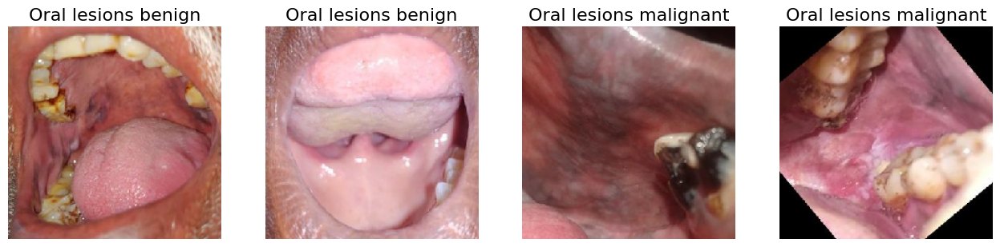

In [ ]:
def show_knee_images(image_gen):
    test_dict = test.class_indices
    classes = list(test_dict.keys())
    images, labels=next(image_gen) # get a sample batch from the generator
    plt.figure(figsize=(20,20))
    length = len(labels)
    if length<25:
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5,5,i+1)
        image=(images[i]+1)/2 #scale images between 0 and 1
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name,fontsize=16)
        plt.axis('off')
    plt.show()
show_knee_images(train)

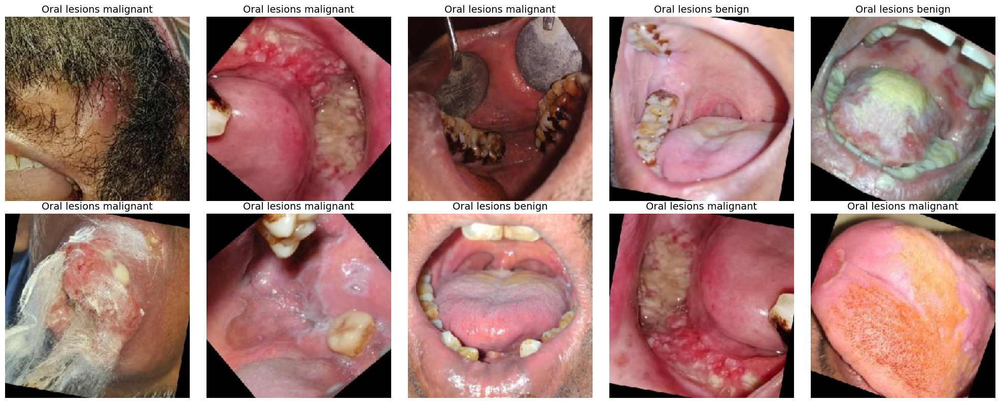

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def show_knee_images(image_gen, total_images=10):
    """
    Display `total_images` from the generator (even if batch size is smaller).
    Layout: 2 rows × 5 columns.
    """
    class_indices = image_gen.class_indices
    idx_to_class = {v: k for k, v in class_indices.items()}

    images = []
    labels = []

    # Keep fetching batches until we collect enough images
    while len(images) < total_images:
        batch_imgs, batch_labels = next(image_gen)
        images.extend(batch_imgs)
        labels.extend(batch_labels)

    # Only use the first `total_images`
    images = images[:total_images]
    labels = labels[:total_images]

    plt.figure(figsize=(20, 8))
    for i in range(total_images):
        plt.subplot(2, 5, i + 1)
        img = (images[i] + 1) / 2.0  # rescale from [-1, 1] to [0, 1]
        plt.imshow(img)
        class_name = idx_to_class[np.argmax(labels[i])]
        plt.title(class_name, fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.show()



show_knee_images(train)         # 2 × 5 grid from your training generator



Found 1816 validated image filenames belonging to 2 classes.


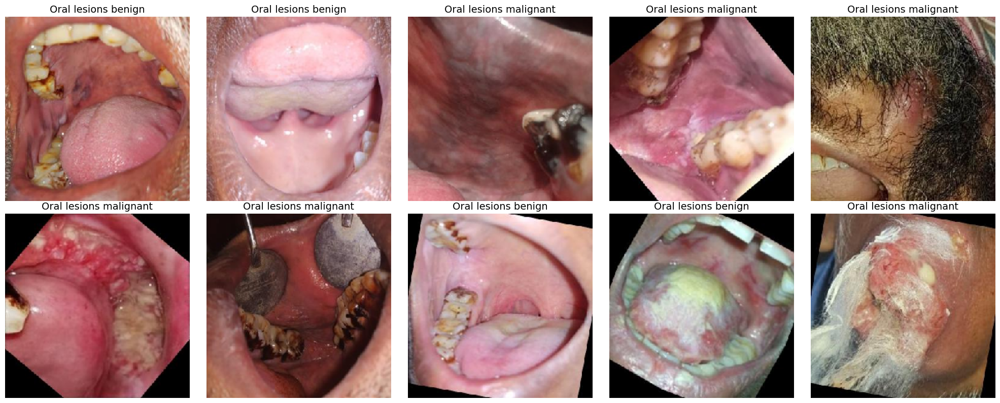

In [ ]:
train = image_gen.flow_from_dataframe(
    dataframe=train_set,
    x_col="filepaths",
    y_col="labels",
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=10,  # changed from 4 to 10
    shuffle=True,
    seed=42
)
show_knee_images(train)  # works with exactly 10 images now

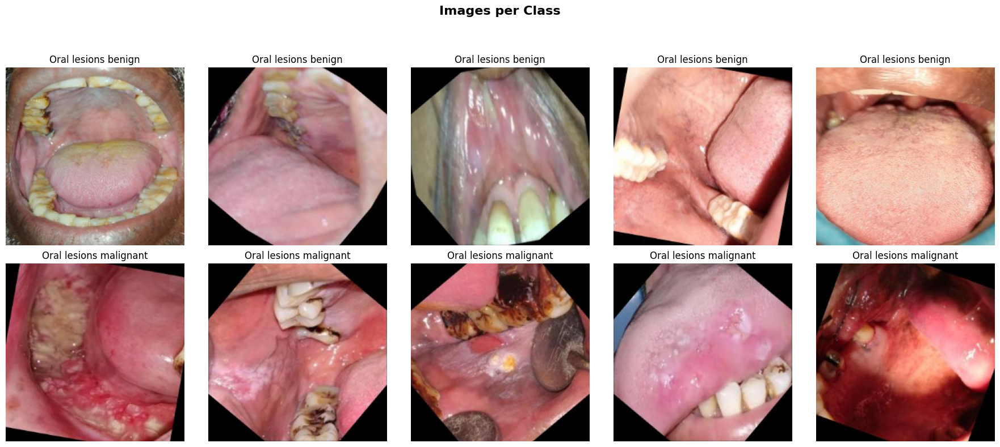

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

def show_classwise_images(df, class_names, title='Images per Class'):
    plt.figure(figsize=(18, 8))

    for row_idx, class_name in enumerate(class_names):
        # Get 5 random images from this class
        class_df = df[df['labels'] == class_name]
        # Sample up to 5 images, or all if less than 5
        num_samples = min(5, len(class_df))
        if num_samples > 0:
            sampled_df = class_df.sample(num_samples, random_state=42)
            filepaths = sampled_df['filepaths'].values
        else:
            filepaths = []


        for col_idx, filepath in enumerate(filepaths):
            img = cv2.imread(filepath)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (224, 224))  # match target size
            ax = plt.subplot(2, 5, row_idx * 5 + col_idx + 1)
            plt.imshow(img)
            plt.title(class_name, fontsize=12)
            plt.axis('off')

    plt.suptitle(title, fontsize=16, fontweight='bold')
    plt.subplots_adjust(hspace=0.5)  # <-- Adjust vertical space between rows
    plt.tight_layout(rect=[0, 0, 1, 0.93])  # Leave room for suptitle
    plt.show()

# Example usage
show_classwise_images(train_set, ['Oral lesions benign', 'Oral lesions malignant'])

In [ ]:
import numpy as np
from PIL import Image
from sklearn.preprocessing import LabelEncoder

# Define the target size
target_size = (224, 224)

# Function to load and preprocess images
def load_images_from_dataframe(dataframe, target_size):
    images = []
    labels = []
    for index, row in dataframe.iterrows():
        filepath = row['filepaths'] # Assuming 'filepaths' is the column name
        label = row['labels']
        try:
            img = Image.open(filepath).convert('RGB')
            img = img.resize(target_size)
            img_array = np.array(img)
            images.append(img_array)
            labels.append(label)
        except FileNotFoundError:
            print(f"Warning: Image file not found at {filepath}. Skipping.")
            continue
        except Exception as e:
            print(f"Warning: Could not load or process image at {filepath}: {e}. Skipping.")
            continue

    return np.array(images), np.array(labels)

# Load data for each set
print("Loading training images and labels...")
x_train, y_train = load_images_from_dataframe(train_set, target_size)

print("Loading validation images and labels...")
x_val, y_val = load_images_from_dataframe(val_set, target_size)

print("Loading test images and labels...")
x_test, y_test = load_images_from_dataframe(test_images, target_size)

# Encode string labels to integers
# Find all unique labels across all sets to ensure consistent encoding
all_labels = np.concatenate((y_train, y_val, y_test))
label_encoder = LabelEncoder()
label_encoder.fit(all_labels)

y_train_encoded = label_encoder.transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)


print("\nShapes of the loaded data:")
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_val shape:", x_val.shape)
print("y_val shape:", y_val.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

print("\nExample of encoded labels:")
print("Original y_train labels (first 5):", y_train[:5])
print("Encoded y_train labels (first 5):", y_train_encoded[:5])
print("Classes and their encoded values:", dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))))

Loading training images and labels...
Loading validation images and labels...
Loading test images and labels...

Shapes of the loaded data:
x_train shape: (1816, 224, 224, 3)
y_train shape: (1816,)
x_val shape: (454, 224, 224, 3)
y_val shape: (454,)
x_test shape: (681, 224, 224, 3)
y_test shape: (681,)

Example of encoded labels:
Original y_train labels (first 5): ['Oral lesions malignant' 'Oral lesions malignant' 'Oral lesions benign'
 'Oral lesions benign' 'Oral lesions malignant']
Encoded y_train labels (first 5): [1 1 0 0 1]
Classes and their encoded values: {np.str_('Oral lesions benign'): np.int64(0), np.str_('Oral lesions malignant'): np.int64(1)}


In [ ]:
import kagglehub
import os
import pandas as pd

# Download the dataset
path = kagglehub.dataset_download('mohamedgobara/oral-lesions-malignancy-detection-dataset')
print('Data source import complete.')

# Define the dataset root
dataset_root = path

# Define the directories for benign and malignant images
benign_dirs = [os.path.join(dataset_root, 'Oral Images Dataset', 'augmented_data', 'augmented_benign')]
malignant_dirs = [os.path.join(dataset_root, 'Oral Images Dataset', 'augmented_data', 'augmented_malignant')]

# Check if the directories exist
for dir_path in benign_dirs + malignant_dirs:
    if not os.path.exists(dir_path):
        raise FileNotFoundError(f"Directory not found: {dir_path}")

# Initialize lists for filepaths and labels
filepaths = []
labels = []

# Define the class labels as provided
class_labels = ['oral lesions benign', 'oral lesions malignant']

# Collect filepaths and labels
dict_lists = [benign_dirs, malignant_dirs]
for i, dir_list in enumerate(dict_lists):
    for j in dir_list:
        flist = os.listdir(j)
        for f in flist:
            if f.lower().endswith(('.png', '.jpg', '.jpeg')):
                fpath = os.path.join(j, f)
                filepaths.append(fpath)
                labels.append(class_labels[i])

# Create Pandas Series for filepaths and labels
Fseries = pd.Series(filepaths, name="filepaths")
Lseries = pd.Series(labels, name="labels")

# Concatenate into a DataFrame
oral_df = pd.concat([Fseries, Lseries], axis=1)

# Print the head and value counts
print(oral_df.head())
print(oral_df["labels"].value_counts())

Using Colab cache for faster access to the 'oral-lesions-malignancy-detection-dataset' dataset.
Data source import complete.
                                           filepaths               labels
0  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
1  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
2  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
3  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
4  /kaggle/input/oral-lesions-malignancy-detectio...  oral lesions benign
labels
oral lesions benign       1155
oral lesions malignant    1115
Name: count, dtype: int64


#Different color Cofusion matrices (Oral Cancer)

In [ ]:
import os
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.metrics import (accuracy_score, balanced_accuracy_score,
                             precision_score, recall_score, f1_score,
                             confusion_matrix, classification_report,
                             cohen_kappa_score, matthews_corrcoef, log_loss,
                             roc_curve, roc_auc_score, precision_recall_curve,
                             average_precision_score, brier_score_loss)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingLR
import albumentations as A
from albumentations.pytorch import ToTensorV2
import timm
import kagglehub
from tqdm import tqdm

# Download the dataset
try:
    # Attempt to download the dataset from KaggleHub
    path = kagglehub.dataset_download('mohamedgobara/oral-lesions-malignancy-detection-dataset')
    print('Data source import complete.')
except Exception as e:
    # Fallback to a placeholder path if download fails (e.g., Kaggle environment not available)
    print(f"Could not download dataset. Using a placeholder path. Error: {e}")
    path = './oral-lesions-malignancy-detection-dataset'  # Placeholder for local runs

# ------------------------------------------------------------------
# 0‒ CONFIG & GLOBALS
# ------------------------------------------------------------------
SEED = 42 # Seed for reproducibility
EPOCHS = 50 # Number of training epochs
PATIENCE = 5 # Early stopping patience
BATCH = 32 # Batch size for DataLoader
LR = 5e-4 # Learning rate
IMG_SIZE = 224 # Image size for input to models
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu') # Determine compute device
print(f"Using device: {DEVICE}")

# Define dataset directory based on the downloaded path or placeholder
DATASET_DIR = os.path.join(path, 'Oral Images Dataset', 'augmented_data')
if not os.path.isdir(DATASET_DIR):
    os.makedirs(os.path.join(DATASET_DIR, 'Oral lesions benign'), exist_ok=True)
    os.makedirs(os.path.join(DATASET_DIR, 'Oral lesions malignant'), exist_ok=True)

SAVE_DIR = '/content/gdrive/MyDrive/Orallessions'
RESULTS_DIR = os.path.join(SAVE_DIR, 'results')
os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)

CLASSES = ['Oral lesions benign', 'Oral lesions malignant']
N_CLASSES = len(CLASSES)
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
TTA_STEPS = 5
LABEL_SMOOTHING = 0.1

# Added a list of beautiful colormaps for the confusion matrices
CMAP_LIST = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'YlGnBu', 'BuPu', 'GnBu', 'OrRd', 'PuBuGn']


# Adjacency Matrix Definitions
def get_clinical_adjacency_matrix(n_classes):
    """
    Define a simple clinically informed adjacency matrix as a placeholder for binary classification.
    Returns:
        torch.Tensor: Normalized adjacency matrix with weighted edges.
    """
    adj = torch.eye(n_classes)
    # Simple, non-zero correlation between benign and malignant
    adj[0,1] = adj[1,0] = 0.1
    adj = adj / (adj.sum(1).unsqueeze(1) + 1e-9)
    return adj

class LearnableAdjacency(nn.Module):
    """
    Learnable adjacency matrix for GCN, initialized with clinical priors.
    """
    def __init__(self, n_classes, init_adj=None):
        super().__init__()
        if init_adj is None:
            init_adj = torch.eye(n_classes) + 0.1  # Small positive initial connections
        self.adj = nn.Parameter(init_adj.clone(), requires_grad=True)

    def forward(self):
        # Ensure non-negative weights and normalize
        adj = F.relu(self.adj)
        adj = (adj + adj.t()) / 2  # Ensure symmetry
        adj = adj / (adj.sum(1).unsqueeze(1) + 1e-9)
        return adj

# Initialize adjacency matrix (using clinical as a simple fallback)
adj = get_clinical_adjacency_matrix(N_CLASSES)
learnable_adj = False

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# ------------------------------------------------------------------
# 1‒ TRANSFORMS
# ------------------------------------------------------------------
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=20, p=0.7),
    A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1, p=0.5),
    A.CoarseDropout(max_holes=8, max_height=16, max_width=16, fill_value=0, p=0.5),
    A.CLAHE(p=0.3),
    A.ElasticTransform(alpha=1, sigma=50, p=0.3),
    A.Normalize(MEAN, STD),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(MEAN, STD),
    ToTensorV2(),
])

tta_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    A.Normalize(MEAN, STD),
    ToTensorV2(),
])

# ------------------------------------------------------------------
# 2‒ DATASET
# ------------------------------------------------------------------
class MedicalDataset(Dataset):
    def __init__(self, samples, transform=None, is_tta=False):
        self.samples = samples
        self.transform = transform
        self.is_tta = is_tta

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = np.array(Image.open(path).convert('RGB'))
        if self.is_tta:
            images = [self.transform(image=img)['image'] for _ in range(TTA_STEPS)]
            return torch.stack(images), F.one_hot(torch.tensor(label), N_CLASSES).float()
        if self.transform:
            img = self.transform(image=img)['image']
        return img, F.one_hot(torch.tensor(label), N_CLASSES).float()

# ------------------------------------------------------------------
# 3‒ MODEL ARCHITECTURE
# ------------------------------------------------------------------
class SEBlock(nn.Module):
    def __init__(self, c, r=16):
        super().__init__()
        self.squeeze = nn.AdaptiveAvgPool2d(1)
        self.excitation = nn.Sequential(
            nn.Linear(c, c // r, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(c // r, c, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        bs, c, _, _ = x.shape
        y = self.squeeze(x).view(bs, c)
        y = self.excitation(y).view(bs, c, 1, 1)
        return x * y.expand_as(x)

class CustomModel(nn.Module):
    def __init__(self, model_name='densenet121', pretrained=True, adj=None, use_se=True, use_gcn=True, use_multi_task=True, learnable_adj=False):
        super().__init__()
        self.model = timm.create_model(
            model_name,
            pretrained=pretrained,
            num_classes=0,
            global_pool=''
        )
        with torch.no_grad():
            dummy_input = torch.randn(2, 3, IMG_SIZE, IMG_SIZE)
            self.n_features = self.model(dummy_input).shape[1]
        self.use_se = use_se
        self.attention = SEBlock(self.n_features) if use_se else nn.Identity()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.use_multi_task = use_multi_task
        if use_multi_task:
            self.heads = nn.ModuleList([
                nn.Sequential(
                    nn.Linear(self.n_features, 512),
                    nn.BatchNorm1d(512),
                    nn.ReLU(inplace=True),
                    nn.Dropout(0.6),
                    nn.Linear(512, 1)
                ) for _ in range(N_CLASSES)
            ])
        else:
            self.classifier = nn.Sequential(
                nn.Linear(self.n_features, 512),
                nn.BatchNorm1d(512),
                nn.ReLU(inplace=True),
                nn.Dropout(0.6),
                nn.Linear(512, N_CLASSES)
            )
        self.use_gcn = use_gcn
        self.learnable_adj = learnable_adj
        if use_gcn:
            if learnable_adj:
                self.adj = LearnableAdjacency(N_CLASSES, init_adj=adj)
            else:
                self.adj = adj if adj is not None else torch.eye(N_CLASSES)

    def forward(self, x):
        features = self.model(x)
        features = self.attention(features)
        pooled = self.pool(features)
        flattened = torch.flatten(pooled, 1)
        if self.use_multi_task:
            heads_out = [head(flattened) for head in self.heads]
            logits = torch.cat(heads_out, dim=1)
        else:
            logits = self.classifier(flattened)
        if self.use_gcn:
            adj_matrix = self.adj() if self.learnable_adj else self.adj.to(logits.device)
            gcn_out = F.relu(torch.matmul(adj_matrix, logits.t())).t()
            logits = logits + gcn_out
        return logits

    def extract_features(self, x):
        features = self.model(x)
        features = self.attention(features)
        pooled = self.pool(features)
        return torch.flatten(pooled, 1)

# ------------------------------------------------------------------
# 4‒ LOSS FUNCTION
# ------------------------------------------------------------------
class FocalLoss(nn.Module):
    def __init__(self, alpha=.25, gamma=2, label_smoothing=0.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.smoothing = label_smoothing

    def forward(self, logits, targets):
        if self.smoothing > 0:
            targets = targets * (1 - self.smoothing) + self.smoothing / N_CLASSES
        bce_loss = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        pt = torch.exp(-bce_loss)
        loss = self.alpha * (1 - pt) ** self.gamma * bce_loss
        return loss.mean()

# ------------------------------------------------------------------
# 5‒ HELPER FUNCTIONS
# ------------------------------------------------------------------
def save_latex_to_file(content, filename):
    """Saves a string to a .tex file in the RESULTS_DIR."""
    path = os.path.join(RESULTS_DIR, filename)
    try:
        with open(path, 'w') as f:
            f.write(content)
        print(f"Successfully saved LaTeX file to: {path}")
    except Exception as e:
        print(f"Error saving LaTeX file to {path}: {e}")

def validate_epoch(model, loader, criterion, device, desc="Validation"):
    model.eval()
    loss_sum, correct, total = 0., 0, 0
    true_labels_list, predicted_labels_list, probabilities_list = [], [], []
    val_criterion = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)
    with torch.no_grad():
        for x, y in tqdm(loader, desc=desc):
            x, y = x.to(device), y.to(device)
            out = model(x)
            loss = val_criterion(out, y)
            loss_sum += loss.item() * x.size(0)
            prob = F.softmax(out, 1)
            pred = prob.argmax(1)
            correct += (pred == y.argmax(1)).sum().item()
            total += x.size(0)
            true_labels_list.append(y.cpu())
            predicted_labels_list.append(pred.cpu())
            probabilities_list.append(prob.cpu())
    avg_loss = loss_sum / total
    accuracy = correct / total
    true_labels_np = torch.cat(true_labels_list).numpy()
    predicted_labels_np = torch.cat(predicted_labels_list).numpy()
    probabilities_np = torch.cat(probabilities_list).numpy()
    return avg_loss, accuracy, np.argmax(true_labels_np, axis=1), predicted_labels_np, probabilities_np

@torch.no_grad()
def validate_tta(model, loader, criterion, device):
    model.eval()
    loss_sum, correct, total = 0., 0, 0
    true_labels_list, predicted_labels_list, probabilities_list = [], [], []
    val_criterion = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)
    for x_tta, y in tqdm(loader, desc="TTA Validation"):
        y = y.to(device)
        batch_size, n_tta, c, h, w = x_tta.shape
        x_tta = x_tta.view(-1, c, h, w).to(device)
        out = model(x_tta)
        prob_tta = F.softmax(out, 1).view(batch_size, n_tta, -1).mean(1)
        pred = prob_tta.argmax(1)
        avg_logits = torch.log(prob_tta.clamp(min=1e-9))
        loss = val_criterion(avg_logits, y)
        loss_sum += loss.item() * batch_size
        correct += (pred == y.argmax(1)).sum().item()
        total += batch_size
        true_labels_list.append(y.cpu())
        predicted_labels_list.append(pred.cpu())
        probabilities_list.append(prob_tta.cpu())
    avg_loss = loss_sum / total
    accuracy = correct / total
    true_labels_np = torch.cat(true_labels_list).numpy()
    predicted_labels_np = torch.cat(predicted_labels_list).numpy()
    probabilities_np = torch.cat(probabilities_list).numpy()
    return avg_loss, accuracy, np.argmax(true_labels_np, axis=1), predicted_labels_np, probabilities_np

def train_model(model, name, train_loader, val_loader, criterion, device):
    optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
    scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)
    scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))
    best_val_loss = float('inf')
    patience_counter = 0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
    print(f"\n=== Starting training for {name} for {EPOCHS} epochs ===")
    train_start_time = time.time()
    for epoch in range(1, EPOCHS + 1):
        model.train()
        running_loss = 0.0
        running_correct = 0
        total_samples = 0
        for x, y in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS} (Train)"):
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad(set_to_none=True)
            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                out = model(x)
                loss = criterion(out, y)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            running_loss += loss.item() * x.size(0)
            pred = F.softmax(out, 1).argmax(1)
            running_correct += (pred == y.argmax(1)).sum().item()
            total_samples += x.size(0)
        train_epoch_loss = running_loss / total_samples
        train_epoch_acc = running_correct / total_samples
        val_loss, val_acc, _, _, _ = validate_epoch(model, val_loader, criterion, device, desc=f"Epoch {epoch}/{EPOCHS} (Val)")
        history['train_loss'].append(train_epoch_loss)
        history['train_acc'].append(train_epoch_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        print(f"[{name}] Ep{epoch:02d} | Train Loss: {train_epoch_loss:.4f} Acc: {train_epoch_acc:.2%} | "
              f"Val Loss: {val_loss:.4f} Acc: {val_acc:.2%}")
        scheduler.step()
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            save_path = os.path.join(SAVE_DIR, f'best_model_{name}.pth')
            torch.save(model.state_dict(), save_path)
            print(f"   -> Model saved to {save_path}")
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print(f"   -> Early stopping triggered for {name} after {epoch} epochs.")
                break
    train_end_time = time.time()
    total_training_time = train_end_time - train_start_time
    epochs_completed = len(history['train_loss'])
    avg_runtime_per_epoch = total_training_time / epochs_completed if epochs_completed > 0 else 0
    return history, avg_runtime_per_epoch

def compute_macro_specificity(cm: np.ndarray) -> float:
    n_classes = cm.shape[0]
    total_samples = cm.sum()
    specificities = []
    for i in range(n_classes):
        true_positives = cm[i, i]
        false_positives = cm[:, i].sum() - true_positives
        false_negatives = cm[i, :].sum() - true_positives
        true_negatives = total_samples - (true_positives + false_positives + false_negatives)
        denominator = true_negatives + false_positives
        specificity_i = true_negatives / denominator if denominator > 0 else 0.0
        specificities.append(specificity_i)
    return float(np.mean(specificities))

def plot_roc(y_true, y_prob, title_prefix=""):
    plt.figure(figsize=(8, 6))
    sns.set_style("whitegrid")
    if N_CLASSES == 2:
        fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])
        roc_auc = roc_auc_score(y_true, y_prob[:, 1])
        plt.plot(fpr, tpr, label=f'{CLASSES[1]} (AUC = {roc_auc:.2f})', color='blue')
        plt.plot([0, 1], [0, 1], 'k--', label='Chance Line')
    else:
        y_true_binarized = label_binarize(y_true, classes=np.arange(N_CLASSES))
        colors = sns.color_palette("husl", N_CLASSES)
        for i in range(N_CLASSES):
            fpr, tpr, _ = roc_curve(y_true_binarized[:, i], y_prob[:, i])
            roc_auc = roc_auc_score(y_true_binarized[:, i], y_prob[:, i])
            plt.plot(fpr, tpr, label=f'{CLASSES[i]} (AUC = {roc_auc:.2f})', color=colors[i])
        macro_auc = roc_auc_score(y_true_binarized, y_prob, multi_class="ovo", average="macro")
        plt.plot([0, 1], [0, 1], 'k--', label=f'Macro AUC = {macro_auc:.2f}')
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title(f'{title_prefix} ROC Curve', fontsize=14)
    plt.legend(loc='lower right', fontsize=10)
    plt.grid(alpha=0.3)
    plt.savefig(os.path.join(RESULTS_DIR, f'{title_prefix.lower().replace(" ", "_")}_roc.png'), dpi=300, bbox_inches='tight')
    plt.close()

def plot_prc(y_true, y_prob, title_prefix=""):
    plt.figure(figsize=(8, 6))
    sns.set_style("whitegrid")
    colors = sns.color_palette("husl", N_CLASSES)
    if N_CLASSES == 2:
        precision, recall, _ = precision_recall_curve(y_true, y_prob[:, 1])
        ap = average_precision_score(y_true, y_prob[:, 1])
        plt.plot(recall, precision, label=f'{CLASSES[1]} (AP = {ap:.2f})', color='blue')
    else:
        for i in range(N_CLASSES):
            precision, recall, _ = precision_recall_curve(y_true == i, y_prob[:, i])
            ap = average_precision_score(y_true == i, y_prob[:, i])
            plt.plot(recall, precision, label=f'{CLASSES[i]} (AP = {ap:.2f})', color=colors[i])
    plt.xlabel('Recall', fontsize=12)
    plt.ylabel('Precision', fontsize=12)
    plt.title(f'{title_prefix} Precision-Recall Curve', fontsize=14)
    plt.legend(loc='lower left', fontsize=10)
    plt.grid(alpha=0.3)
    plt.savefig(os.path.join(RESULTS_DIR, f'{title_prefix.lower().replace(" ", "_")}_prc.png'), dpi=300, bbox_inches='tight')
    plt.close()

def plot_cm(y_true, y_pred, model_name="", cmap='Blues'):
    """
    Plots a confusion matrix with a customizable color map.
    """
    cm = confusion_matrix(y_true, y_pred)
    misclassified_count = cm.sum() - np.diag(cm).sum()
    plt.figure(figsize=(8, 6))
    sns.set_style("whitegrid")
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=CLASSES, yticklabels=CLASSES,
                annot_kws={"size": 10}, cbar_kws={'label': 'Count'})
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title(f'Confusion Matrix: {model_name}\n({misclassified_count} misclassified)', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)
    plt.savefig(os.path.join(RESULTS_DIR, f'{model_name.lower().replace(" ", "_")}_cm.png'), dpi=300, bbox_inches='tight')
    plt.close()

def get_target_layer(model_instance, model_name):
    model_backbone = model_instance.model
    if 'densenet' in model_name:
        return model_backbone.features.denseblock4.denselayer16.conv2
    elif 'efficientnet' in model_name:
        return model_backbone.conv_head
    elif 'resnet' in model_name:
        return model_backbone.layer4[-1]
    elif 'inception' in model_name:
        return model_backbone.Mixed_7c
    try:
        for module in reversed(list(model_backbone.modules())):
            if isinstance(module, nn.Conv2d):
                return module
    except Exception as e:
        print(f"Error finding target layer for {model_name}: {e}")
    return None

def compute_gradcam(model, target_layer, input_tensor, class_idx, model_name):
    if target_layer is None:
        return np.zeros((IMG_SIZE, IMG_SIZE))
    model.eval()
    feature_maps = []
    gradients = []
    def forward_hook(module, input, output):
        feature_maps.append(output.detach())
    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())
    hook_fwd = target_layer.register_forward_hook(forward_hook)
    hook_bwd = target_layer.register_full_backward_hook(backward_hook)
    output = model(input_tensor)
    score = output[:, class_idx].sum()
    model.zero_grad()
    score.backward(retain_graph=True)
    hook_fwd.remove()
    hook_bwd.remove()
    if not feature_maps or not gradients:
        return np.zeros((IMG_SIZE, IMG_SIZE))
    activations = feature_maps[0]
    grads = gradients[0]
    weights = grads.mean(dim=[2, 3], keepdim=True)
    cam = (weights * activations).sum(dim=1, keepdim=True).relu()
    cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
    cam = cam.squeeze().cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-9)
    return cam

def denormalize(img_tensor):
    mean = torch.tensor(MEAN).view(3, 1, 1).to(img_tensor.device)
    std = torch.tensor(STD).view(3, 1, 1).to(img_tensor.device)
    if img_tensor.dim() == 4:
        img_tensor = img_tensor.squeeze(0)
    img = img_tensor.cpu() * std.cpu() + mean.cpu()
    return img.permute(1, 2, 0).clamp(0, 1).numpy()

def plot_misclassified_images(dataset, true_labels, predicted_labels, probabilities, classes, num_cols=5):
    idxs = np.where(true_labels != predicted_labels)[0]
    if len(idxs) == 0:
        print("No misclassified images to display.")
        return
    display_idxs = idxs[:min(10, len(idxs))]
    rows = (len(display_idxs) + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 3 * rows))
    sns.set_style("whitegrid")
    axes = plt.subplots(rows, num_cols, figsize=(15, 3 * rows))[1].flatten()
    for i, idx in enumerate(display_idxs):
        img_tensor, true_lbl_onehot = dataset[idx]
        true_lbl = torch.argmax(true_lbl_onehot).item()
        ax = axes[i]
        ax.imshow(denormalize(img_tensor))
        ax.axis('off')
        pred_lbl = predicted_labels[idx]
        confidence = probabilities[idx, pred_lbl]
        ax.set_title(f"True: {classes[true_lbl]}\nPred: {classes[pred_lbl]} ({confidence:.2f})", fontsize=9)
    for j in range(i + 1, len(axes)):
        plt.delaxes(axes[j])
    plt.suptitle("Misclassified Samples (Backbone-Diverse Ensemble)", fontsize=14, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(os.path.join(RESULTS_DIR, 'misclassified_samples.png'), dpi=300, bbox_inches='tight')
    plt.close()

def plot_correctly_classified_images(dataset, true_labels, predicted_labels, probabilities, classes, n_display=10, num_cols=5):
    idxs = np.where(true_labels == predicted_labels)[0]
    if len(idxs) == 0:
        print("No correctly classified images to display.")
        return
    n_to_plot = min(n_display, len(idxs))
    sampled_idxs = random.sample(list(idxs), n_to_plot)
    rows = (n_to_plot + num_cols - 1) // num_cols
    plt.figure(figsize=(15, 3 * rows))
    sns.set_style("whitegrid")
    axes = plt.subplots(rows, num_cols, figsize=(15, 3 * rows))[1].flatten()
    for i, idx in enumerate(sampled_idxs):
        img_tensor, true_lbl_onehot = dataset[idx]
        true_lbl = torch.argmax(true_lbl_onehot).item()
        ax = axes[i]
        ax.imshow(denormalize(img_tensor))
        ax.axis('off')
        confidence = probabilities[idx, true_lbl]
        ax.set_title(f"True/Pred: {classes[true_lbl]} ({confidence:.2f})", fontsize=9)
    for j in range(i + 1, len(axes)):
        plt.delaxes(axes[j])
    plt.suptitle("Correctly Classified Samples (Backbone-Diverse Ensemble)", fontsize=14, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(os.path.join(RESULTS_DIR, 'correctly_classified_samples.png'), dpi=300, bbox_inches='tight')
    plt.close()

@torch.no_grad()
def extract_features(model, loader, device):
    model.eval()
    all_features, all_labels = [], []
    batch_count = 0
    try:
        for x, y in tqdm(loader, desc="Extracting Features"):
            x = x.to(device)
            features = model.extract_features(x)
            features = features.cpu().numpy()
            all_features.append(features)
            all_labels.append(y.argmax(1).cpu().numpy())
            batch_count += 1
    except Exception as e:
        print(f"Error during feature extraction: {e}")
    if not all_features:
        print(f"Warning: No features extracted. Processed {batch_count} batches. Check if data loader is empty or images are accessible.")
        return None, None
    print(f"Extracted features from {batch_count} batches.")
    return np.concatenate(all_features, axis=0), np.concatenate(all_labels, axis=0)

def plot_sample_images(dataset, title, n_per_class=5):
    samples_to_plot = []
    for class_idx in range(len(CLASSES)):
        class_samples = [s for s in dataset.samples if s[1] == class_idx]
        if not class_samples: continue
        samples_to_plot.extend(random.sample(class_samples, min(n_per_class, len(class_samples))))

    if not samples_to_plot:
        print(f"No samples found for '{title}'.")
        return

    num_cols = min(5, n_per_class * N_CLASSES)
    rows = (len(samples_to_plot) + num_cols - 1) // num_cols
    fig, axes = plt.subplots(rows, num_cols, figsize=(num_cols * 3, rows * 3.5))
    if len(samples_to_plot) == 1:
        axes = np.array([axes])
    axes = axes.flatten()
    fig.suptitle(title, fontsize=16)

    for i, (path, lbl) in enumerate(samples_to_plot):
        ax = axes[i]
        try:
            img = np.array(Image.open(path).convert('RGB'))
            ax.imshow(img)
            ax.set_title(f"Class: {CLASSES[lbl]}", fontsize=10)
        except Exception as e:
            ax.set_title(f"Error loading {os.path.basename(path)}", fontsize=8)
            print(f"Could not load image {path}: {e}")
        ax.axis('off')

    for j in range(len(samples_to_plot), len(axes)):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(os.path.join(RESULTS_DIR, f'{title.lower().replace(" ", "_")}.png'), dpi=300, bbox_inches='tight')
    plt.close()


def plot_test_metrics(results, ensemble_results, dataset_name, save_path=None):
    # Define metrics and their display names
    metrics = [
        'Accuracy', 'Balanced Acc', 'Precision', 'Recall', 'F1-Score',
        'Specificity', "Cohen's Kappa", 'MCC', 'AUC','Log Loss', 'Brier Score',
    ]
    metric_names = [
        'Accuracy', 'Balanced Accuracy', 'Precision', 'Recall', 'F1-Score',
        'Specificity', "Cohen's Kappa", 'MCC', 'AUC','Log Loss', 'Brier Score',
    ]
    model_names = list(results.keys()) + ['Backbone Diverse Ensemble']
    all_results = {**results, 'Backbone Diverse Ensemble': ensemble_results}
    plt.figure(figsize=(16, 8))
    sns.set_style("whitegrid")
    bar_width = 0.075
    x = np.arange(len(model_names))
    colors = sns.color_palette("husl", len(metrics))
    max_value = 1.0
    for metric in metrics:
        values = [all_results[model][metric] for model in model_names if all_results[model][metric] != 'N/A']
        if metric in ['Log Loss', 'Test Loss']:
            if values:
                max_value = max(max_value, max(values) * 1.1)
        else:
            max_value = max(max_value, 1.1)
    for i, metric in enumerate(metrics):
        values = [all_results[model][metric] for model in model_names]
        numeric_values = [v for v in values if v != 'N/A']
        if not numeric_values: continue
        plt.bar(x + i * bar_width, numeric_values, width=bar_width, color=colors[i], label=metric_names[i])

    plt.xlabel('Model', fontsize=12)
    plt.ylabel('Score', fontsize=12)
    plt.title(f'{dataset_name} - Test Metrics Comparison', fontsize=16)
    plt.xticks(x + bar_width * (len(metrics) / 2 - 0.5), model_names, rotation=45, ha="right", fontsize=10)
    plt.ylim(0, max_value)
    plt.legend(fontsize=10, loc='upper left', bbox_to_anchor=(1, 1))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved test metrics plot to {save_path}")
    plt.close()

# ------------------------------------------------------------------
# 6‒ MAIN EXECUTION SCRIPT
# ------------------------------------------------------------------
def main():
    # --- 1. Data Setup ---
    all_samples = []
    # Collect all image paths and their corresponding labels
    for lbl, cls in enumerate(sorted(os.listdir(DATASET_DIR))):
        cls_path = os.path.join(DATASET_DIR, cls)
        if not os.path.isdir(cls_path): continue
        files = [os.path.join(cls_path, f) for f in os.listdir(cls_path)
                 if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        all_samples.extend([(f, lbl) for f in files])

    if not all_samples:
        print("Halting execution due to missing data. Ensure DATASET_DIR is correct.")
        return

    # Shuffle all samples for proper splitting
    rng = np.random.RandomState(SEED)
    rng.shuffle(all_samples)
    paths, labels = zip(*all_samples)

    # Split data into training, validation, and test sets with stratification
    X_tr, X_tmp, y_tr, y_tmp = train_test_split(
        paths, labels, test_size=0.3, stratify=labels, random_state=SEED)
    X_va, X_te, y_va, y_te = train_test_split(
        X_tmp, y_tmp, test_size=0.5, stratify=y_tmp, random_state=SEED)

    # Convert split data back to list of tuples for Dataset creation
    tr_list = [(p, l) for p, l in zip(X_tr, y_tr)]
    va_list = [(p, l) for p, l in zip(X_va, y_va)]
    te_list = [(p, l) for p, l in zip(X_te, y_te)]

    train_dataset = MedicalDataset(tr_list, transform=train_transform)
    val_dataset = MedicalDataset(va_list, transform=val_transform)
    test_dataset_tta = MedicalDataset(te_list, transform=tta_transform, is_tta=True)
    test_dataset = MedicalDataset(te_list, transform=val_transform)
    eval_train_dataset = MedicalDataset(tr_list, transform=val_transform)

    print(f"\n--- Debug Dataset Sizes ---")
    print(f"Train dataset samples: {len(train_dataset.samples)}")
    print(f"Validation dataset samples: {len(val_dataset.samples)}")
    print(f"Test dataset samples: {len(test_dataset.samples)}")
    print(f"Test TTA dataset samples: {len(test_dataset_tta.samples)}")
    print(f"Eval train dataset samples: {len(eval_train_dataset.samples)}")

    if not train_dataset.samples or not val_dataset.samples or not test_dataset.samples:
        print("Halting execution: One or more datasets are empty.")
        return

    train_loader = DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=0, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)
    test_loader_tta = DataLoader(test_dataset_tta, batch_size=BATCH//2, shuffle=False, num_workers=0, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)
    eval_train_loader = DataLoader(eval_train_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)

    print(f"\n--- Dataset Statistics ---")
    print(f"Classes: {CLASSES}")
    print(f"Training samples: {len(train_dataset)}")
    print(f"Validation samples: {len(val_dataset)}")
    print(f"Testing samples: {len(test_dataset)}")
    print("-" * 25)

    plot_sample_images(train_dataset, "Sample Training Images")

     # --- Model Training ---
    criterion = FocalLoss(label_smoothing=LABEL_SMOOTHING)
    model_configs = [
        #DenseNet121
        {'name': 'densenet121', 'backbone': 'densenet121', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'densenet121_no_se', 'backbone': 'densenet121', 'use_se': False, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'densenet121_no_gcn', 'backbone': 'densenet121', 'use_se': True, 'use_gcn': False, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'densenet121_no_mt', 'backbone': 'densenet121', 'use_se': True, 'use_gcn': True, 'use_multi_task': False, 'learnable_adj': learnable_adj},
        # EfficientNetV2
        {'name': 'tf_efficientnetv2_s', 'backbone': 'tf_efficientnetv2_s.in21k', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'tf_efficientnetv2_s_no_se', 'backbone': 'tf_efficientnetv2_s.in21k', 'use_se': False, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'tf_efficientnetv2_s_no_gcn', 'backbone': 'tf_efficientnetv2_s.in21k', 'use_se': True, 'use_gcn': False, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'tf_efficientnetv2_s_no_mt', 'backbone': 'tf_efficientnetv2_s.in21k', 'use_se': True, 'use_gcn': True, 'use_multi_task': False, 'learnable_adj': learnable_adj},
        # ResNet50
        {'name': 'resnet50', 'backbone': 'resnet50', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'resnet50_no_se', 'backbone': 'resnet50', 'use_se': False, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'resnet50_no_gcn', 'backbone': 'resnet50', 'use_se': True, 'use_gcn': False, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'resnet50_no_mt', 'backbone': 'resnet50', 'use_se': True, 'use_gcn': True, 'use_multi_task': False, 'learnable_adj': learnable_adj},
        # InceptionV3
        {'name': 'inception_v3', 'backbone': 'inception_v3', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'inception_v3_no_se', 'backbone': 'inception_v3', 'use_se': False, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'inception_v3_no_gcn', 'backbone': 'inception_v3', 'use_se': True, 'use_gcn': False, 'use_multi_task': True, 'learnable_adj': learnable_adj},
        {'name': 'inception_v3_no_mt', 'backbone': 'inception_v3', 'use_se': True, 'use_gcn': True, 'use_multi_task': False, 'learnable_adj': learnable_adj},
        # Additional config for learnable adjacency
        {'name': 'densenet121_learnable_adj', 'backbone': 'densenet121', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': True},
        {'name': 'tf_efficientnetv2_s_learnable_adj', 'backbone': 'tf_efficientnetv2_s', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': True},
        {'name': 'resnet50_learnable_adj', 'backbone': 'resnet50', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': True},
        {'name': 'inception_v3_learnable_adj', 'backbone': 'inception_v3', 'use_se': True, 'use_gcn': True, 'use_multi_task': True, 'learnable_adj': True},
    ]


    histories = {}
    runtimes = {}
    for config in model_configs:
        model = CustomModel(model_name=config['backbone'], pretrained=True, adj=adj,
                            use_se=config['use_se'], use_gcn=config['use_gcn'],
                            use_multi_task=config['use_multi_task'], learnable_adj=config['learnable_adj']).to(DEVICE)
        history, avg_runtime = train_model(model, config['name'], train_loader, val_loader, criterion, DEVICE)
        histories[config['name']] = history
        runtimes[config['name']] = avg_runtime

    # --- Plotting Training Curves ---
    print("\n=== Plotting Model Training Curves ===")
    for model_name, history in histories.items():
        if not history['train_loss']:
            print(f"No history data for {model_name}.")
            continue
        epochs_ran = len(history['train_loss'])
        x_axis = np.arange(1, epochs_ran + 1)
        plt.figure(figsize=(12, 5))
        sns.set_style("whitegrid")
        plt.subplot(1, 2, 1)
        plt.plot(x_axis, history['train_loss'], 'o-', label='Train Loss', color='blue')
        plt.plot(x_axis, history['val_loss'], 'o-', label='Val Loss', color='orange')
        plt.xlabel('Epoch', fontsize=12)
        plt.ylabel('Loss', fontsize=12)
        plt.title('Loss', fontsize=12)
        plt.legend(fontsize=10)
        plt.grid(True, alpha=0.3)
        plt.subplot(1, 2, 2)
        plt.plot(x_axis, [acc * 100 for acc in history['train_acc']], 'o-', label='Train Acc', color='blue')
        plt.plot(x_axis, [acc * 100 for acc in history['val_acc']], 'o-', label='Val Acc', color='orange')
        plt.xlabel('Epoch', fontsize=12)
        plt.ylabel('Accuracy (%)', fontsize=12)
        plt.title('Accuracy', fontsize=12)
        plt.legend(fontsize=10)
        plt.grid(True, alpha=0.3)
        plt.suptitle(f'Training History: {model_name}', fontsize=14)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.savefig(os.path.join(RESULTS_DIR, f'{model_name}_training_curves.png'), dpi=300, bbox_inches='tight')
        plt.close()

    # --- Individual Model Evaluation & Ensemble ---
    print("\n" + "="*20 + " Evaluating Models " + "="*20)
    model_files_exist = any(os.path.exists(os.path.join(SAVE_DIR, f'best_model_{config["name"]}.pth')) for config in model_configs)
    if not model_files_exist:
        print(f"No trained model checkpoints found in '{SAVE_DIR}'.")
        return

    individual_results = {}
    all_train_probs, all_val_probs, all_test_probs = [], [], []
    train_true, val_true, test_true = None, None, None
    val_accuracies_for_weights = []
    model_results = []

    for i, config in enumerate(model_configs):
        model_name = config['name']
        model_path = os.path.join(SAVE_DIR, f'best_model_{model_name}.pth')
        if not os.path.exists(model_path):
            print(f"Skipping evaluation for {model_name}: Model checkpoint not found.")
            val_accuracies_for_weights.append(0)
            continue
        print(f"\n--- Evaluating Model: {model_name} ---")
        model = CustomModel(model_name=config['backbone'], pretrained=False, adj=adj,
                            use_se=config['use_se'], use_gcn=config['use_gcn'],
                            use_multi_task=config['use_multi_task'], learnable_adj=config['learnable_adj']).to(DEVICE)
        model.load_state_dict(torch.load(model_path, map_location=DEVICE))
        model.eval()
        _, _, train_true_temp, _, train_prob_temp = validate_epoch(model, eval_train_loader, criterion, DEVICE, desc=f"{model_name} Train Eval")
        val_loss_temp, val_acc_temp, val_true_temp, _, val_prob_temp = validate_epoch(model, val_loader, criterion, DEVICE, desc=f"{model_name} Val Eval")
        test_loss_temp, test_acc_temp, test_true_temp, test_pred_temp, test_prob_temp = validate_tta(model, test_loader_tta, criterion, DEVICE)
        if train_true is None: train_true = train_true_temp
        if val_true is None: val_true = val_true_temp
        if test_true is None: test_true = test_true_temp
        all_train_probs.append(train_prob_temp)
        all_val_probs.append(val_prob_temp)
        all_test_probs.append(test_prob_temp)
        val_accuracies_for_weights.append(val_acc_temp)
        model_results.append({
            'name': model_name,
            'backbone': config['backbone'],
            'val_acc': val_acc_temp,
            'train_prob': train_prob_temp,
            'val_prob': val_prob_temp,
            'test_prob': test_prob_temp,
            'test_pred': test_pred_temp,
            'config': config
        })
        print(f"   -> Test Accuracy (TTA): {test_acc_temp:.2%}")
        y_test_true_idx = test_true_temp

        # Select a cmap from the list and pass it to the plot function
        cmap_choice = CMAP_LIST[i % len(CMAP_LIST)]
        plot_cm(y_test_true_idx, test_pred_temp, model_name, cmap=cmap_choice)

        cm_individual = confusion_matrix(y_test_true_idx, test_pred_temp)
        auc_ind = roc_auc_score(y_test_true_idx, test_prob_temp[:, 1]) if N_CLASSES == 2 else 'N/A'
        brier_ind = np.mean([brier_score_loss((y_test_true_idx == i).astype(int), test_prob_temp[:, i]) for i in range(N_CLASSES)])
        mcc_ind = matthews_corrcoef(y_test_true_idx, test_pred_temp)
        logloss_ind = log_loss(y_test_true_idx, test_prob_temp)
        individual_results[model_name] = {
            'Test Loss': float(test_loss_temp),
            'Accuracy': accuracy_score(y_test_true_idx, test_pred_temp),
            'Balanced Acc': balanced_accuracy_score(y_test_true_idx, test_pred_temp),
            'Precision': precision_score(y_test_true_idx, test_pred_temp, average='weighted'),
            'Recall': recall_score(y_test_true_idx, test_pred_temp, average='weighted'),
            'F1-Score': f1_score(y_test_true_idx, test_pred_temp, average='weighted'),
            'Specificity': compute_macro_specificity(cm_individual),
            "Cohen's Kappa": cohen_kappa_score(y_test_true_idx, test_pred_temp),
            "MCC": mcc_ind,
            "Log Loss": logloss_ind,
            "Brier Score": brier_ind,
            "AUC": auc_ind
        }

    print("\n=== Ablation Study Results ===")
    print("Ablation studies for SE, GCN, multi-task learning, and learnable adjacency conducted across all backbones to evaluate component contributions.")

    if not all_test_probs:
        print("No model outputs collected for ensemble.")
        return
    print("\n" + "="*20 + " Weighted Ensemble Evaluation (Top Configuration per Backbone) " + "="*20)

    backbone_groups = {}
    for result in model_results:
        backbone = result['backbone']
        if backbone not in backbone_groups:
            backbone_groups[backbone] = []
        backbone_groups[backbone].append(result)

    selected_models = []
    for backbone, results in backbone_groups.items():
        if results:
            best_model = max(results, key=lambda x: x['val_acc'])
            selected_models.append(best_model)
            print(f"Selected {best_model['name']} for backbone {backbone} with Val Acc = {best_model['val_acc']:.2%}")

    if selected_models:
        print(f"\nSelected {len(selected_models)} configurations (one per backbone):")
        for model in selected_models:
            print(f"   - {model['name']} ({model['backbone']}): Val Acc = {model['val_acc']:.2%}")
        selected_configs = [model['config'] for model in selected_models]
        selected_train_probs = [model['train_prob'] for model in selected_models]
        selected_val_probs = [model['val_prob'] for model in selected_models]
        selected_test_probs = [model['test_prob'] for model in selected_models]
        selected_weights = [model['val_acc'] for model in selected_models]
        total_val_acc = sum(selected_weights)
        if total_val_acc == 0:
            print("Warning: Sum of validation accuracies for selected configurations is zero. Using equal weights.")
            model_weights = [1.0 / len(selected_models)] * len(selected_models)
        else:
            model_weights = [acc / total_val_acc for acc in selected_weights]
    else:
        print("Warning: No valid configurations available for ensemble. Skipping ensemble evaluation.")
        return

    print("\nModel Weights for Ensemble:")
    for config, weight in zip(selected_configs, model_weights):
        print(f"   - {config['name']}: {weight:.4f}")

    def evaluate_ensemble(probs_list, y_true_ens, weights_ens):
        avg_probs_ens = np.average(np.array(probs_list), axis=0, weights=weights_ens)
        normalized_probs_ens = avg_probs_ens / np.sum(avg_probs_ens, axis=1, keepdims=True)
        preds_ens = np.argmax(normalized_probs_ens, axis=1)
        avg_logits_ens = torch.log(torch.tensor(normalized_probs_ens, dtype=torch.float32, device=DEVICE).clamp(min=1e-9))
        labels_ens = F.one_hot(torch.from_numpy(y_true_ens), N_CLASSES).float().to(DEVICE)
        val_criterion_ens = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)
        with torch.no_grad():
            loss_ens = val_criterion_ens(avg_logits_ens, labels_ens).item()
        acc_ens = accuracy_score(y_true_ens, preds_ens)
        return loss_ens, acc_ens, normalized_probs_ens, preds_ens

    ens_train_loss, ens_train_acc, _, _ = evaluate_ensemble(selected_train_probs, train_true, model_weights)
    ens_val_loss, ens_val_acc, _, _ = evaluate_ensemble(selected_val_probs, val_true, model_weights)
    ens_test_loss, ens_test_acc, ens_test_probs, ens_test_preds = evaluate_ensemble(selected_test_probs, test_true, model_weights)

    test_true_idx = test_true
    balanced_acc_ens = balanced_accuracy_score(test_true_idx, ens_test_preds)
    precision_val_ens = precision_score(test_true_idx, ens_test_preds, average='weighted')
    recall_val_ens = recall_score(test_true_idx, ens_test_preds, average='weighted')
    f1_val_ens = f1_score(test_true_idx, ens_test_preds, average='weighted')
    kappa_ens = cohen_kappa_score(test_true_idx, ens_test_preds)
    mcc_ens = matthews_corrcoef(test_true_idx, ens_test_preds)
    logloss_val_ens = log_loss(test_true_idx, ens_test_probs)
    cm_ensemble_final = confusion_matrix(test_true_idx, ens_test_preds)
    specificity_ens = compute_macro_specificity(cm_ensemble_final)
    brier_score_val_ens = np.mean([brier_score_loss((test_true_idx == i).astype(int), ens_test_probs[:, i]) for i in range(N_CLASSES)])
    auc_val_ens = roc_auc_score(test_true_idx, ens_test_probs[:, 1]) if N_CLASSES == 2 else 'N/A'
    fn_ensemble = cm_ensemble_final.sum(axis=1) - np.diag(cm_ensemble_final)
    tp_ensemble = np.diag(cm_ensemble_final)
    fnr_ensemble = np.array([fn_ensemble[i] / (fn_ensemble[i] + tp_ensemble[i]) if (fn_ensemble[i] + tp_ensemble[i]) > 0 else 0.0 for i in range(N_CLASSES)])

    print("\n=== Final Ensemble Evaluation Results (Backbone-Diverse Ensemble) ===")
    print(f"Accuracy: {ens_test_acc:.4f}")
    print(f"Balanced Accuracy: {balanced_acc_ens:.4f}")
    print(f"Precision: {precision_val_ens:.4f}")
    print(f"Recall: {recall_val_ens:.4f}")
    print(f"F1-Score: {f1_val_ens:.4f}")
    print(f"Specificity: {specificity_ens:.4f}")
    print(f"Cohen's Kappa: {kappa_ens:.4f}")
    print(f"MCC: {mcc_ens:.4f}")
    print(f"Log Loss: {logloss_val_ens:.4f}")
    print(f"Brier Score: {brier_score_val_ens:.4f}")
    print(f"AUC: {auc_val_ens:.4f}")
    print("\nFalse-Negative Rate per Class:")
    for i, cls_name in enumerate(CLASSES):
        print(f"{cls_name}: {fnr_ensemble[i]:.4f}")
    print("\nClassification Report:")
    print(classification_report(test_true_idx, ens_test_preds, target_names=CLASSES, digits=4))

    plot_roc(test_true_idx, ens_test_probs, title_prefix="Backbone_Diverse_Ensemble")
    plot_prc(test_true_idx, ens_test_probs, title_prefix="Backbone_Diverse_Ensemble")
    plot_cm(test_true_idx, ens_test_preds, "Backbone Diverse Ensemble", cmap='Greens')

    # --- Generate and Save Ensemble Report and LaTeX Tables ---
    # Build the summary string for the ensemble report
    ensemble_summary_content = "==================== Weighted Ensemble Evaluation (Top Configuration per Backbone) ====================\n"
    for model in selected_models:
        ensemble_summary_content += f"Selected {model['name']} for backbone {model['backbone']} with Val Acc = {model['val_acc']:.2%}\n"
    ensemble_summary_content += f"\nSelected {len(selected_models)} configurations (one per backbone):\n"
    for model in selected_models:
        ensemble_summary_content += f"   - {model['name']} ({model['backbone']}): Val Acc = {model['val_acc']:.2%}\n"
    ensemble_summary_content += "\nModel Weights for Ensemble:\n"
    for config, weight in zip(selected_configs, model_weights):
        ensemble_summary_content += f"   - {config['name']}: {weight:.4f}\n"
    ensemble_summary_content += "\n=== Final Ensemble Evaluation Results (Backbone-Diverse Ensemble) ===\n"
    ensemble_summary_content += f"Accuracy: {ens_test_acc:.4f}\n"
    ensemble_summary_content += f"Balanced Accuracy: {balanced_acc_ens:.4f}\n"
    ensemble_summary_content += f"Precision: {precision_val_ens:.4f}\n"
    ensemble_summary_content += f"Recall: {recall_val_ens:.4f}\n"
    ensemble_summary_content += f"F1-Score: {f1_val_ens:.4f}\n"
    ensemble_summary_content += f"Specificity: {specificity_ens:.4f}\n"
    ensemble_summary_content += f"Cohen's Kappa: {kappa_ens:.4f}\n"
    ensemble_summary_content += f"MCC: {mcc_ens:.4f}\n"
    ensemble_summary_content += f"Log Loss: {logloss_val_ens:.4f}\n"
    ensemble_summary_content += f"Brier Score: {brier_score_val_ens:.4f}\n"
    ensemble_summary_content += f"AUC: {auc_val_ens:.4f}\n"
    ensemble_summary_content += "\nFalse-Negative Rate per Class:\n"
    for i, cls_name in enumerate(CLASSES):
        ensemble_summary_content += f"{cls_name}: {fnr_ensemble[i]:.4f}\n"
    ensemble_summary_content += "\nClassification Report:\n"
    ensemble_summary_content += classification_report(test_true_idx, ens_test_preds, target_names=CLASSES, digits=4)

    # Wrap the summary in a compilable LaTeX document
    latex_summary_doc = (
        "\\documentclass{article}\n"
        "\\usepackage[utf8]{inputenc}\n"
        "\\usepackage{geometry}\n"
        "\\geometry{a4paper, margin=1in}\n"
        "\\begin{document}\n"
        "\\section*{Ensemble Evaluation Summary}\n"
        "\\begin{verbatim}\n"
        f"{ensemble_summary_content}"
        "\\end{verbatim}\n"
        "\\end{document}\n"
    )
    save_latex_to_file(latex_summary_doc, 'ensemble_summary_report_oral_cancer.tex')


    # --- LaTeX Tables ---
    df_results = pd.DataFrame.from_dict(individual_results, orient='index').reset_index().rename(columns={'index':'Model'})
    ensemble_results_entry = {
        'Model': '**Backbone Diverse Ensemble**',
        'Test Loss': ens_test_loss,
        'Accuracy': ens_test_acc,
        'Balanced Acc': balanced_acc_ens,
        'Precision': precision_val_ens,
        'Recall': recall_val_ens,
        'F1-Score': f1_val_ens,
        'Specificity': specificity_ens,
        "Cohen's Kappa": kappa_ens,
        "MCC": mcc_ens,
        "Log Loss": logloss_val_ens,
        'Brier Score': brier_score_val_ens,
        'AUC': auc_val_ens
    }
    ensemble_results_df = pd.DataFrame([ensemble_results_entry])
    df_results = pd.concat([df_results, ensemble_results_df], ignore_index=True)
    for col in ['Accuracy', 'Balanced Acc', 'Precision', 'Recall', 'F1-Score', 'Specificity']:
        if df_results[col].dtype == 'object':
            continue
        df_results[col] = df_results[col] * 100
    results_col_order = [
        'Model', 'Test Loss', 'Accuracy', 'Balanced Acc', 'Precision', 'Recall',
        'F1-Score', 'Specificity', "Cohen's Kappa", "MCC", "Log Loss", 'Brier Score', 'AUC'
    ]
    df_results = df_results[results_col_order]

    # Generate and save the performance table
    test_performance_latex = df_results.to_latex(index=False,
                              caption="Test set performance metrics (with TTA) across all models and backbone-diverse ensemble for Oral Cancer.",
                              label="tab:model_performance_oral_cancer",
                              float_format="%.2f",
                              column_format="|l|r|rrrrrrrrrr|")
    print("\n\n=== LaTeX Table: Test Performance ===")
    print(test_performance_latex)
    save_latex_to_file(test_performance_latex, 'test_performance_table_oral_cancer.tex')


    training_summary_results = {}
    for config in model_configs:
        model_name = config['name']
        history = histories.get(model_name, {})
        if not history['train_loss']: continue
        training_summary_results[model_name] = {
            'Train Loss': history['train_loss'][-1],
            'Val Loss': history['val_loss'][-1],
            'Train Acc': history['train_acc'][-1] * 100,
            'Val Acc': history['val_acc'][-1] * 100,
            'Avg Runtime (s)': runtimes.get(model_name, 0)
        }
    df_summary = pd.DataFrame.from_dict(training_summary_results, orient='index').reset_index().rename(columns={'index':'Model'})
    ensemble_summary_entry = {
        'Model': '**Backbone Diverse Ensemble**',
        'Train Loss': ens_train_loss,
        'Val Loss': ens_val_loss,
        'Train Acc': ens_train_acc * 100,
        'Val Acc': ens_val_acc * 100,
        'Avg Runtime (s)': 'N/A'
    }
    ensemble_summary_df = pd.DataFrame([ensemble_summary_entry])
    df_summary = pd.concat([df_summary, ensemble_summary_df], ignore_index=True)

    # Generate and save the training summary table
    training_summary_latex = df_summary.to_latex(index=False,
                              caption="Training and validation performance with runtime for Oral Cancer.",
                              label="tab:training_summary_oral_cancer",
                              float_format="%.2f",
                              column_format="|l|rr|rr|r|")
    print("\n\n=== LaTeX Table: Training Summary ===")
    print(training_summary_latex)
    save_latex_to_file(training_summary_latex, 'training_summary_table_oral_cancer.tex')


    # --- Plot final test metrics ---
    ensemble_results_for_plot = ensemble_results_entry.copy()
    if 'Model' in ensemble_results_for_plot:
        del ensemble_results_for_plot['Model']
    plot_test_metrics(
        individual_results,
        ensemble_results_for_plot,
        "Oral Lesions Malignancy Dataset",
        save_path=os.path.join(RESULTS_DIR, 'test_metrics_comparison_oral_cancer.png')
    )

    # --- t-SNE Visualization ---
    print("\nGenerating t-SNE Visualization...")
    tsne_features_list = []
    tsne_labels = None
    current_ensemble_models_for_tsne = []
    for config in model_configs:
        model_path = os.path.join(SAVE_DIR, f'best_model_{config["name"]}.pth')
        if os.path.exists(model_path):
            model_instance = CustomModel(model_name=config['backbone'], pretrained=False, adj=adj,
                                         use_se=config['use_se'], use_gcn=config['use_gcn'],
                                         use_multi_task=config['use_multi_task'], learnable_adj=config['learnable_adj']).to(DEVICE)
            model_instance.load_state_dict(torch.load(model_path, map_location=DEVICE))
            model_instance.eval()
            current_ensemble_models_for_tsne.append({'name': config['name'], 'model': model_instance})
    if current_ensemble_models_for_tsne:
        for model_info in current_ensemble_models_for_tsne:
            model_instance = model_info['model']
            feats, lbls = extract_features(model_instance, test_loader, DEVICE)
            if feats is None or lbls is None:
                print(f"Skipping t-SNE for {model_info['name']}: No features extracted.")
                continue
            tsne_features_list.append(feats)
            if tsne_labels is None:
                tsne_labels = lbls
        if not tsne_features_list:
            print("Skipping t-SNE: No features collected from any model.")
        else:
            ensemble_features_concat = np.concatenate(tsne_features_list, axis=1)
            perplexity_val = min(30, len(ensemble_features_concat) - 1)
            if perplexity_val <= 1:
                print("Not enough samples for t-SNE.")
            else:
                tsne_results = TSNE(n_components=2, random_state=SEED, perplexity=perplexity_val).fit_transform(ensemble_features_concat)
                plt.figure(figsize=(8, 6))
                sns.set_style("whitegrid")
                sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=[CLASSES[l] for l in tsne_labels],
                                palette='husl', s=50, alpha=0.8)
                plt.title('t-SNE of Ensemble Test Features', fontsize=14)
                plt.xlabel('t-SNE Component 1', fontsize=12)
                plt.ylabel('t-SNE Component 2', fontsize=12)
                plt.legend(title='Class', fontsize=10)
                plt.grid(alpha=0.3)
                plt.savefig(os.path.join(RESULTS_DIR, 'tsne_visualization_oral_cancer.png'), dpi=300, bbox_inches='tight')
                plt.close()
    else:
        print("Skipping t-SNE: No models loaded.")

    # --- Grad-CAM Visualization ---
    print("\n" + "="*20 + " Grad-CAM Visualization (Ensemble) " + "="*20)
    current_ensemble_models_for_gradcam = []
    for config in model_configs:
        model_path = os.path.join(SAVE_DIR, f'best_model_{config["name"]}.pth')
        if os.path.exists(model_path):
            model_instance = CustomModel(model_name=config['backbone'], pretrained=False, adj=adj,
                                         use_se=config['use_se'], use_gcn=config['use_gcn'],
                                         use_multi_task=config['use_multi_task'], learnable_adj=config['learnable_adj']).to(DEVICE)
            model_instance.load_state_dict(torch.load(model_path, map_location=DEVICE))
            model_instance.eval()
            current_ensemble_models_for_gradcam.append({'name': config['name'], 'model': model_instance})
    if not current_ensemble_models_for_gradcam:
        print("No models loaded for Grad-CAM.")
    else:
        test_true_idx = test_true
        mis_idx_ens = np.where(test_true_idx != ens_test_preds)[0].tolist()
        cor_idx_ens = np.where(test_true_idx == ens_test_preds)[0].tolist()
        random.shuffle(mis_idx_ens)
        random.shuffle(cor_idx_ens)
        mis_idx_display = mis_idx_ens[:min(5, len(mis_idx_ens))]
        cor_idx_display = cor_idx_ens[:min(5, len(cor_idx_ens))]
        def gradcam_panel_ensemble(indices_to_plot, title_prefix, models_info, avg_probs_ens, preds_ens):
            if not indices_to_plot:
                print(f"No samples to plot for {title_prefix}")
                return
            rows = (len(indices_to_plot) + 4) // 5
            plt.figure(figsize=(15, 3.5 * rows))
            sns.set_style("whitegrid")
            axes = plt.subplots(rows, 5, figsize=(15, 3.5 * rows))[1].flatten()
            plt.suptitle(f"{title_prefix} (Backbone-Diverse Ensemble Grad-CAM)", fontsize=14, y=1.02)
            for i, idx in enumerate(indices_to_plot):
                ax = axes[i]
                img_tensor, true_lbl_onehot = test_dataset[idx]
                true_lbl = torch.argmax(true_lbl_onehot).item()
                input_tensor_for_gradcam = img_tensor.unsqueeze(0).to(DEVICE)
                pred_label_idx = preds_ens[idx]
                confidence = avg_probs_ens[idx, pred_label_idx]
                heatmaps_from_models = []
                for model_info in models_info:
                    model_instance = model_info['model']
                    model_name = model_info['name']
                    target_layer = get_target_layer(model_instance, model_name)
                    if target_layer:
                        heatmap = compute_gradcam(model_instance, target_layer, input_tensor_for_gradcam, pred_label_idx, model_name)
                        heatmaps_from_models.append(heatmap)
                ax.imshow(denormalize(img_tensor))
                if heatmaps_from_models:
                    ensemble_heatmap_avg = np.mean(heatmaps_from_models, axis=0)
                    ax.imshow(ensemble_heatmap_avg, cmap='jet', alpha=0.4, extent=(0, IMG_SIZE, IMG_SIZE, 0))
                    ax.set_title(f"True: {CLASSES[true_lbl]}\nPred: {CLASSES[pred_label_idx]} ({confidence:.2f})", fontsize=9)
                else:
                    ax.set_title(f"True: {CLASSES[true_lbl]}\nPred: {CLASSES[pred_label_idx]}\n(CAM FAILED)", fontsize=9)
                ax.axis('off')
            for j in range(len(indices_to_plot), len(axes)):
                plt.delaxes(axes[j])
            plt.tight_layout(rect=[0, 0, 1, 0.98], h_pad=3)
            plt.savefig(os.path.join(RESULTS_DIR, f'{title_prefix.lower().replace(" ", "_")}_oral_cancer.png'), dpi=300, bbox_inches='tight')
            plt.close()
        gradcam_panel_ensemble(mis_idx_display, "Grad-CAM on Misclassified Samples", current_ensemble_models_for_gradcam, ens_test_probs, ens_test_preds)
        gradcam_panel_ensemble(cor_idx_display, "Grad-CAM on Correctly Classified Samples", current_ensemble_models_for_gradcam, ens_test_probs, ens_test_preds)

    # --- Final Visualizations ---
    print("\n" + "="*20 + " Visualizing Samples (Backbone-Diverse Ensemble) " + "="*20)
    plot_misclassified_images(test_dataset, test_true_idx, ens_test_preds, ens_test_probs, CLASSES)
    plot_correctly_classified_images(test_dataset, test_true_idx, ens_test_preds, ens_test_probs, CLASSES, n_display=5)


if __name__ == "__main__":
    main()



Using Colab cache for faster access to the 'oral-lesions-malignancy-detection-dataset' dataset.
Data source import complete.
Using device: cuda

--- Debug Dataset Sizes ---
Train dataset samples: 1589
Validation dataset samples: 340
Test dataset samples: 341
Test TTA dataset samples: 341
Eval train dataset samples: 1589

--- Dataset Statistics ---
Classes: ['Oral lesions benign', 'Oral lesions malignant']
Training samples: 1589
Validation samples: 340
Testing samples: 341
-------------------------

=== Starting training for densenet121 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.00it/s]


[densenet121] Ep01 | Train Loss: 0.0403 Acc: 81.12% | Val Loss: 0.0158 Acc: 92.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.48it/s]


[densenet121] Ep02 | Train Loss: 0.0227 Acc: 89.99% | Val Loss: 0.0218 Acc: 89.41%


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.39it/s]


[densenet121] Ep03 | Train Loss: 0.0135 Acc: 94.46% | Val Loss: 0.0152 Acc: 94.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.87it/s]


[densenet121] Ep04 | Train Loss: 0.0125 Acc: 94.40% | Val Loss: 0.0071 Acc: 97.06%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.87it/s]


[densenet121] Ep05 | Train Loss: 0.0094 Acc: 96.22% | Val Loss: 0.0053 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.10it/s]


[densenet121] Ep06 | Train Loss: 0.0064 Acc: 98.36% | Val Loss: 0.0061 Acc: 98.24%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.39it/s]


[densenet121] Ep07 | Train Loss: 0.0052 Acc: 98.62% | Val Loss: 0.0043 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[densenet121] Ep08 | Train Loss: 0.0054 Acc: 98.30% | Val Loss: 0.0063 Acc: 97.94%


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.04it/s]


[densenet121] Ep09 | Train Loss: 0.0040 Acc: 99.43% | Val Loss: 0.0049 Acc: 98.82%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.46it/s]


[densenet121] Ep10 | Train Loss: 0.0035 Acc: 99.62% | Val Loss: 0.0079 Acc: 98.53%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.88it/s]


[densenet121] Ep11 | Train Loss: 0.0037 Acc: 99.43% | Val Loss: 0.0041 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.45it/s]


[densenet121] Ep12 | Train Loss: 0.0033 Acc: 99.56% | Val Loss: 0.0050 Acc: 98.82%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.84it/s]


[densenet121] Ep13 | Train Loss: 0.0033 Acc: 99.43% | Val Loss: 0.0049 Acc: 98.82%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.13it/s]


[densenet121] Ep14 | Train Loss: 0.0036 Acc: 99.31% | Val Loss: 0.0045 Acc: 99.12%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.37it/s]


[densenet121] Ep15 | Train Loss: 0.0035 Acc: 99.43% | Val Loss: 0.0039 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.92it/s]


[densenet121] Ep16 | Train Loss: 0.0056 Acc: 98.11% | Val Loss: 0.0053 Acc: 98.53%


Epoch 17/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.11it/s]


[densenet121] Ep17 | Train Loss: 0.0038 Acc: 99.43% | Val Loss: 0.0042 Acc: 98.24%


Epoch 18/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.02it/s]


[densenet121] Ep18 | Train Loss: 0.0031 Acc: 99.69% | Val Loss: 0.0046 Acc: 98.24%


Epoch 19/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.57it/s]


[densenet121] Ep19 | Train Loss: 0.0030 Acc: 99.56% | Val Loss: 0.0050 Acc: 98.24%


Epoch 20/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.34it/s]


[densenet121] Ep20 | Train Loss: 0.0024 Acc: 100.00% | Val Loss: 0.0036 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 21/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[densenet121] Ep21 | Train Loss: 0.0027 Acc: 99.75% | Val Loss: 0.0039 Acc: 98.24%


Epoch 22/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.46it/s]


[densenet121] Ep22 | Train Loss: 0.0025 Acc: 99.81% | Val Loss: 0.0037 Acc: 99.12%


Epoch 23/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.13it/s]


[densenet121] Ep23 | Train Loss: 0.0024 Acc: 99.87% | Val Loss: 0.0034 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 24/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.29it/s]


[densenet121] Ep24 | Train Loss: 0.0028 Acc: 99.81% | Val Loss: 0.0032 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121.pth


Epoch 25/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.65it/s]


[densenet121] Ep25 | Train Loss: 0.0023 Acc: 100.00% | Val Loss: 0.0051 Acc: 98.82%


Epoch 26/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.31it/s]


[densenet121] Ep26 | Train Loss: 0.0022 Acc: 99.94% | Val Loss: 0.0048 Acc: 98.53%


Epoch 27/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.43it/s]


[densenet121] Ep27 | Train Loss: 0.0021 Acc: 100.00% | Val Loss: 0.0047 Acc: 98.53%


Epoch 28/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.36it/s]


[densenet121] Ep28 | Train Loss: 0.0021 Acc: 100.00% | Val Loss: 0.0045 Acc: 98.53%


Epoch 29/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.04it/s]


[densenet121] Ep29 | Train Loss: 0.0021 Acc: 99.94% | Val Loss: 0.0040 Acc: 98.82%
   -> Early stopping triggered for densenet121 after 29 epochs.

=== Starting training for densenet121_no_se for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.45it/s]


[densenet121_no_se] Ep01 | Train Loss: 0.0385 Acc: 80.49% | Val Loss: 0.0376 Acc: 80.00%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_se.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.26it/s]


[densenet121_no_se] Ep02 | Train Loss: 0.0210 Acc: 90.06% | Val Loss: 0.0164 Acc: 93.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_se.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.78it/s]


[densenet121_no_se] Ep03 | Train Loss: 0.0129 Acc: 94.40% | Val Loss: 0.0093 Acc: 95.59%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_se.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.77it/s]


[densenet121_no_se] Ep04 | Train Loss: 0.0137 Acc: 93.96% | Val Loss: 0.0083 Acc: 97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_se.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.27it/s]


[densenet121_no_se] Ep05 | Train Loss: 0.0085 Acc: 96.79% | Val Loss: 0.0066 Acc: 96.18%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_se.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.35it/s]


[densenet121_no_se] Ep06 | Train Loss: 0.0088 Acc: 96.85% | Val Loss: 0.0122 Acc: 96.76%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.03it/s]


[densenet121_no_se] Ep07 | Train Loss: 0.0092 Acc: 96.73% | Val Loss: 0.0082 Acc: 97.65%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.34it/s]


[densenet121_no_se] Ep08 | Train Loss: 0.0081 Acc: 96.92% | Val Loss: 0.0039 Acc: 98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_se.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.51it/s]


[densenet121_no_se] Ep09 | Train Loss: 0.0052 Acc: 98.55% | Val Loss: 0.0059 Acc: 98.82%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[densenet121_no_se] Ep10 | Train Loss: 0.0053 Acc: 98.17% | Val Loss: 0.0058 Acc: 98.82%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.42it/s]


[densenet121_no_se] Ep11 | Train Loss: 0.0037 Acc: 99.56% | Val Loss: 0.0053 Acc: 98.82%


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.27it/s]


[densenet121_no_se] Ep12 | Train Loss: 0.0054 Acc: 98.49% | Val Loss: 0.0097 Acc: 97.35%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.88it/s]


[densenet121_no_se] Ep13 | Train Loss: 0.0046 Acc: 98.99% | Val Loss: 0.0052 Acc: 98.82%
   -> Early stopping triggered for densenet121_no_se after 13 epochs.

=== Starting training for densenet121_no_gcn for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.44it/s]


[densenet121_no_gcn] Ep01 | Train Loss: 0.0291 Acc: 83.13% | Val Loss: 0.0153 Acc: 93.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_gcn.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.36it/s]


[densenet121_no_gcn] Ep02 | Train Loss: 0.0180 Acc: 91.69% | Val Loss: 0.0143 Acc: 92.06%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_gcn.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.20it/s]


[densenet121_no_gcn] Ep03 | Train Loss: 0.0116 Acc: 94.78% | Val Loss: 0.0092 Acc: 96.18%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_gcn.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.31it/s]


[densenet121_no_gcn] Ep04 | Train Loss: 0.0086 Acc: 96.79% | Val Loss: 0.0099 Acc: 96.76%


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.42it/s]


[densenet121_no_gcn] Ep05 | Train Loss: 0.0082 Acc: 96.79% | Val Loss: 0.0083 Acc: 97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_gcn.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.46it/s]


[densenet121_no_gcn] Ep06 | Train Loss: 0.0064 Acc: 97.48% | Val Loss: 0.0053 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_gcn.pth


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.33it/s]


[densenet121_no_gcn] Ep07 | Train Loss: 0.0061 Acc: 98.05% | Val Loss: 0.0030 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_gcn.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.50it/s]


[densenet121_no_gcn] Ep08 | Train Loss: 0.0058 Acc: 98.17% | Val Loss: 0.0033 Acc: 98.24%


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.37it/s]


[densenet121_no_gcn] Ep09 | Train Loss: 0.0047 Acc: 98.62% | Val Loss: 0.0018 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_gcn.pth


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.41it/s]


[densenet121_no_gcn] Ep10 | Train Loss: 0.0042 Acc: 98.87% | Val Loss: 0.0027 Acc: 97.94%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.61it/s]


[densenet121_no_gcn] Ep11 | Train Loss: 0.0043 Acc: 98.87% | Val Loss: 0.0048 Acc: 98.24%


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.23it/s]


[densenet121_no_gcn] Ep12 | Train Loss: 0.0041 Acc: 99.12% | Val Loss: 0.0035 Acc: 98.82%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.21it/s]


[densenet121_no_gcn] Ep13 | Train Loss: 0.0027 Acc: 99.81% | Val Loss: 0.0032 Acc: 98.82%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.33it/s]


[densenet121_no_gcn] Ep14 | Train Loss: 0.0031 Acc: 99.69% | Val Loss: 0.0023 Acc: 99.12%
   -> Early stopping triggered for densenet121_no_gcn after 14 epochs.

=== Starting training for densenet121_no_mt for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.42it/s]


[densenet121_no_mt] Ep01 | Train Loss: 0.0400 Acc: 81.43% | Val Loss: 0.0187 Acc: 90.59%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_mt.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.41it/s]


[densenet121_no_mt] Ep02 | Train Loss: 0.0231 Acc: 90.31% | Val Loss: 0.0266 Acc: 90.88%


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.09it/s]


[densenet121_no_mt] Ep03 | Train Loss: 0.0174 Acc: 93.20% | Val Loss: 0.0137 Acc: 92.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_mt.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.29it/s]


[densenet121_no_mt] Ep04 | Train Loss: 0.0103 Acc: 95.59% | Val Loss: 0.0072 Acc: 96.76%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_mt.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.30it/s]


[densenet121_no_mt] Ep05 | Train Loss: 0.0090 Acc: 96.73% | Val Loss: 0.0064 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_mt.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.45it/s]


[densenet121_no_mt] Ep06 | Train Loss: 0.0066 Acc: 98.24% | Val Loss: 0.0071 Acc: 98.53%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.23it/s]


[densenet121_no_mt] Ep07 | Train Loss: 0.0071 Acc: 97.48% | Val Loss: 0.0075 Acc: 97.65%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.59it/s]


[densenet121_no_mt] Ep08 | Train Loss: 0.0059 Acc: 98.49% | Val Loss: 0.0047 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_no_mt.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.28it/s]


[densenet121_no_mt] Ep09 | Train Loss: 0.0051 Acc: 98.80% | Val Loss: 0.0050 Acc: 98.24%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.17it/s]


[densenet121_no_mt] Ep10 | Train Loss: 0.0054 Acc: 98.49% | Val Loss: 0.0056 Acc: 97.94%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.26it/s]


[densenet121_no_mt] Ep11 | Train Loss: 0.0041 Acc: 98.80% | Val Loss: 0.0081 Acc: 98.24%


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.29it/s]


[densenet121_no_mt] Ep12 | Train Loss: 0.0037 Acc: 99.31% | Val Loss: 0.0061 Acc: 98.53%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.58it/s]


[densenet121_no_mt] Ep13 | Train Loss: 0.0037 Acc: 99.18% | Val Loss: 0.0069 Acc: 98.24%
   -> Early stopping triggered for densenet121_no_mt after 13 epochs.


model.safetensors:   0%|          | 0.00/193M [00:00<?, ?B/s]


=== Starting training for tf_efficientnetv2_s for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.48it/s]


[tf_efficientnetv2_s] Ep01 | Train Loss: 0.0308 Acc: 86.09% | Val Loss: 0.0100 Acc: 94.71%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.49it/s]


[tf_efficientnetv2_s] Ep02 | Train Loss: 0.0136 Acc: 94.59% | Val Loss: 0.0056 Acc: 97.06%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.39it/s]


[tf_efficientnetv2_s] Ep03 | Train Loss: 0.0075 Acc: 97.17% | Val Loss: 0.0023 Acc: 98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.42it/s]


[tf_efficientnetv2_s] Ep04 | Train Loss: 0.0084 Acc: 96.98% | Val Loss: 0.0056 Acc: 97.94%


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.47it/s]


[tf_efficientnetv2_s] Ep05 | Train Loss: 0.0063 Acc: 98.36% | Val Loss: 0.0032 Acc: 98.53%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.39it/s]


[tf_efficientnetv2_s] Ep06 | Train Loss: 0.0042 Acc: 99.12% | Val Loss: 0.0027 Acc: 98.82%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.26it/s]


[tf_efficientnetv2_s] Ep07 | Train Loss: 0.0057 Acc: 98.99% | Val Loss: 0.0046 Acc: 98.82%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.37it/s]


[tf_efficientnetv2_s] Ep08 | Train Loss: 0.0027 Acc: 99.87% | Val Loss: 0.0045 Acc: 98.82%
   -> Early stopping triggered for tf_efficientnetv2_s after 8 epochs.

=== Starting training for tf_efficientnetv2_s_no_se for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.99it/s]


[tf_efficientnetv2_s_no_se] Ep01 | Train Loss: 0.0324 Acc: 85.21% | Val Loss: 0.0172 Acc: 92.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.50it/s]


[tf_efficientnetv2_s_no_se] Ep02 | Train Loss: 0.0156 Acc: 93.90% | Val Loss: 0.0053 Acc: 97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.92it/s]


[tf_efficientnetv2_s_no_se] Ep03 | Train Loss: 0.0097 Acc: 96.73% | Val Loss: 0.0045 Acc: 97.06%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.97it/s]


[tf_efficientnetv2_s_no_se] Ep04 | Train Loss: 0.0068 Acc: 97.42% | Val Loss: 0.0023 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.18it/s]


[tf_efficientnetv2_s_no_se] Ep05 | Train Loss: 0.0045 Acc: 98.87% | Val Loss: 0.0015 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_se.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.38it/s]


[tf_efficientnetv2_s_no_se] Ep06 | Train Loss: 0.0039 Acc: 99.31% | Val Loss: 0.0023 Acc: 98.82%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.35it/s]


[tf_efficientnetv2_s_no_se] Ep07 | Train Loss: 0.0037 Acc: 99.18% | Val Loss: 0.0035 Acc: 98.53%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[tf_efficientnetv2_s_no_se] Ep08 | Train Loss: 0.0036 Acc: 99.18% | Val Loss: 0.0041 Acc: 98.53%


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.40it/s]


[tf_efficientnetv2_s_no_se] Ep09 | Train Loss: 0.0035 Acc: 99.62% | Val Loss: 0.0029 Acc: 98.82%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.21it/s]


[tf_efficientnetv2_s_no_se] Ep10 | Train Loss: 0.0025 Acc: 99.81% | Val Loss: 0.0033 Acc: 99.12%
   -> Early stopping triggered for tf_efficientnetv2_s_no_se after 10 epochs.

=== Starting training for tf_efficientnetv2_s_no_gcn for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.55it/s]


[tf_efficientnetv2_s_no_gcn] Ep01 | Train Loss: 0.0261 Acc: 86.85% | Val Loss: 0.0097 Acc: 94.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.71it/s]


[tf_efficientnetv2_s_no_gcn] Ep02 | Train Loss: 0.0095 Acc: 95.85% | Val Loss: 0.0056 Acc: 97.06%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.70it/s]


[tf_efficientnetv2_s_no_gcn] Ep03 | Train Loss: 0.0050 Acc: 98.62% | Val Loss: 0.0018 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_gcn.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.09it/s]


[tf_efficientnetv2_s_no_gcn] Ep04 | Train Loss: 0.0051 Acc: 98.74% | Val Loss: 0.0033 Acc: 98.53%


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.43it/s]


[tf_efficientnetv2_s_no_gcn] Ep05 | Train Loss: 0.0062 Acc: 97.67% | Val Loss: 0.0019 Acc: 98.82%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[tf_efficientnetv2_s_no_gcn] Ep06 | Train Loss: 0.0039 Acc: 98.99% | Val Loss: 0.0019 Acc: 98.53%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[tf_efficientnetv2_s_no_gcn] Ep07 | Train Loss: 0.0049 Acc: 98.62% | Val Loss: 0.0032 Acc: 98.24%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.36it/s]


[tf_efficientnetv2_s_no_gcn] Ep08 | Train Loss: 0.0032 Acc: 99.62% | Val Loss: 0.0030 Acc: 98.53%
   -> Early stopping triggered for tf_efficientnetv2_s_no_gcn after 8 epochs.

=== Starting training for tf_efficientnetv2_s_no_mt for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.29it/s]


[tf_efficientnetv2_s_no_mt] Ep01 | Train Loss: 0.0352 Acc: 84.14% | Val Loss: 0.0133 Acc: 94.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.46it/s]


[tf_efficientnetv2_s_no_mt] Ep02 | Train Loss: 0.0128 Acc: 94.71% | Val Loss: 0.0047 Acc: 97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.19it/s]


[tf_efficientnetv2_s_no_mt] Ep03 | Train Loss: 0.0077 Acc: 97.36% | Val Loss: 0.0024 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[tf_efficientnetv2_s_no_mt] Ep04 | Train Loss: 0.0050 Acc: 99.12% | Val Loss: 0.0040 Acc: 97.94%


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.50it/s]


[tf_efficientnetv2_s_no_mt] Ep05 | Train Loss: 0.0042 Acc: 99.18% | Val Loss: 0.0022 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.63it/s]


[tf_efficientnetv2_s_no_mt] Ep06 | Train Loss: 0.0042 Acc: 99.06% | Val Loss: 0.0036 Acc: 98.53%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.36it/s]


[tf_efficientnetv2_s_no_mt] Ep07 | Train Loss: 0.0039 Acc: 99.18% | Val Loss: 0.0032 Acc: 99.12%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.30it/s]


[tf_efficientnetv2_s_no_mt] Ep08 | Train Loss: 0.0032 Acc: 99.43% | Val Loss: 0.0019 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.39it/s]


[tf_efficientnetv2_s_no_mt] Ep09 | Train Loss: 0.0040 Acc: 99.18% | Val Loss: 0.0021 Acc: 98.82%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.39it/s]


[tf_efficientnetv2_s_no_mt] Ep10 | Train Loss: 0.0041 Acc: 99.12% | Val Loss: 0.0013 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_no_mt.pth


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.33it/s]


[tf_efficientnetv2_s_no_mt] Ep11 | Train Loss: 0.0041 Acc: 98.80% | Val Loss: 0.0032 Acc: 99.12%


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.17it/s]


[tf_efficientnetv2_s_no_mt] Ep12 | Train Loss: 0.0040 Acc: 99.12% | Val Loss: 0.0017 Acc: 99.12%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.62it/s]


[tf_efficientnetv2_s_no_mt] Ep13 | Train Loss: 0.0030 Acc: 99.69% | Val Loss: 0.0027 Acc: 98.82%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.36it/s]


[tf_efficientnetv2_s_no_mt] Ep14 | Train Loss: 0.0027 Acc: 99.75% | Val Loss: 0.0031 Acc: 98.82%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.30it/s]


[tf_efficientnetv2_s_no_mt] Ep15 | Train Loss: 0.0027 Acc: 99.69% | Val Loss: 0.0038 Acc: 98.82%
   -> Early stopping triggered for tf_efficientnetv2_s_no_mt after 15 epochs.


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]


=== Starting training for resnet50 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.60it/s]


[resnet50] Ep01 | Train Loss: 0.0479 Acc: 76.15% | Val Loss: 0.0242 Acc: 82.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.23it/s]


[resnet50] Ep02 | Train Loss: 0.0263 Acc: 87.41% | Val Loss: 0.0117 Acc: 95.29%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.22it/s]


[resnet50] Ep03 | Train Loss: 0.0171 Acc: 91.94% | Val Loss: 0.0085 Acc: 96.76%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.75it/s]


[resnet50] Ep04 | Train Loss: 0.0142 Acc: 93.46% | Val Loss: 0.0079 Acc: 96.18%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.75it/s]


[resnet50] Ep05 | Train Loss: 0.0113 Acc: 95.66% | Val Loss: 0.0068 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.70it/s]


[resnet50] Ep06 | Train Loss: 0.0096 Acc: 95.97% | Val Loss: 0.0054 Acc: 97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.89it/s]


[resnet50] Ep07 | Train Loss: 0.0095 Acc: 96.41% | Val Loss: 0.0046 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.70it/s]


[resnet50] Ep08 | Train Loss: 0.0080 Acc: 96.85% | Val Loss: 0.0046 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.60it/s]


[resnet50] Ep09 | Train Loss: 0.0067 Acc: 97.92% | Val Loss: 0.0039 Acc: 98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.48it/s]


[resnet50] Ep10 | Train Loss: 0.0051 Acc: 98.36% | Val Loss: 0.0047 Acc: 97.35%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.38it/s]


[resnet50] Ep11 | Train Loss: 0.0057 Acc: 98.30% | Val Loss: 0.0028 Acc: 99.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.53it/s]


[resnet50] Ep12 | Train Loss: 0.0049 Acc: 98.43% | Val Loss: 0.0028 Acc: 98.53%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.63it/s]


[resnet50] Ep13 | Train Loss: 0.0046 Acc: 99.06% | Val Loss: 0.0021 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50.pth


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.49it/s]


[resnet50] Ep14 | Train Loss: 0.0047 Acc: 98.55% | Val Loss: 0.0032 Acc: 97.94%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.67it/s]


[resnet50] Ep15 | Train Loss: 0.0038 Acc: 99.18% | Val Loss: 0.0024 Acc: 99.41%


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.66it/s]


[resnet50] Ep16 | Train Loss: 0.0045 Acc: 98.93% | Val Loss: 0.0029 Acc: 98.53%


Epoch 17/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.53it/s]


[resnet50] Ep17 | Train Loss: 0.0035 Acc: 99.37% | Val Loss: 0.0034 Acc: 98.53%


Epoch 18/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.74it/s]


[resnet50] Ep18 | Train Loss: 0.0041 Acc: 99.12% | Val Loss: 0.0025 Acc: 99.41%
   -> Early stopping triggered for resnet50 after 18 epochs.

=== Starting training for resnet50_no_se for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.58it/s]


[resnet50_no_se] Ep01 | Train Loss: 0.0446 Acc: 78.04% | Val Loss: 0.0230 Acc: 87.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_se.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.73it/s]


[resnet50_no_se] Ep02 | Train Loss: 0.0251 Acc: 88.11% | Val Loss: 0.0155 Acc: 92.65%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_se.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.77it/s]


[resnet50_no_se] Ep03 | Train Loss: 0.0189 Acc: 91.25% | Val Loss: 0.0151 Acc: 93.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_se.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.26it/s]


[resnet50_no_se] Ep04 | Train Loss: 0.0163 Acc: 92.70% | Val Loss: 0.0094 Acc: 95.29%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_se.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.90it/s]


[resnet50_no_se] Ep05 | Train Loss: 0.0133 Acc: 94.52% | Val Loss: 0.0099 Acc: 96.47%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.62it/s]


[resnet50_no_se] Ep06 | Train Loss: 0.0088 Acc: 96.66% | Val Loss: 0.0098 Acc: 95.88%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.66it/s]


[resnet50_no_se] Ep07 | Train Loss: 0.0090 Acc: 96.85% | Val Loss: 0.0071 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_se.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.69it/s]


[resnet50_no_se] Ep08 | Train Loss: 0.0073 Acc: 97.55% | Val Loss: 0.0036 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_se.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.63it/s]


[resnet50_no_se] Ep09 | Train Loss: 0.0060 Acc: 98.68% | Val Loss: 0.0038 Acc: 98.24%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.60it/s]


[resnet50_no_se] Ep10 | Train Loss: 0.0062 Acc: 98.24% | Val Loss: 0.0055 Acc: 98.82%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.98it/s]


[resnet50_no_se] Ep11 | Train Loss: 0.0050 Acc: 98.74% | Val Loss: 0.0030 Acc: 98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_se.pth


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.73it/s]


[resnet50_no_se] Ep12 | Train Loss: 0.0050 Acc: 98.80% | Val Loss: 0.0031 Acc: 98.24%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.66it/s]


[resnet50_no_se] Ep13 | Train Loss: 0.0045 Acc: 98.87% | Val Loss: 0.0040 Acc: 98.24%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.70it/s]


[resnet50_no_se] Ep14 | Train Loss: 0.0049 Acc: 98.80% | Val Loss: 0.0044 Acc: 97.94%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.58it/s]


[resnet50_no_se] Ep15 | Train Loss: 0.0047 Acc: 98.93% | Val Loss: 0.0059 Acc: 97.94%


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.57it/s]


[resnet50_no_se] Ep16 | Train Loss: 0.0042 Acc: 98.93% | Val Loss: 0.0045 Acc: 97.94%
   -> Early stopping triggered for resnet50_no_se after 16 epochs.

=== Starting training for resnet50_no_gcn for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.45it/s]


[resnet50_no_gcn] Ep01 | Train Loss: 0.0352 Acc: 77.97% | Val Loss: 0.0228 Acc: 90.29%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.83it/s]


[resnet50_no_gcn] Ep02 | Train Loss: 0.0213 Acc: 88.23% | Val Loss: 0.0107 Acc: 92.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.69it/s]


[resnet50_no_gcn] Ep03 | Train Loss: 0.0148 Acc: 92.64% | Val Loss: 0.0096 Acc: 96.76%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.66it/s]


[resnet50_no_gcn] Ep04 | Train Loss: 0.0123 Acc: 94.34% | Val Loss: 0.0083 Acc: 95.88%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.63it/s]


[resnet50_no_gcn] Ep05 | Train Loss: 0.0104 Acc: 95.59% | Val Loss: 0.0048 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.17it/s]


[resnet50_no_gcn] Ep06 | Train Loss: 0.0080 Acc: 97.29% | Val Loss: 0.0041 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.89it/s]


[resnet50_no_gcn] Ep07 | Train Loss: 0.0071 Acc: 97.48% | Val Loss: 0.0035 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.47it/s]


[resnet50_no_gcn] Ep08 | Train Loss: 0.0063 Acc: 97.55% | Val Loss: 0.0033 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.67it/s]


[resnet50_no_gcn] Ep09 | Train Loss: 0.0046 Acc: 98.93% | Val Loss: 0.0036 Acc: 99.12%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.54it/s]


[resnet50_no_gcn] Ep10 | Train Loss: 0.0046 Acc: 98.93% | Val Loss: 0.0033 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.66it/s]


[resnet50_no_gcn] Ep11 | Train Loss: 0.0047 Acc: 98.62% | Val Loss: 0.0028 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.64it/s]


[resnet50_no_gcn] Ep12 | Train Loss: 0.0041 Acc: 99.12% | Val Loss: 0.0025 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.64it/s]


[resnet50_no_gcn] Ep13 | Train Loss: 0.0042 Acc: 99.24% | Val Loss: 0.0029 Acc: 98.82%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.66it/s]


[resnet50_no_gcn] Ep14 | Train Loss: 0.0035 Acc: 99.37% | Val Loss: 0.0031 Acc: 99.12%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.53it/s]


[resnet50_no_gcn] Ep15 | Train Loss: 0.0040 Acc: 99.24% | Val Loss: 0.0026 Acc: 98.82%


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.54it/s]


[resnet50_no_gcn] Ep16 | Train Loss: 0.0033 Acc: 99.43% | Val Loss: 0.0036 Acc: 98.53%


Epoch 17/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.52it/s]


[resnet50_no_gcn] Ep17 | Train Loss: 0.0036 Acc: 99.12% | Val Loss: 0.0022 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 18/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.67it/s]


[resnet50_no_gcn] Ep18 | Train Loss: 0.0032 Acc: 99.62% | Val Loss: 0.0027 Acc: 98.82%


Epoch 19/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.42it/s]


[resnet50_no_gcn] Ep19 | Train Loss: 0.0033 Acc: 99.37% | Val Loss: 0.0029 Acc: 99.12%


Epoch 20/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.39it/s]


[resnet50_no_gcn] Ep20 | Train Loss: 0.0038 Acc: 99.37% | Val Loss: 0.0022 Acc: 99.12%


Epoch 21/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.70it/s]


[resnet50_no_gcn] Ep21 | Train Loss: 0.0038 Acc: 99.24% | Val Loss: 0.0017 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_gcn.pth


Epoch 22/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.42it/s]


[resnet50_no_gcn] Ep22 | Train Loss: 0.0034 Acc: 99.62% | Val Loss: 0.0032 Acc: 99.12%


Epoch 23/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.60it/s]


[resnet50_no_gcn] Ep23 | Train Loss: 0.0030 Acc: 99.75% | Val Loss: 0.0028 Acc: 98.82%


Epoch 24/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.60it/s]


[resnet50_no_gcn] Ep24 | Train Loss: 0.0030 Acc: 99.62% | Val Loss: 0.0024 Acc: 99.12%


Epoch 25/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.13it/s]


[resnet50_no_gcn] Ep25 | Train Loss: 0.0029 Acc: 99.69% | Val Loss: 0.0021 Acc: 99.12%


Epoch 26/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.72it/s]


[resnet50_no_gcn] Ep26 | Train Loss: 0.0031 Acc: 99.62% | Val Loss: 0.0021 Acc: 98.53%
   -> Early stopping triggered for resnet50_no_gcn after 26 epochs.

=== Starting training for resnet50_no_mt for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.61it/s]


[resnet50_no_mt] Ep01 | Train Loss: 0.0448 Acc: 75.83% | Val Loss: 0.0216 Acc: 91.18%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_mt.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.19it/s]


[resnet50_no_mt] Ep02 | Train Loss: 0.0265 Acc: 87.10% | Val Loss: 0.0170 Acc: 91.47%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_mt.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.79it/s]


[resnet50_no_mt] Ep03 | Train Loss: 0.0169 Acc: 92.01% | Val Loss: 0.0110 Acc: 93.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_mt.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.62it/s]


[resnet50_no_mt] Ep04 | Train Loss: 0.0142 Acc: 93.58% | Val Loss: 0.0061 Acc: 97.35%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_mt.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.68it/s]


[resnet50_no_mt] Ep05 | Train Loss: 0.0110 Acc: 95.22% | Val Loss: 0.0045 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_mt.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.65it/s]


[resnet50_no_mt] Ep06 | Train Loss: 0.0105 Acc: 95.97% | Val Loss: 0.0039 Acc: 98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_mt.pth


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.70it/s]


[resnet50_no_mt] Ep07 | Train Loss: 0.0065 Acc: 98.17% | Val Loss: 0.0028 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_no_mt.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.34it/s]


[resnet50_no_mt] Ep08 | Train Loss: 0.0063 Acc: 98.24% | Val Loss: 0.0029 Acc: 98.82%


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.51it/s]


[resnet50_no_mt] Ep09 | Train Loss: 0.0042 Acc: 99.18% | Val Loss: 0.0030 Acc: 98.82%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.57it/s]


[resnet50_no_mt] Ep10 | Train Loss: 0.0044 Acc: 99.06% | Val Loss: 0.0034 Acc: 99.12%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.03it/s]


[resnet50_no_mt] Ep11 | Train Loss: 0.0049 Acc: 98.62% | Val Loss: 0.0036 Acc: 98.82%


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.62it/s]


[resnet50_no_mt] Ep12 | Train Loss: 0.0052 Acc: 98.87% | Val Loss: 0.0035 Acc: 99.12%
   -> Early stopping triggered for resnet50_no_mt after 12 epochs.


model.safetensors:   0%|          | 0.00/95.5M [00:00<?, ?B/s]


=== Starting training for inception_v3 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.23it/s]


[inception_v3] Ep01 | Train Loss: 0.0450 Acc: 74.70% | Val Loss: 0.0179 Acc: 88.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.61it/s]


[inception_v3] Ep02 | Train Loss: 0.0187 Acc: 90.94% | Val Loss: 0.0098 Acc: 95.29%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.72it/s]


[inception_v3] Ep03 | Train Loss: 0.0139 Acc: 93.83% | Val Loss: 0.0126 Acc: 92.35%


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.64it/s]


[inception_v3] Ep04 | Train Loss: 0.0167 Acc: 93.33% | Val Loss: 0.0143 Acc: 93.24%


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.70it/s]


[inception_v3] Ep05 | Train Loss: 0.0105 Acc: 95.97% | Val Loss: 0.0248 Acc: 86.47%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.60it/s]


[inception_v3] Ep06 | Train Loss: 0.0127 Acc: 94.59% | Val Loss: 0.0102 Acc: 94.12%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.81it/s]


[inception_v3] Ep07 | Train Loss: 0.0119 Acc: 95.28% | Val Loss: 0.0145 Acc: 94.71%
   -> Early stopping triggered for inception_v3 after 7 epochs.

=== Starting training for inception_v3_no_se for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.39it/s]


[inception_v3_no_se] Ep01 | Train Loss: 0.0477 Acc: 78.29% | Val Loss: 0.0299 Acc: 89.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.99it/s]


[inception_v3_no_se] Ep02 | Train Loss: 0.0216 Acc: 89.11% | Val Loss: 0.0099 Acc: 94.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.75it/s]


[inception_v3_no_se] Ep03 | Train Loss: 0.0146 Acc: 94.02% | Val Loss: 0.0059 Acc: 97.06%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.62it/s]


[inception_v3_no_se] Ep04 | Train Loss: 0.0100 Acc: 95.66% | Val Loss: 0.0111 Acc: 93.24%


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.82it/s]


[inception_v3_no_se] Ep05 | Train Loss: 0.0112 Acc: 95.47% | Val Loss: 0.0065 Acc: 95.29%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.92it/s]


[inception_v3_no_se] Ep06 | Train Loss: 0.0083 Acc: 96.98% | Val Loss: 0.0043 Acc: 97.65%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.72it/s]


[inception_v3_no_se] Ep07 | Train Loss: 0.0079 Acc: 96.79% | Val Loss: 0.0067 Acc: 96.47%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.76it/s]


[inception_v3_no_se] Ep08 | Train Loss: 0.0082 Acc: 96.92% | Val Loss: 0.0084 Acc: 96.76%


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.94it/s]


[inception_v3_no_se] Ep09 | Train Loss: 0.0097 Acc: 96.10% | Val Loss: 0.0032 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.95it/s]


[inception_v3_no_se] Ep10 | Train Loss: 0.0067 Acc: 97.80% | Val Loss: 0.0026 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.75it/s]


[inception_v3_no_se] Ep11 | Train Loss: 0.0066 Acc: 97.61% | Val Loss: 0.0018 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.91it/s]


[inception_v3_no_se] Ep12 | Train Loss: 0.0037 Acc: 99.37% | Val Loss: 0.0013 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.99it/s]


[inception_v3_no_se] Ep13 | Train Loss: 0.0042 Acc: 99.18% | Val Loss: 0.0029 Acc: 98.82%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.97it/s]


[inception_v3_no_se] Ep14 | Train Loss: 0.0053 Acc: 98.36% | Val Loss: 0.0048 Acc: 98.82%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.71it/s]


[inception_v3_no_se] Ep15 | Train Loss: 0.0053 Acc: 98.43% | Val Loss: 0.0040 Acc: 98.82%


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.79it/s]


[inception_v3_no_se] Ep16 | Train Loss: 0.0035 Acc: 99.18% | Val Loss: 0.0013 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 17/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.73it/s]


[inception_v3_no_se] Ep17 | Train Loss: 0.0042 Acc: 99.06% | Val Loss: 0.0034 Acc: 98.82%


Epoch 18/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.95it/s]


[inception_v3_no_se] Ep18 | Train Loss: 0.0034 Acc: 99.50% | Val Loss: 0.0012 Acc: 99.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 19/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.71it/s]


[inception_v3_no_se] Ep19 | Train Loss: 0.0028 Acc: 99.81% | Val Loss: 0.0009 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_se.pth


Epoch 20/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.93it/s]


[inception_v3_no_se] Ep20 | Train Loss: 0.0032 Acc: 99.31% | Val Loss: 0.0020 Acc: 99.12%


Epoch 21/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.60it/s]


[inception_v3_no_se] Ep21 | Train Loss: 0.0039 Acc: 98.93% | Val Loss: 0.0013 Acc: 99.41%


Epoch 22/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.60it/s]


[inception_v3_no_se] Ep22 | Train Loss: 0.0035 Acc: 99.12% | Val Loss: 0.0037 Acc: 99.12%


Epoch 23/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.96it/s]


[inception_v3_no_se] Ep23 | Train Loss: 0.0033 Acc: 99.12% | Val Loss: 0.0041 Acc: 98.82%


Epoch 24/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.83it/s]


[inception_v3_no_se] Ep24 | Train Loss: 0.0040 Acc: 98.93% | Val Loss: 0.0036 Acc: 98.82%
   -> Early stopping triggered for inception_v3_no_se after 24 epochs.

=== Starting training for inception_v3_no_gcn for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.90it/s]


[inception_v3_no_gcn] Ep01 | Train Loss: 0.0363 Acc: 79.80% | Val Loss: 0.0336 Acc: 84.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_gcn.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.25it/s]


[inception_v3_no_gcn] Ep02 | Train Loss: 0.0209 Acc: 89.30% | Val Loss: 0.0080 Acc: 95.59%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_gcn.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.94it/s]


[inception_v3_no_gcn] Ep03 | Train Loss: 0.0157 Acc: 92.95% | Val Loss: 0.0088 Acc: 95.88%


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.73it/s]


[inception_v3_no_gcn] Ep04 | Train Loss: 0.0109 Acc: 95.28% | Val Loss: 0.0064 Acc: 96.47%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_gcn.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.81it/s]


[inception_v3_no_gcn] Ep05 | Train Loss: 0.0076 Acc: 97.29% | Val Loss: 0.0042 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_gcn.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.23it/s]


[inception_v3_no_gcn] Ep06 | Train Loss: 0.0103 Acc: 96.16% | Val Loss: 0.1228 Acc: 89.71%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.71it/s]


[inception_v3_no_gcn] Ep07 | Train Loss: 0.0116 Acc: 94.59% | Val Loss: 0.0089 Acc: 97.06%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.58it/s]


[inception_v3_no_gcn] Ep08 | Train Loss: 0.0080 Acc: 97.04% | Val Loss: 0.0115 Acc: 95.88%


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.86it/s]


[inception_v3_no_gcn] Ep09 | Train Loss: 0.0063 Acc: 97.86% | Val Loss: 0.0032 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_gcn.pth


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.70it/s]


[inception_v3_no_gcn] Ep10 | Train Loss: 0.0070 Acc: 97.42% | Val Loss: 0.0044 Acc: 98.24%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.75it/s]


[inception_v3_no_gcn] Ep11 | Train Loss: 0.0068 Acc: 98.11% | Val Loss: 0.0095 Acc: 94.71%


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.70it/s]


[inception_v3_no_gcn] Ep12 | Train Loss: 0.0099 Acc: 95.28% | Val Loss: 0.0059 Acc: 97.94%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.57it/s]


[inception_v3_no_gcn] Ep13 | Train Loss: 0.0070 Acc: 97.67% | Val Loss: 0.0039 Acc: 98.53%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.92it/s]


[inception_v3_no_gcn] Ep14 | Train Loss: 0.0062 Acc: 97.61% | Val Loss: 0.0027 Acc: 98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_gcn.pth


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.96it/s]


[inception_v3_no_gcn] Ep15 | Train Loss: 0.0039 Acc: 99.31% | Val Loss: 0.0016 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_gcn.pth


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.57it/s]


[inception_v3_no_gcn] Ep16 | Train Loss: 0.0036 Acc: 99.31% | Val Loss: 0.0060 Acc: 98.24%


Epoch 17/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.98it/s]


[inception_v3_no_gcn] Ep17 | Train Loss: 0.0039 Acc: 99.06% | Val Loss: 0.0033 Acc: 98.53%


Epoch 18/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.42it/s]


[inception_v3_no_gcn] Ep18 | Train Loss: 0.0045 Acc: 98.99% | Val Loss: 0.0027 Acc: 98.82%


Epoch 19/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.77it/s]


[inception_v3_no_gcn] Ep19 | Train Loss: 0.0043 Acc: 99.18% | Val Loss: 0.0021 Acc: 99.12%


Epoch 20/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.97it/s]


[inception_v3_no_gcn] Ep20 | Train Loss: 0.0030 Acc: 99.62% | Val Loss: 0.0025 Acc: 99.41%
   -> Early stopping triggered for inception_v3_no_gcn after 20 epochs.

=== Starting training for inception_v3_no_mt for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.52it/s]


[inception_v3_no_mt] Ep01 | Train Loss: 0.0408 Acc: 77.60% | Val Loss: 0.0195 Acc: 85.00%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_mt.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.76it/s]


[inception_v3_no_mt] Ep02 | Train Loss: 0.0225 Acc: 86.97% | Val Loss: 0.0100 Acc: 94.41%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_mt.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.84it/s]


[inception_v3_no_mt] Ep03 | Train Loss: 0.0138 Acc: 93.52% | Val Loss: 0.0167 Acc: 91.18%


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.93it/s]


[inception_v3_no_mt] Ep04 | Train Loss: 0.0115 Acc: 95.66% | Val Loss: 0.0077 Acc: 95.29%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_mt.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.95it/s]


[inception_v3_no_mt] Ep05 | Train Loss: 0.0081 Acc: 97.29% | Val Loss: 0.0082 Acc: 95.00%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.88it/s]


[inception_v3_no_mt] Ep06 | Train Loss: 0.0116 Acc: 95.28% | Val Loss: 0.0053 Acc: 96.47%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_mt.pth


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.47it/s]


[inception_v3_no_mt] Ep07 | Train Loss: 0.0089 Acc: 96.85% | Val Loss: 0.0031 Acc: 98.53%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_mt.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.85it/s]


[inception_v3_no_mt] Ep08 | Train Loss: 0.0061 Acc: 98.11% | Val Loss: 0.0041 Acc: 97.94%


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.59it/s]


[inception_v3_no_mt] Ep09 | Train Loss: 0.0064 Acc: 97.99% | Val Loss: 0.0025 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_mt.pth


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.57it/s]


[inception_v3_no_mt] Ep10 | Train Loss: 0.0054 Acc: 98.62% | Val Loss: 0.0037 Acc: 98.24%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.61it/s]


[inception_v3_no_mt] Ep11 | Train Loss: 0.0054 Acc: 98.62% | Val Loss: 0.0015 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_no_mt.pth


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.59it/s]


[inception_v3_no_mt] Ep12 | Train Loss: 0.0047 Acc: 98.74% | Val Loss: 0.0051 Acc: 98.53%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.63it/s]


[inception_v3_no_mt] Ep13 | Train Loss: 0.0053 Acc: 97.80% | Val Loss: 0.0038 Acc: 98.82%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.73it/s]


[inception_v3_no_mt] Ep14 | Train Loss: 0.0040 Acc: 98.87% | Val Loss: 0.0066 Acc: 97.65%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.87it/s]


[inception_v3_no_mt] Ep15 | Train Loss: 0.0064 Acc: 97.73% | Val Loss: 0.0039 Acc: 98.82%


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.71it/s]


[inception_v3_no_mt] Ep16 | Train Loss: 0.0046 Acc: 98.74% | Val Loss: 0.0036 Acc: 98.82%
   -> Early stopping triggered for inception_v3_no_mt after 16 epochs.

=== Starting training for densenet121_learnable_adj for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.26it/s]


[densenet121_learnable_adj] Ep01 | Train Loss: 0.0392 Acc: 80.30% | Val Loss: 0.0170 Acc: 91.47%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_learnable_adj.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.12it/s]


[densenet121_learnable_adj] Ep02 | Train Loss: 0.0242 Acc: 89.93% | Val Loss: 0.0172 Acc: 92.94%


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.27it/s]


[densenet121_learnable_adj] Ep03 | Train Loss: 0.0145 Acc: 93.14% | Val Loss: 0.0067 Acc: 96.18%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_learnable_adj.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.42it/s]


[densenet121_learnable_adj] Ep04 | Train Loss: 0.0114 Acc: 95.34% | Val Loss: 0.0086 Acc: 95.29%


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.57it/s]


[densenet121_learnable_adj] Ep05 | Train Loss: 0.0099 Acc: 95.53% | Val Loss: 0.0041 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_learnable_adj.pth


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.36it/s]


[densenet121_learnable_adj] Ep06 | Train Loss: 0.0073 Acc: 97.55% | Val Loss: 0.0032 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_learnable_adj.pth


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[densenet121_learnable_adj] Ep07 | Train Loss: 0.0065 Acc: 98.05% | Val Loss: 0.0028 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_learnable_adj.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[densenet121_learnable_adj] Ep08 | Train Loss: 0.0059 Acc: 97.99% | Val Loss: 0.0019 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_learnable_adj.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.37it/s]


[densenet121_learnable_adj] Ep09 | Train Loss: 0.0059 Acc: 97.73% | Val Loss: 0.0036 Acc: 98.53%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.61it/s]


[densenet121_learnable_adj] Ep10 | Train Loss: 0.0051 Acc: 98.68% | Val Loss: 0.0020 Acc: 98.24%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.26it/s]


[densenet121_learnable_adj] Ep11 | Train Loss: 0.0047 Acc: 98.87% | Val Loss: 0.0016 Acc: 99.71%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_densenet121_learnable_adj.pth


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.31it/s]


[densenet121_learnable_adj] Ep12 | Train Loss: 0.0045 Acc: 98.93% | Val Loss: 0.0025 Acc: 98.82%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.23it/s]


[densenet121_learnable_adj] Ep13 | Train Loss: 0.0032 Acc: 99.69% | Val Loss: 0.0023 Acc: 99.41%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.20it/s]


[densenet121_learnable_adj] Ep14 | Train Loss: 0.0040 Acc: 99.24% | Val Loss: 0.0021 Acc: 99.12%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:02<00:00,  5.45it/s]


[densenet121_learnable_adj] Ep15 | Train Loss: 0.0036 Acc: 99.24% | Val Loss: 0.0019 Acc: 99.12%


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.25it/s]


[densenet121_learnable_adj] Ep16 | Train Loss: 0.0031 Acc: 99.56% | Val Loss: 0.0020 Acc: 99.12%
   -> Early stopping triggered for densenet121_learnable_adj after 16 epochs.


model.safetensors:   0%|          | 0.00/86.5M [00:00<?, ?B/s]


=== Starting training for tf_efficientnetv2_s_learnable_adj for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.38it/s]


[tf_efficientnetv2_s_learnable_adj] Ep01 | Train Loss: 0.0311 Acc: 85.65% | Val Loss: 0.0105 Acc: 94.71%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.29it/s]


[tf_efficientnetv2_s_learnable_adj] Ep02 | Train Loss: 0.0123 Acc: 95.34% | Val Loss: 0.0082 Acc: 98.24%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.28it/s]


[tf_efficientnetv2_s_learnable_adj] Ep03 | Train Loss: 0.0093 Acc: 96.73% | Val Loss: 0.0055 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.38it/s]


[tf_efficientnetv2_s_learnable_adj] Ep04 | Train Loss: 0.0056 Acc: 98.36% | Val Loss: 0.0064 Acc: 98.53%


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.43it/s]


[tf_efficientnetv2_s_learnable_adj] Ep05 | Train Loss: 0.0059 Acc: 98.62% | Val Loss: 0.0062 Acc: 96.76%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[tf_efficientnetv2_s_learnable_adj] Ep06 | Train Loss: 0.0057 Acc: 98.30% | Val Loss: 0.0037 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_tf_efficientnetv2_s_learnable_adj.pth


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.28it/s]


[tf_efficientnetv2_s_learnable_adj] Ep07 | Train Loss: 0.0049 Acc: 98.43% | Val Loss: 0.0043 Acc: 98.24%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.54it/s]


[tf_efficientnetv2_s_learnable_adj] Ep08 | Train Loss: 0.0037 Acc: 99.24% | Val Loss: 0.0058 Acc: 97.94%


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.02it/s]


[tf_efficientnetv2_s_learnable_adj] Ep09 | Train Loss: 0.0027 Acc: 99.87% | Val Loss: 0.0063 Acc: 98.24%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.33it/s]


[tf_efficientnetv2_s_learnable_adj] Ep10 | Train Loss: 0.0024 Acc: 99.81% | Val Loss: 0.0045 Acc: 98.24%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.36it/s]


[tf_efficientnetv2_s_learnable_adj] Ep11 | Train Loss: 0.0031 Acc: 99.50% | Val Loss: 0.0047 Acc: 98.24%
   -> Early stopping triggered for tf_efficientnetv2_s_learnable_adj after 11 epochs.

=== Starting training for resnet50_learnable_adj for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.59it/s]


[resnet50_learnable_adj] Ep01 | Train Loss: 0.0419 Acc: 79.30% | Val Loss: 0.0238 Acc: 86.47%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_learnable_adj.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.13it/s]


[resnet50_learnable_adj] Ep02 | Train Loss: 0.0258 Acc: 87.41% | Val Loss: 0.0153 Acc: 91.76%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_learnable_adj.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.72it/s]


[resnet50_learnable_adj] Ep03 | Train Loss: 0.0177 Acc: 92.39% | Val Loss: 0.0126 Acc: 95.00%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_learnable_adj.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.54it/s]


[resnet50_learnable_adj] Ep04 | Train Loss: 0.0140 Acc: 94.15% | Val Loss: 0.0062 Acc: 97.65%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_learnable_adj.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.35it/s]


[resnet50_learnable_adj] Ep05 | Train Loss: 0.0117 Acc: 94.65% | Val Loss: 0.0065 Acc: 96.47%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[resnet50_learnable_adj] Ep06 | Train Loss: 0.0095 Acc: 96.54% | Val Loss: 0.0068 Acc: 97.06%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.17it/s]


[resnet50_learnable_adj] Ep07 | Train Loss: 0.0089 Acc: 96.22% | Val Loss: 0.0047 Acc: 96.76%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_learnable_adj.pth


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.53it/s]


[resnet50_learnable_adj] Ep08 | Train Loss: 0.0058 Acc: 98.05% | Val Loss: 0.0027 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_learnable_adj.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.51it/s]


[resnet50_learnable_adj] Ep09 | Train Loss: 0.0061 Acc: 98.43% | Val Loss: 0.0033 Acc: 97.65%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.35it/s]


[resnet50_learnable_adj] Ep10 | Train Loss: 0.0068 Acc: 98.36% | Val Loss: 0.0030 Acc: 99.12%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.66it/s]


[resnet50_learnable_adj] Ep11 | Train Loss: 0.0059 Acc: 97.99% | Val Loss: 0.0022 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_resnet50_learnable_adj.pth


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.32it/s]


[resnet50_learnable_adj] Ep12 | Train Loss: 0.0041 Acc: 99.37% | Val Loss: 0.0025 Acc: 98.24%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.72it/s]


[resnet50_learnable_adj] Ep13 | Train Loss: 0.0045 Acc: 98.74% | Val Loss: 0.0024 Acc: 99.12%


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  5.89it/s]


[resnet50_learnable_adj] Ep14 | Train Loss: 0.0041 Acc: 99.24% | Val Loss: 0.0034 Acc: 98.53%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.48it/s]


[resnet50_learnable_adj] Ep15 | Train Loss: 0.0043 Acc: 98.99% | Val Loss: 0.0038 Acc: 98.82%


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.54it/s]


[resnet50_learnable_adj] Ep16 | Train Loss: 0.0044 Acc: 98.68% | Val Loss: 0.0024 Acc: 98.82%
   -> Early stopping triggered for resnet50_learnable_adj after 16 epochs.

=== Starting training for inception_v3_learnable_adj for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.10it/s]


[inception_v3_learnable_adj] Ep01 | Train Loss: 0.0441 Acc: 76.34% | Val Loss: 0.0249 Acc: 85.59%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_learnable_adj.pth


Epoch 2/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.75it/s]


[inception_v3_learnable_adj] Ep02 | Train Loss: 0.0206 Acc: 89.80% | Val Loss: 0.0148 Acc: 92.65%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_learnable_adj.pth


Epoch 3/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.61it/s]


[inception_v3_learnable_adj] Ep03 | Train Loss: 0.0139 Acc: 93.77% | Val Loss: 0.0094 Acc: 96.18%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_learnable_adj.pth


Epoch 4/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.45it/s]


[inception_v3_learnable_adj] Ep04 | Train Loss: 0.0120 Acc: 94.52% | Val Loss: 0.0071 Acc: 96.76%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_learnable_adj.pth


Epoch 5/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.83it/s]


[inception_v3_learnable_adj] Ep05 | Train Loss: 0.0088 Acc: 96.48% | Val Loss: 0.0081 Acc: 95.59%


Epoch 6/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.15it/s]


[inception_v3_learnable_adj] Ep06 | Train Loss: 0.0090 Acc: 96.92% | Val Loss: 0.0274 Acc: 85.00%


Epoch 7/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.54it/s]


[inception_v3_learnable_adj] Ep07 | Train Loss: 0.0202 Acc: 90.81% | Val Loss: 0.0082 Acc: 94.71%


Epoch 8/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.84it/s]


[inception_v3_learnable_adj] Ep08 | Train Loss: 0.0143 Acc: 93.14% | Val Loss: 0.0036 Acc: 97.94%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_learnable_adj.pth


Epoch 9/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.75it/s]


[inception_v3_learnable_adj] Ep09 | Train Loss: 0.0109 Acc: 95.09% | Val Loss: 0.0057 Acc: 96.47%


Epoch 10/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.75it/s]


[inception_v3_learnable_adj] Ep10 | Train Loss: 0.0075 Acc: 96.73% | Val Loss: 0.0039 Acc: 98.82%


Epoch 11/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.69it/s]


[inception_v3_learnable_adj] Ep11 | Train Loss: 0.0059 Acc: 98.55% | Val Loss: 0.0043 Acc: 97.06%


Epoch 12/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.72it/s]


[inception_v3_learnable_adj] Ep12 | Train Loss: 0.0054 Acc: 98.55% | Val Loss: 0.0037 Acc: 98.24%


Epoch 13/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.73it/s]


[inception_v3_learnable_adj] Ep13 | Train Loss: 0.0058 Acc: 98.17% | Val Loss: 0.0024 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_learnable_adj.pth


Epoch 14/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.69it/s]


[inception_v3_learnable_adj] Ep14 | Train Loss: 0.0057 Acc: 98.24% | Val Loss: 0.0059 Acc: 97.35%


Epoch 15/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.01it/s]


[inception_v3_learnable_adj] Ep15 | Train Loss: 0.0047 Acc: 98.74% | Val Loss: 0.0018 Acc: 98.82%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_learnable_adj.pth


Epoch 16/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.43it/s]


[inception_v3_learnable_adj] Ep16 | Train Loss: 0.0030 Acc: 99.69% | Val Loss: 0.0074 Acc: 96.76%


Epoch 17/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.67it/s]


[inception_v3_learnable_adj] Ep17 | Train Loss: 0.0040 Acc: 98.68% | Val Loss: 0.0020 Acc: 99.12%


Epoch 18/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.79it/s]


[inception_v3_learnable_adj] Ep18 | Train Loss: 0.0039 Acc: 98.99% | Val Loss: 0.0020 Acc: 98.82%


Epoch 19/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.84it/s]


[inception_v3_learnable_adj] Ep19 | Train Loss: 0.0037 Acc: 99.37% | Val Loss: 0.0030 Acc: 98.53%


Epoch 20/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.63it/s]


[inception_v3_learnable_adj] Ep20 | Train Loss: 0.0024 Acc: 99.81% | Val Loss: 0.0008 Acc: 99.71%
   -> Model saved to /content/gdrive/MyDrive/Orallessions/best_model_inception_v3_learnable_adj.pth


Epoch 21/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.55it/s]


[inception_v3_learnable_adj] Ep21 | Train Loss: 0.0025 Acc: 99.81% | Val Loss: 0.0008 Acc: 99.41%


Epoch 22/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.64it/s]


[inception_v3_learnable_adj] Ep22 | Train Loss: 0.0043 Acc: 98.93% | Val Loss: 0.0086 Acc: 97.35%


Epoch 23/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.74it/s]


[inception_v3_learnable_adj] Ep23 | Train Loss: 0.0043 Acc: 98.99% | Val Loss: 0.0032 Acc: 98.24%


Epoch 24/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  6.75it/s]


[inception_v3_learnable_adj] Ep24 | Train Loss: 0.0047 Acc: 99.12% | Val Loss: 0.0037 Acc: 99.12%


Epoch 25/50 (Val): 100%|██████████| 11/11 [00:01<00:00,  7.77it/s]


[inception_v3_learnable_adj] Ep25 | Train Loss: 0.0034 Acc: 99.37% | Val Loss: 0.0035 Acc: 99.12%
   -> Early stopping triggered for inception_v3_learnable_adj after 25 epochs.

=== Plotting Model Training Curves ===

==================== Evaluating Models ====================

--- Evaluating Model: densenet121 ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.57it/s]


   -> Test Accuracy (TTA): 97.95%

--- Evaluating Model: densenet121_no_se ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.69it/s]


   -> Test Accuracy (TTA): 97.65%

--- Evaluating Model: densenet121_no_gcn ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.58it/s]


   -> Test Accuracy (TTA): 97.36%

--- Evaluating Model: densenet121_no_mt ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.72it/s]


   -> Test Accuracy (TTA): 98.24%

--- Evaluating Model: tf_efficientnetv2_s ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]


   -> Test Accuracy (TTA): 97.65%

--- Evaluating Model: tf_efficientnetv2_s_no_se ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.66it/s]


   -> Test Accuracy (TTA): 97.36%

--- Evaluating Model: tf_efficientnetv2_s_no_gcn ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.55it/s]


   -> Test Accuracy (TTA): 97.95%

--- Evaluating Model: tf_efficientnetv2_s_no_mt ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.73it/s]


   -> Test Accuracy (TTA): 97.36%

--- Evaluating Model: resnet50 ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]


   -> Test Accuracy (TTA): 98.83%

--- Evaluating Model: resnet50_no_se ---


TTA Validation: 100%|██████████| 22/22 [00:07<00:00,  2.76it/s]


   -> Test Accuracy (TTA): 97.65%

--- Evaluating Model: resnet50_no_gcn ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.65it/s]


   -> Test Accuracy (TTA): 99.12%

--- Evaluating Model: resnet50_no_mt ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.68it/s]


   -> Test Accuracy (TTA): 99.12%

--- Evaluating Model: inception_v3 ---


TTA Validation: 100%|██████████| 22/22 [00:06<00:00,  3.33it/s]


   -> Test Accuracy (TTA): 96.48%

--- Evaluating Model: inception_v3_no_se ---


TTA Validation: 100%|██████████| 22/22 [00:07<00:00,  3.06it/s]


   -> Test Accuracy (TTA): 98.24%

--- Evaluating Model: inception_v3_no_gcn ---


TTA Validation: 100%|██████████| 22/22 [00:07<00:00,  3.11it/s]


   -> Test Accuracy (TTA): 97.65%

--- Evaluating Model: inception_v3_no_mt ---


TTA Validation: 100%|██████████| 22/22 [00:06<00:00,  3.36it/s]


   -> Test Accuracy (TTA): 98.24%

--- Evaluating Model: densenet121_learnable_adj ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.61it/s]


   -> Test Accuracy (TTA): 98.24%

--- Evaluating Model: tf_efficientnetv2_s_learnable_adj ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.73it/s]


   -> Test Accuracy (TTA): 98.24%

--- Evaluating Model: resnet50_learnable_adj ---


TTA Validation: 100%|██████████| 22/22 [00:08<00:00,  2.62it/s]


   -> Test Accuracy (TTA): 97.65%

--- Evaluating Model: inception_v3_learnable_adj ---


TTA Validation: 100%|██████████| 22/22 [00:06<00:00,  3.23it/s]


   -> Test Accuracy (TTA): 98.53%

=== Ablation Study Results ===
Ablation studies for SE, GCN, multi-task learning, and learnable adjacency conducted across all backbones to evaluate component contributions.

==================== Weighted Ensemble Evaluation (Top Configuration per Backbone) ====================
Selected densenet121_learnable_adj for backbone densenet121 with Val Acc = 99.71%
Selected tf_efficientnetv2_s_no_se for backbone tf_efficientnetv2_s.in21k with Val Acc = 99.12%
Selected resnet50 for backbone resnet50 with Val Acc = 99.12%
Selected inception_v3_learnable_adj for backbone inception_v3 with Val Acc = 99.71%
Selected tf_efficientnetv2_s_learnable_adj for backbone tf_efficientnetv2_s with Val Acc = 97.94%

Selected 5 configurations (one per backbone):
   - densenet121_learnable_adj (densenet121): Val Acc = 99.71%
   - tf_efficientnetv2_s_no_se (tf_efficientnetv2_s.in21k): Val Acc = 99.12%
   - resnet50 (resnet50): Val Acc = 99.12%
   - inception_v3_learnable_adj (i

Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.03it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.24it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.25it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.20it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.03it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:02<00:00,  5.36it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  5.71it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.28it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.36it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.46it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.49it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.47it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.71it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.28it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  7.52it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  7.64it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.16it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.12it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  6.41it/s]


Extracted features from 11 batches.


Extracting Features: 100%|██████████| 11/11 [00:01<00:00,  7.64it/s]


Extracted features from 11 batches.

==================== Grad-CAM Visualization (Ensemble) ====================

==================== Visualizing Samples (Backbone-Diverse Ensemble) ====================


<Figure size 1500x350 with 0 Axes>

<Figure size 1500x350 with 0 Axes>

<Figure size 1500x300 with 0 Axes>

<Figure size 1500x300 with 0 Axes>

In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/gdrive/MyDrive/Orallessions/results"
# Define the name for the zip file
zip_filename = "/content/gdrive/MyDrive/Orallessions/results.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/gdrive/MyDrive/Orallessions/results.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:

# Step 2: Remove all contents inside MyDrive
import os
import shutil

# Path to your MyDrive root
mydrive_path = '/content/gdrive/MyDrive'

# List everything in MyDrive (before deletion)
print("Current contents in MyDrive:")
print(os.listdir(mydrive_path))

# Delete each item in MyDrive
for item in os.listdir(mydrive_path):
    item_path = os.path.join(mydrive_path, item)
    try:
        if os.path.isfile(item_path) or os.path.islink(item_path):
            os.unlink(item_path)  # Remove file or link
        elif os.path.isdir(item_path):
            shutil.rmtree(item_path)  # Remove directory and all contents
        print(f"Deleted: {item}")
    except Exception as e:
        print(f"Failed to delete {item}: {e}")

print("Cleanup complete.")


Current contents in MyDrive:
[]
Cleanup complete.
